# 12b — PRE/POST Temporal − Spatial marginal-difference GLM

This notebook uses the **same PRE/POST episode × route-position design** as Notebook 12, but tests a different question.

Instead of a factorial interaction:

```text
(Episode contrast) × (Route-position contrast)
```

this notebook tests **temporal marginal effects minus spatial marginal effects**:

```text
(Episode contrast) − (Route-position contrast), POST > PRE
```

Example:

```text
(E3 − E1) − (Early − Late), POST > PRE
```

This asks whether the POST > PRE change for an averaged temporal episode difference is stronger than the POST > PRE change for an averaged spatial route-position difference.

Important interpretation caveat:

- This is **not** a Time × Space interaction.
- It is a comparison between two marginal contrasts.
- It is useful for the descriptive question: “Is this hippocampal effect more temporal-like than spatial-like?”
- It should be interpreted more cautiously than the factorial interaction because episode distance and route-position distance are not naturally in identical units.


In [1]:
# ============================================================
# 1. Setup
# ============================================================

from pathlib import Path
import sys
import json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from IPython.display import display
from nilearn.image import load_img
from nilearn.plotting import plot_design_matrix

pd.set_option("display.max_columns", 220)
pd.set_option("display.max_colwidth", 220)

PROJECT_ROOT = Path("/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project")
SRC_DIR = PROJECT_ROOT / "src"

if str(SRC_DIR) not in sys.path:
    sys.path.insert(0, str(SRC_DIR))

from island_glm.paths import ProjectPaths, make_analysis_dirs
from island_glm.common import load_common_inputs, get_pre_post_subjects
from island_glm.events import (
    save_pre_post_time_space_subject_events,
    build_pre_post_time_space_event_qc,
    make_pre_post_time_space_events,
)
from island_glm.contrasts import contrast_specs_to_table
from island_glm.first_level import run_pre_post_time_space_first_level_subject
from island_glm.second_level import (
    first_level_map_path,
    verify_first_level_maps,
    run_second_level_all_contrasts,
    threshold_group_maps,
    make_cluster_tables,
)
from island_glm.reporting import label_cluster_table
from island_glm.plotting import plot_group_stat_map, make_interactive_view

ANALYSIS_NAME = "pre_post_temporal_minus_spatial_glm"
SMOOTHING_FWHM = 5.0
SMOOTHING_LABEL = "smoothed5mm"
TEST_SUBJECT = "sub-P15"

# ------------------------------------------------------------
# Runtime flags
# ------------------------------------------------------------

RUN_FIRST_LEVEL = True
OVERWRITE_FIRST_LEVEL = False

RUN_SECOND_LEVEL = True
OVERWRITE_SECOND_LEVEL = True

USE_MEAN_T1W_BACKGROUND = True

paths = ProjectPaths.from_root(PROJECT_ROOT)
dirs = make_analysis_dirs(paths, ANALYSIS_NAME, smoothing_label=SMOOTHING_LABEL)

print("Project root:", paths.project_root)
print("Analysis output:", dirs["out"])
print("dirs keys:", sorted(dirs.keys()))


Project root: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project
Analysis output: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm
dirs keys: ['cluster_tables', 'events', 'figures', 'first_level', 'first_level_designs', 'first_level_figures', 'first_level_maps', 'interactive', 'out', 'restart', 'second_level', 'second_level_maps', 'tables', 'thresholded_maps']


## Load common inputs from Notebook 00

Notebook 00 defines the final PRE/POST subject list, viewing item labels, episode labels, checkpoint/space labels, and the common mean T1w anatomical background.


In [2]:
# ============================================================
# 2. Load common inputs and mean T1w background
# ============================================================

manifest, subject_table, viewing_item_labels = load_common_inputs(paths)
subjects = get_pre_post_subjects(manifest, no_high_motion=False)
sensitivity_subjects = get_pre_post_subjects(manifest, no_high_motion=True)

sessions = manifest["sessions"]

print("Main sample N:", len(subjects))
print("Sensitivity no-high-motion N:", len(sensitivity_subjects))
print("Sessions:", sessions)

assert "mean_anat" in manifest, (
    "Mean anatomical background missing from manifest. "
    "Rerun Notebook 00 after adding the mean T1w section."
)

mean_t1w_path = Path(manifest["mean_anat"]["mean_t1w_path"])
assert mean_t1w_path.exists(), f"Missing mean T1w file: {mean_t1w_path}"
mean_t1w_img = load_img(str(mean_t1w_path))

print("\nLoaded mean T1w anatomical background:")
print(mean_t1w_path)
print("Mean T1w shape:", mean_t1w_img.shape)

display(subject_table)
display(viewing_item_labels.head())

required_columns = {"subject", "phase", "onset", "duration", "old_new", "episode"}
missing_columns = required_columns.difference(viewing_item_labels.columns)
assert not missing_columns, f"Missing required columns: {missing_columns}"

has_space_column = any(
    col in viewing_item_labels.columns
    for col in [
        "checkpoint_third",
        "encoding_phase_third",
        "encoding_space",
        "encoding_time",
        "encoding_third",
        "checkpoint_index",
        "checkpoint",
        "checkpoint_number",
    ]
)
assert has_space_column, "No checkpoint / encoding-space column found. Rerun Notebook 00."


Main sample N: 27
Sensitivity no-high-motion N: 25
Sessions: {'pre': 'ses-01', 'post': 'ses-05', 'task': 'viewing', 'run': '01', 'bold_space': 'MNI152NLin2009cAsym'}

Loaded mean T1w anatomical background:
/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/common_inputs/mean_anat/mean_T1w_prepost_N27_subjects_MNI152NLin2009cAsym.nii.gz
Mean T1w shape: (193, 229, 193)


,subject,included_primary_post_only,included_pre_post_N27,included_pre_post_no_high_motion_N25,excluded_from_pre_post,high_motion_flag,exclusion_reason
0,sub-P10,True,True,True,False,False,NaN
1,sub-P12,True,True,True,False,False,NaN
2,sub-P13,True,True,True,False,False,NaN
3,sub-P14,True,True,True,False,False,NaN
4,sub-P15,True,True,True,False,False,NaN
5,sub-P16,True,True,True,False,False,NaN
6,sub-P17,True,True,True,False,False,NaN
7,sub-P18,True,True,True,False,False,NaN
8,sub-P19,True,True,False,False,True,High-motion sensitivity exclusion.
9,sub-P21,True,True,False,False,True,High-motion sensitivity exclusion.


,subject,session,run,onset,duration,image_file,source_image_column,phase,theme,item_id,episode,episode_number,checkpoint_index,checkpoint_index_out_of,checkpoint_third,relevance_from_filename,object_category_from_filename,old_new,stimulus_version,relevance_condition,spatial_accuracy_z,spatial_accuracy_condition_centered,relevance,encoding_phase_third
0,sub-P10,ses-01,1,4.634,3.017,maya_3_e3_6_r_h_v1_old,event,pre,maya,3.0,e3,3.0,6.0,16,middle,relevant,human,old,1.0,NaN,NaN,NaN,relevant,middle
1,sub-P10,ses-01,1,11.701,3.017,wealth_5_e3_7_nr_o_v1_old,event,pre,wealth,5.0,e3,3.0,7.0,16,middle,irrelevant,object,old,1.0,NaN,NaN,NaN,irrelevant,middle
2,sub-P10,ses-01,1,17.934,3.017,pirate_6_e2_13_r_h_v1_old,event,pre,pirate,6.0,e2,2.0,13.0,16,late,relevant,human,old,1.0,NaN,NaN,NaN,relevant,late
3,sub-P10,ses-01,1,24.534,3.017,viking_11_new,event,pre,NaN,NaN,NaN,NaN,NaN,16,NaN,NaN,NaN,new,NaN,NaN,NaN,NaN,NaN,NaN
4,sub-P10,ses-01,1,30.451,3.016,pirate_7_e3_1_nr_h_v1_old,event,pre,pirate,7.0,e3,3.0,1.0,16,early,irrelevant,human,old,1.0,NaN,NaN,NaN,irrelevant,early


## Contrast family

For every ordered temporal pair and every ordered spatial pair, this notebook computes:

```text
[(Ea − Eb) − (Sa − Sb)]POST − [(Ea − Eb) − (Sa − Sb)]PRE
```

where:

- `Ea − Eb` is averaged across route positions: Early, Middle, Late.
- `Sa − Sb` is averaged across episodes: E1, E2, E3.

Example:

```text
[(E3 − E1) − (Early − Late)]POST − [(E3 − E1) − (Early − Late)]PRE
```

Positive values mean:

> From PRE to POST, the temporal marginal contrast increased more than the spatial marginal contrast.

The notebook then searches hippocampal / MTL literature-defined 6 mm spheres using the same coordinate set as Notebook 12.


In [5]:
# ============================================================
# 3. Define Temporal − Spatial contrasts and save contrast table
# ============================================================

EPISODES = ["E1", "E2", "E3"]
SPACES = ["Early", "Middle", "Late"]

TEMPORAL_PAIRS = [
    ("E1", "E2"),
    ("E2", "E1"),
    ("E1", "E3"),
    ("E3", "E1"),
    ("E2", "E3"),
    ("E3", "E2"),
]

SPATIAL_PAIRS = [
    ("Early", "Middle"),
    ("Middle", "Early"),
    ("Early", "Late"),
    ("Late", "Early"),
    ("Middle", "Late"),
    ("Late", "Middle"),
]

def _space_lower(space):
    return str(space).lower()

def _reg(phase, episode, space):
    return f"{phase}_old{episode}{space}"

def _empty_weight_dict():
    weights = {}
    for phase in ["post", "pre"]:
        for ep in EPISODES:
            for sp in SPACES:
                weights[_reg(phase, ep, sp)] = 0.0

    # Keep new-image regressors explicitly in the table, with zero weight.
    weights["post_new"] = 0.0
    weights["pre_new"] = 0.0
    return weights

def _add_temporal_minus_spatial_weights(weights, phase, ea, eb, sa, sb, sign=1.0):
    """
    Add sign * [(Ea - Eb) - (Sa - Sb)] for one phase.

    Temporal marginal:
        mean over spaces for Ea - mean over spaces for Eb

    Spatial marginal:
        mean over episodes for Sa - mean over episodes for Sb
    """
    # Temporal marginal effect: Ea - Eb, averaged over spaces
    for sp in SPACES:
        weights[_reg(phase, ea, sp)] += sign * (1.0 / len(SPACES))
        weights[_reg(phase, eb, sp)] += sign * (-1.0 / len(SPACES))

    # Subtract spatial marginal effect: Sa - Sb, averaged over episodes
    for ep in EPISODES:
        weights[_reg(phase, ep, sa)] += sign * (-1.0 / len(EPISODES))
        weights[_reg(phase, ep, sb)] += sign * (1.0 / len(EPISODES))

def _make_spec(priority, formula, interpretation, weights, **metadata):
    """
    Helper to keep compatibility with island_glm.contrasts.contrast_specs_to_table(),
    which expects each contrast spec to contain a nested 'weights' dictionary.

    We also keep metadata outside 'weights' so the contrast table can include
    useful documentation fields without confusing the contrast vector.
    """
    spec = {
        "priority": priority,
        "formula": formula,
        "interpretation": interpretation,
        "weights": weights,
    }
    spec.update(metadata)
    return spec

def make_pre_post_temporal_minus_spatial_contrasts():
    """
    Create all ordered temporal-minus-spatial POST > PRE contrasts.

    Contrast form:
        [(Ea - Eb) - (Sa - Sb)]_POST
        -
        [(Ea - Eb) - (Sa - Sb)]_PRE
    """
    specs = {}

    # ------------------------------------------------------------
    # Optional average old > new control from the same 3x3 design
    # ------------------------------------------------------------
    w = _empty_weight_dict()

    for ep in EPISODES:
        for sp in SPACES:
            w[_reg("post", ep, sp)] += 1.0 / 9.0
            w[_reg("pre", ep, sp)] += -1.0 / 9.0

    w["post_new"] = -1.0
    w["pre_new"] = 1.0

    specs["temporal_spatial_average_old_gt_new_post_gt_pre"] = _make_spec(
        priority="12b_average_old_new_post_pre_control",
        formula=(
            r"$$ \mathrm{mean}_{E,S}(\beta_{\mathrm{post,E,S}})-\beta_{\mathrm{post,new}} "
            r"- [\mathrm{mean}_{E,S}(\beta_{\mathrm{pre,E,S}})-\beta_{\mathrm{pre,new}}] $$"
        ),
        interpretation=(
            "Average old-new effect across all episode × route-position bins is stronger at POST than PRE."
        ),
        weights=w,
        temporal_pair="—",
        spatial_pair="—",
        equivalent_same_sign="—",
        opposite_sign="—",
    )

    # ------------------------------------------------------------
    # Temporal − Spatial marginal contrasts
    # ------------------------------------------------------------
    for ea, eb in TEMPORAL_PAIRS:
        for sa, sb in SPATIAL_PAIRS:
            w = _empty_weight_dict()

            # POST effect with + sign
            _add_temporal_minus_spatial_weights(
                weights=w,
                phase="post",
                ea=ea,
                eb=eb,
                sa=sa,
                sb=sb,
                sign=1.0,
            )

            # PRE baseline with - sign
            _add_temporal_minus_spatial_weights(
                weights=w,
                phase="pre",
                ea=ea,
                eb=eb,
                sa=sa,
                sb=sb,
                sign=-1.0,
            )

            ea_l, eb_l = ea.lower(), eb.lower()
            sa_l, sb_l = _space_lower(sa), _space_lower(sb)

            temporal_distance = (
                "large_time" if set([ea, eb]) == set(["E1", "E3"])
                else "small_time"
            )
            spatial_distance = (
                "large_space" if set([sa, sb]) == set(["Early", "Late"])
                else "small_space"
            )

            # Keep only matched-distance comparisons:

            # large temporal − large spatial OR small temporal − small spatial.

            # Skip mixed cases: large_time − small_space and small_time − large_space.

            if temporal_distance.replace("_time", "") != spatial_distance.replace("_space", ""):

                continue


            contrast_name = (
                f"temporal_{ea_l}_gt_{eb_l}_minus_"
                f"spatial_{sa_l}_gt_{sb_l}_post_gt_pre"
            )

            formula = (
                r"$$ \left["
                rf"\mathrm{{mean}}_S(\beta_{{\mathrm{{post,{ea},S}}}}) - "
                rf"\mathrm{{mean}}_S(\beta_{{\mathrm{{post,{eb},S}}}}) - "
                rf"\left(\mathrm{{mean}}_E(\beta_{{\mathrm{{post,E,{sa}}}}}) - "
                rf"\mathrm{{mean}}_E(\beta_{{\mathrm{{post,E,{sb}}}}})\right)"
                r"\right] - \left["
                rf"\mathrm{{mean}}_S(\beta_{{\mathrm{{pre,{ea},S}}}}) - "
                rf"\mathrm{{mean}}_S(\beta_{{\mathrm{{pre,{eb},S}}}}) - "
                rf"\left(\mathrm{{mean}}_E(\beta_{{\mathrm{{pre,E,{sa}}}}}) - "
                rf"\mathrm{{mean}}_E(\beta_{{\mathrm{{pre,E,{sb}}}}})\right)"
                r"\right] $$"
            )

            interpretation = (
                f"TEMPORAL − SPATIAL marginal contrast: the averaged {ea} > {eb} temporal effect "
                f"is stronger than the averaged {sa} > {sb} route-position effect from PRE to POST. "
                f"This is a {temporal_distance.replace('_', ' ')} − "
                f"{spatial_distance.replace('_', ' ')} comparison."
            )

            specs[contrast_name] = _make_spec(
                priority=(
                    f"12b_temporal_minus_spatial_"
                    f"{temporal_distance}_minus_{spatial_distance}"
                ),
                formula=formula,
                interpretation=interpretation,
                weights=w,
                temporal_pair=f"{ea}>{eb}",
                spatial_pair=f"{sa}>{sb}",
                equivalent_same_sign=(
                    f"({ea}>{eb}) - ({sa}>{sb}) = "
                    f"({ea}>{eb}) + ({sb}>{sa}) = "
                    f"({sb}>{sa}) - ({eb}>{ea})"
                ),
                opposite_sign=(
                    f"({eb}>{ea}) - ({sb}>{sa}) = "
                    f"({sa}>{sb}) - ({ea}>{eb})"
                ),
            )

    return specs

contrast_specs = make_pre_post_temporal_minus_spatial_contrasts()

contrast_table = contrast_specs_to_table(contrast_specs)

# Add non-weight metadata columns that contrast_specs_to_table() ignores.
metadata_rows = []
for name, spec in contrast_specs.items():
    metadata_rows.append({
        "contrast": name,
        "temporal_pair": spec.get("temporal_pair", ""),
        "spatial_pair": spec.get("spatial_pair", ""),
        "equivalent_same_sign": spec.get("equivalent_same_sign", ""),
        "opposite_sign": spec.get("opposite_sign", ""),
    })

metadata_table = pd.DataFrame(metadata_rows)
contrast_table = contrast_table.merge(metadata_table, on="contrast", how="left")

contrast_table_path = dirs["tables"] / f"{ANALYSIS_NAME}_contrast_definitions.csv"
contrast_table.to_csv(contrast_table_path, index=False)

display(contrast_table)
print("Saved:", contrast_table_path)
print("Number of contrasts:", len(contrast_specs))
print("Priority counts:")
display(contrast_table["priority"].value_counts().reset_index())

# Sanity checks: all contrast vectors should sum to zero across modeled condition regressors.
weight_cols = [
    c for c in contrast_table.columns
    if c.startswith("post_old") or c.startswith("pre_old") or c in ["post_new", "pre_new"]
]

sanity = contrast_table[["contrast", "priority"]].copy()
sanity["weight_sum"] = contrast_table[weight_cols].sum(axis=1)
sanity["abs_weight_sum"] = sanity["weight_sum"].abs()

display(sanity.sort_values("abs_weight_sum", ascending=False).head(10))

assert sanity["abs_weight_sum"].max() < 1e-8, "Some contrast weights do not sum to zero."

,contrast,priority,formula,interpretation,post_oldE1Early,post_oldE1Middle,post_oldE1Late,post_oldE2Early,post_oldE2Middle,post_oldE2Late,post_oldE3Early,post_oldE3Middle,post_oldE3Late,pre_oldE1Early,pre_oldE1Middle,pre_oldE1Late,pre_oldE2Early,pre_oldE2Middle,pre_oldE2Late,pre_oldE3Early,pre_oldE3Middle,pre_oldE3Late,post_new,pre_new,temporal_pair,spatial_pair,equivalent_same_sign,opposite_sign
0,temporal_spatial_average_old_gt_new_post_gt_pre,12b_average_old_new_post_pre_control,"$$ \mathrm{mean}_{E,S}(\beta_{\mathrm{post,E,S}})-\beta_{\mathrm{post,new}} - [\mathrm{mean}_{E,S}(\beta_{\mathrm{pre,E,S}})-\beta_{\mathrm{pre,new}}] $$",Average old-new effect across all episode × route-position bins is stronger at POST than PRE.,0.111111,0.111111,0.111111,0.111111,0.111111,0.111111,0.111111,0.111111,0.111111,-0.111111,-0.111111,-0.111111,-0.111111,-0.111111,-0.111111,-0.111111,-0.111111,-0.111111,-1.0,1.0,—,—,—,—
1,temporal_e1_gt_e2_minus_spatial_early_gt_middle_post_gt_pre,12b_temporal_minus_spatial_small_time_minus_small_space,"$$ \left[\mathrm{mean}_S(\beta_{\mathrm{post,E1,S}}) - \mathrm{mean}_S(\beta_{\mathrm{post,E2,S}}) - \left(\mathrm{mean}_E(\beta_{\mathrm{post,E,Early}}) - \mathrm{mean}_E(\beta_{\mathrm{post,E,Middle}})\right)\right...",TEMPORAL − SPATIAL marginal contrast: the averaged E1 > E2 temporal effect is stronger than the averaged Early > Middle route-position effect from PRE to POST. This is a small time − small space comparison.,0.000000,0.666667,0.333333,-0.666667,0.000000,-0.333333,-0.333333,0.333333,0.000000,0.000000,-0.666667,-0.333333,0.666667,0.000000,0.333333,0.333333,-0.333333,0.000000,0.0,0.0,E1>E2,Early>Middle,(E1>E2) - (Early>Middle) = (E1>E2) + (Middle>Early) = (Middle>Early) - (E2>E1),(E2>E1) - (Middle>Early) = (Early>Middle) - (E1>E2)
2,temporal_e1_gt_e2_minus_spatial_middle_gt_early_post_gt_pre,12b_temporal_minus_spatial_small_time_minus_small_space,"$$ \left[\mathrm{mean}_S(\beta_{\mathrm{post,E1,S}}) - \mathrm{mean}_S(\beta_{\mathrm{post,E2,S}}) - \left(\mathrm{mean}_E(\beta_{\mathrm{post,E,Middle}}) - \mathrm{mean}_E(\beta_{\mathrm{post,E,Early}})\right)\right...",TEMPORAL − SPATIAL marginal contrast: the averaged E1 > E2 temporal effect is stronger than the averaged Middle > Early route-position effect from PRE to POST. This is a small time − small space comparison.,0.666667,0.000000,0.333333,0.000000,-0.666667,-0.333333,0.333333,-0.333333,0.000000,-0.666667,0.000000,-0.333333,0.000000,0.666667,0.333333,-0.333333,0.333333,0.000000,0.0,0.0,E1>E2,Middle>Early,(E1>E2) - (Middle>Early) = (E1>E2) + (Early>Middle) = (Early>Middle) - (E2>E1),(E2>E1) - (Early>Middle) = (Middle>Early) - (E1>E2)
3,temporal_e1_gt_e2_minus_spatial_middle_gt_late_post_gt_pre,12b_temporal_minus_spatial_small_time_minus_small_space,"$$ \left[\mathrm{mean}_S(\beta_{\mathrm{post,E1,S}}) - \mathrm{mean}_S(\beta_{\mathrm{post,E2,S}}) - \left(\mathrm{mean}_E(\beta_{\mathrm{post,E,Middle}}) - \mathrm{mean}_E(\beta_{\mathrm{post,E,Late}})\right)\right]...",TEMPORAL − SPATIAL marginal contrast: the averaged E1 > E2 temporal effect is stronger than the averaged Middle > Late route-position effect from PRE to POST. This is a small time − small space comparison.,0.333333,0.000000,0.666667,-0.333333,-0.666667,0.000000,0.000000,-0.333333,0.333333,-0.333333,0.000000,-0.666667,0.333333,0.666667,0.000000,0.000000,0.333333,-0.333333,0.0,0.0,E1>E2,Middle>Late,(E1>E2) - (Middle>Late) = (E1>E2) + (Late>Middle) = (Late>Middle) - (E2>E1),(E2>E1) - (Late>Middle) = (Middle>Late) - (E1>E2)
4,temporal_e1_gt_e2_minus_spatial_late_gt_middle_post_gt_pre,12b_temporal_minus_spatial_small_time_minus_small_space,"$$ \left[\mathrm{mean}_S(\beta_{\mathrm{post,E1,S}}) - \mathrm{mean}_S(\beta_{\mathrm{post,E2,S}}) - \left(\mathrm{mean}_E(\beta_{\mathrm{post,E,Late}}) - \mathrm{mean}_E(\beta_{\mathrm{post,E,Middle}})\right)\right]...",TEMPORAL − SPATIAL marginal contrast: the averaged E1 > E2 temporal effect is stronger than the averaged Late > Middle route-

Saved: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/tables/pre_post_temporal_minus_spatial_glm_contrast_definitions.csv
Number of contrasts: 21
Priority counts:


,priority,count
0,12b_temporal_minus_spatial_small_time_minus_small_space,16
1,12b_temporal_minus_spatial_large_time_minus_large_space,4
2,12b_average_old_new_post_pre_control,1


,contrast,priority,weight_sum,abs_weight_sum
1,temporal_e1_gt_e2_minus_spatial_early_gt_middle_post_gt_pre,12b_temporal_minus_spatial_small_time_minus_small_space,1.665335e-16,1.665335e-16
2,temporal_e1_gt_e2_minus_spatial_middle_gt_early_post_gt_pre,12b_temporal_minus_spatial_small_time_minus_small_space,1.665335e-16,1.665335e-16
12,temporal_e3_gt_e1_minus_spatial_late_gt_early_post_gt_pre,12b_temporal_minus_spatial_large_time_minus_large_space,-1.665335e-16,1.665335e-16
6,temporal_e2_gt_e1_minus_spatial_middle_gt_early_post_gt_pre,12b_temporal_minus_spatial_small_time_minus_small_space,-1.665335e-16,1.665335e-16
5,temporal_e2_gt_e1_minus_spatial_early_gt_middle_post_gt_pre,12b_temporal_minus_spatial_small_time_minus_small_space,-1.665335e-16,1.665335e-16
17,temporal_e3_gt_e2_minus_spatial_early_gt_middle_post_gt_pre,12b_temporal_minus_spatial_small_time_minus_small_space,-1.665335e-16,1.665335e-16
18,temporal_e3_gt_e2_minus_spatial_middle_gt_early_post_gt_pre,12b_temporal_minus_spatial_small_time_minus_small_space,-1.665335e-16,1.665335e-16
14,temporal_e2_gt_e3_minus_spatial_middle_gt_early_post_gt_pre,12b_temporal_minus_spatial_small_time_minus_small_space,1.665335e-16,1.665335e-16
9,temporal_e1_gt_e3_minus_spatial_early_gt_late_post_gt_pre,12b_temporal_minus_spatial_large_time_minus_large_space,1.665335e-16,1.665335e-16
13,temporal_e2_gt_e3_minus_spatial_early_gt_middle_post_gt_pre,12b_temporal_minus_spatial_small_time_minus_small_space,1.665335e-16,1.665335e-16


## Event relabelling

We create clean PRE and POST event tables per subject with BIDS-compatible columns:

```text
onset, duration, trial_type, modulation
```

Trial types encode both TIME and SPACE, e.g. `pre_oldE1Early`, `post_oldE3Late`, plus `pre_new` and `post_new`.


In [6]:
# ============================================================
# 4. Create PRE/POST TIME × SPACE event files and event-count QC
# ============================================================

for subject in subjects:
    save_pre_post_time_space_subject_events(
        viewing_item_labels=viewing_item_labels,
        subject=subject,
        events_dir=dirs["events"],
        phases=("pre", "post"),
    )

event_qc, all_events_long = build_pre_post_time_space_event_qc(
    viewing_item_labels=viewing_item_labels,
    subjects=subjects,
    events_dir=dirs["events"],
    phases=("pre", "post"),
)

event_qc_path = dirs["tables"] / f"{ANALYSIS_NAME}_event_count_qc.csv"
all_events_path = dirs["events"] / f"all_subjects_{ANALYSIS_NAME}_events_long.tsv"

event_qc.to_csv(event_qc_path, index=False)
all_events_long.to_csv(all_events_path, sep="\t", index=False)

print("Saved event QC:", event_qc_path)
print("Saved all events:", all_events_path)

print("\nEvent counts by phase and trial type:")
display(event_qc.head(20))

summary_cols = [col for col in event_qc.columns if col.startswith("n_pre_") or col.startswith("n_post_")]
display(event_qc[summary_cols].describe())


Saved event QC: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/tables/pre_post_temporal_minus_spatial_glm_event_count_qc.csv
Saved all events: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/preprocessed/relabeled_events_pre_post_temporal_minus_spatial_glm/all_subjects_pre_post_temporal_minus_spatial_glm_events_long.tsv

Event counts by phase and trial type:


,subject,phase,n_events,events_path,n_pre_oldE1Early,n_pre_oldE1Middle,n_pre_oldE1Late,n_pre_oldE2Early,n_pre_oldE2Middle,n_pre_oldE2Late,n_pre_oldE3Early,n_pre_oldE3Middle,n_pre_oldE3Late,n_pre_new,n_pre_other,n_post_oldE1Early,n_post_oldE1Middle,n_post_oldE1Late,n_post_oldE2Early,n_post_oldE2Middle,n_post_oldE2Late,n_post_oldE3Early,n_post_oldE3Middle,n_post_oldE3Late,n_post_new,n_post_other
0,sub-P10,pre,384,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/preprocessed/relabeled_events_pre_post_temporal_minus_spatial_glm/sub-P10_pre_task-viewing_pre_post_time_space_events.tsv,30.0,30.0,36.0,30.0,30.0,36.0,30.0,30.0,36.0,96.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,sub-P10,post,384,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/preprocessed/relabeled_events_pre_post_temporal_minus_spatial_glm/sub-P10_post_task-viewing_pre_post_time_space_events.tsv,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,30.0,30.0,36.0,30.0,30.0,36.0,30.0,30.0,36.0,96.0,0.0
2,sub-P12,pre,384,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/preprocessed/relabeled_events_pre_post_temporal_minus_spatial_glm/sub-P12_pre_task-viewing_pre_post_time_space_events.tsv,30.0,30.0,36.0,30.0,30.0,36.0,30.0,30.0,36.0,96.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,sub-P12,post,384,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/preprocessed/relabeled_events_pre_post_temporal_minus_spatial_glm/sub-P12_post_task-viewing_pre_post_time_space_events.tsv,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,30.0,30.0,36.0,30.0,30.0,36.0,30.0,30.0,36.0,96.0,0.0
4,sub-P13,pre,384,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/preprocessed/relabeled_events_pre_post_temporal_minus_spatial_glm/sub-P13_pre_task-viewing_pre_post_time_space_events.tsv,30.0,30.0,36.0,30.0,30.0,36.0,30.0,30.0,36.0,96.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,sub-P13,post,384,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/preprocessed/relabeled_events_pre_post_temporal_minus_spatial_glm/sub-P13_post_task-viewing_pre_post_time_space_events.tsv,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,30.0,30.0,36.0,30.0,30.0,36.0,30.0,30.0,36.0,96.0,0.0
6,sub-P14,pre,384,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/preprocessed/relabeled_events_pre_post_temporal_minus_spatial_glm/sub-P14_pre_task-viewing_pre_post_time_space_events.tsv,30.0,30.0,36.0,30.0,30.0,36.0,30.0,30.0,36.0,96.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,sub-P14,post,384,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/preprocessed/relabeled_events_pre_post_temporal_minus_spatial_glm/sub-P14_post_task-viewing_pre_post_time_space_events.tsv,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,30.0,30.0,36.0,30.0,30.0,36.0,30.0,30.0,36.0,96.0,0.0
8,sub-P15,pre,384,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/preprocessed/relabeled_events_pre_post_temporal_minus_spatial_glm/sub-P15_pre_task-viewing_pre_post_time_space_events.tsv,30.0,30.0,36.0,30.0,30.0,36.0,30.0,30.0,36.0,96.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,sub-P15,post,384,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/preprocessed/relabeled_events_pre_post_temporal_minus_spatial_glm/sub-P15_post_task-viewing_pre_post_time_space_events.tsv,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,30.0,30.0,36.0,30.0,30.0,36.0,30.0,30.0,36.0,96.0,0.0


,n_pre_oldE1Early,n_pre_oldE1Middle,n_pre_oldE1Late,n_pre_oldE2Early,n_pre_oldE2Middle,n_pre_oldE2Late,n_pre_oldE3Early,n_pre_oldE3Middle,n_pre_oldE3Late,n_pre_new,n_pre_other,n_post_oldE1Early,n_post_oldE1Middle,n_post_oldE1Late,n_post_oldE2Early,n_post_oldE2Middle,n_post_oldE2Late,n_post_oldE3Early,n_post_oldE3Middle,n_post_oldE3Late,n_post_new,n_post_other
count,27.0,27.0,27.0,27.0,27.0,27.0,27.0,27.0,27.0,27.0,27.0,27.0,27.0,27.0,27.0,27.0,27.0,27.0,27.0,27.0,27.0,27.0
mean,30.0,30.0,36.0,30.0,30.0,36.0,30.0,30.0,36.0,96.0,0.0,30.0,30.0,36.0,30.0,30.0,36.0,30.0,30.0,36.0,96.0,0.0
std,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
min,30.0,30.0,36.0,30.0,30.0,36.0,30.0,30.0,36.0,96.0,0.0,30.0,30.0,36.0,30.0,30.0,36.0,30.0,30.0,36.0,96.0,0.0
25%,30.0,30.0,36.0,30.0,30.0,36.0,30.0,30.0,36.0,96.0,0.0,30.0,30.0,36.0,30.0,30.0,36.0,30.0,30.0,36.0,96.0,0.0
50%,30.0,30.0,36.0,30.0,30.0,36.0,30.0,30.0,36.0,96.0,0.0,30.0,30.0,36.0,30.0,30.0,36.0,30.0,30.0,36.0,96.0,0.0
75%,30.0,30.0,36.0,30.0,30.0,36.0,30.0,30.0,36.0,96.0,0.0,30.0,30.0,36.0,30.0,30.0,36.0,30.0,30.0,36.0,96.0,0.0
max,30.0,30.0,36.0,30.0,30.0,36.0,30.0,30.0,36.0,96.0,0.0,30.0,30.0,36.0,30.0,30.0,36.0,30.0,30.0,36.0,96.0,0.0


## Single-subject design preview

Before running all subjects, we fit one example subject and inspect the design matrix and contrast vectors. This cell does **not** save first-level contrast maps.


In [7]:
# ============================================================
# 5. Single-subject design and contrast preview
# ============================================================

subject_qc_preview, contrast_qc_preview = run_pre_post_time_space_first_level_subject(
    subject=TEST_SUBJECT,
    paths=paths,
    viewing_item_labels=viewing_item_labels,
    contrast_specs=contrast_specs,
    output_dirs=dirs,
    sessions=sessions,
    smoothing_fwhm=SMOOTHING_FWHM,
    smoothing_label=SMOOTHING_LABEL,
    hrf_model="spm",
    save_outputs=False,
    make_design_plot=True,
)

preview_subject_qc_path = (
    dirs["tables"]
    / f"{ANALYSIS_NAME}_{TEST_SUBJECT}_design_preview_subject_qc.csv"
)
preview_contrast_qc_path = (
    dirs["tables"]
    / f"{ANALYSIS_NAME}_{TEST_SUBJECT}_contrast_vector_preview_qc.csv"
)

subject_qc_preview.to_csv(preview_subject_qc_path, index=False)
contrast_qc_preview.to_csv(preview_contrast_qc_path, index=False)

print("Subject QC preview:")
display(subject_qc_preview)

print("Contrast-vector preview:")
display(contrast_qc_preview)

assert not contrast_qc_preview.groupby("contrast")["is_null_vector"].all().any()

print("Saved preview QC:")
print(preview_subject_qc_path)
print(preview_contrast_qc_path)


[FirstLevelModel.fit] A 'modulation' column was found in the given events data and is used.
[FirstLevelModel.fit] A 'modulation' column was found in the given events data and is used.
Subject QC preview:


,subject,tr,n_pre_scans,n_post_scans,n_pre_events,n_post_events,pre_event_types,post_event_types,n_pre_confounds,n_post_confounds,pre_sample_mask_originally_none,post_sample_mask_originally_none,sample_masks_passed_to_nilearn,n_design_columns_run_1,n_design_columns_run_2,design_columns_run_1,design_columns_run_2
0,sub-P15,1.3,1986,1995,384,384,pre_new;pre_oldE1Early;pre_oldE1Late;pre_oldE1Middle;pre_oldE2Early;pre_oldE2Late;pre_oldE2Middle;pre_oldE3Early;pre_oldE3Late;pre_oldE3Middle,post_new;post_oldE1Early;post_oldE1Late;post_oldE1Middle;post_oldE2Early;post_oldE2Late;post_oldE2Middle;post_oldE3Early;post_oldE3Late;post_oldE3Middle,65,65,True,True,False,76,76,pre_new;pre_oldE1Early;pre_oldE1Late;pre_oldE1Middle;pre_oldE2Early;pre_oldE2Late;pre_oldE2Middle;pre_oldE3Early;pre_oldE3Late;pre_oldE3Middle;cosine00;cosine01;cosine02;cosine03;cosine04;cosine05;cosine06;cosine07;c...,post_new;post_oldE1Early;post_oldE1Late;post_oldE1Middle;post_oldE2Early;post_oldE2Late;post_oldE2Middle;post_oldE3Early;post_oldE3Late;post_oldE3Middle;cosine00;cosine01;cosine02;cosine03;cosine04;cosine05;cosine06;...


Contrast-vector preview:


,subject,contrast,priority,run,n_design_columns,n_nonzero_weights,nonzero_regressors,nonzero_weights,missing_regressors_expected,is_null_vector
0,sub-P15,temporal_spatial_average_old_gt_new_post_gt_pre,12b_average_old_new_post_pre_control,1,76,10,pre_new;pre_oldE1Early;pre_oldE1Late;pre_oldE1Middle;pre_oldE2Early;pre_oldE2Late;pre_oldE2Middle;pre_oldE3Early;pre_oldE3Late;pre_oldE3Middle,1.0;-0.1111111111111111;-0.1111111111111111;-0.1111111111111111;-0.1111111111111111;-0.1111111111111111;-0.1111111111111111;-0.1111111111111111;-0.1111111111111111;-0.1111111111111111,post_oldE1Early;post_oldE1Middle;post_oldE1Late;post_oldE2Early;post_oldE2Middle;post_oldE2Late;post_oldE3Early;post_oldE3Middle;post_oldE3Late;post_new,False
1,sub-P15,temporal_spatial_average_old_gt_new_post_gt_pre,12b_average_old_new_post_pre_control,2,76,10,post_new;post_oldE1Early;post_oldE1Late;post_oldE1Middle;post_oldE2Early;post_oldE2Late;post_oldE2Middle;post_oldE3Early;post_oldE3Late;post_oldE3Middle,-1.0;0.1111111111111111;0.1111111111111111;0.1111111111111111;0.1111111111111111;0.1111111111111111;0.1111111111111111;0.1111111111111111;0.1111111111111111;0.1111111111111111,pre_oldE1Early;pre_oldE1Middle;pre_oldE1Late;pre_oldE2Early;pre_oldE2Middle;pre_oldE2Late;pre_oldE3Early;pre_oldE3Middle;pre_oldE3Late;pre_new,False
2,sub-P15,temporal_e1_gt_e2_minus_spatial_early_gt_middle_post_gt_pre,12b_temporal_minus_spatial_small_time_minus_small_space,1,76,6,pre_oldE1Late;pre_oldE1Middle;pre_oldE2Early;pre_oldE2Late;pre_oldE3Early;pre_oldE3Middle,-0.3333333333333333;-0.6666666666666666;0.6666666666666666;0.3333333333333333;0.3333333333333333;-0.3333333333333333,post_oldE1Early;post_oldE1Middle;post_oldE1Late;post_oldE2Early;post_oldE2Middle;post_oldE2Late;post_oldE3Early;post_oldE3Middle;post_oldE3Late;post_new,False
3,sub-P15,temporal_e1_gt_e2_minus_spatial_early_gt_middle_post_gt_pre,12b_temporal_minus_spatial_small_time_minus_small_space,2,76,6,post_oldE1Late;post_oldE1Middle;post_oldE2Early;post_oldE2Late;post_oldE3Early;post_oldE3Middle,0.3333333333333333;0.6666666666666666;-0.6666666666666666;-0.3333333333333333;-0.3333333333333333;0.3333333333333333,pre_oldE1Early;pre_oldE1Middle;pre_oldE1Late;pre_oldE2Early;pre_oldE2Middle;pre_oldE2Late;pre_oldE3Early;pre_oldE3Middle;pre_oldE3Late;pre_new,False
4,sub-P15,temporal_e1_gt_e2_minus_spatial_middle_gt_early_post_gt_pre,12b_temporal_minus_spatial_small_time_minus_small_space,1,76,6,pre_oldE1Early;pre_oldE1Late;pre_oldE2Late;pre_oldE2Middle;pre_oldE3Early;pre_oldE3Middle,-0.6666666666666666;-0.3333333333333333;0.3333333333333333;0.6666666666666666;-0.3333333333333333;0.3333333333333333,post_oldE1Early;post_oldE1Middle;post_oldE1Late;post_oldE2Early;post_oldE2Middle;post_oldE2Late;post_oldE3Early;post_oldE3Middle;post_oldE3Late;post_new,False
5,sub-P15,temporal_e1_gt_e2_minus_spatial_middle_gt_early_post_gt_pre,12b_temporal_minus_spatial_small_time_minus_small_space,2,76,6,post_oldE1Early;post_oldE1Late;post_oldE2Late;post_oldE2Middle;post_oldE3Early;post_oldE3Middle,0.6666666666666666;0.3333333333333333;-0.3333333333333333;-0.6666666666666666;0.3333333333333333;-0.3333333333333333,pre_oldE1Early;pre_oldE1Middle;pre_oldE1Late;pre_oldE2Early;pre_oldE2Middle;pre_oldE2Late;pre_oldE3Early;pre_oldE3Middle;pre_oldE3Late;pre_new,False
6,sub-P15,temporal_e1_gt_e2_minus_spatial_middle_gt_late_post_gt_pre,12b_temporal_minus_spatial_small_time_minus_small_space,1,76,6,pre_oldE1Early;pre_oldE1Late;pre_oldE2Early;pre_oldE2Middle;pre_oldE3Late;pre_oldE3Middle,-0.3333333333333333;-0.6666666666666666;0.3333333333333333;0.6666666666666666;-0.3333333333333333;0.3333333333333333,post_oldE1Early;post_oldE1Middle;post_oldE1Late;post_oldE2Early;post_oldE2Middle;post_oldE2Late;post_oldE3Early;post_oldE3Middle;post_oldE3Late;post_new,False
7,sub-P15,temporal_e1_gt_e2_minus_spatial_middle_gt_late_post_gt_pre,12b_temporal_minus_spatial_small_time_minus_small_space,2,76,6,post_oldE1Early;post_oldE1Late;post_oldE2Early;post_oldE2Middle;post

Saved preview QC:
/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/tables/pre_post_temporal_minus_spatial_glm_sub-P15_design_preview_subject_qc.csv
/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/tables/pre_post_temporal_minus_spatial_glm_sub-P15_contrast_vector_preview_qc.csv


## Restart-safe first-level GLM

The first-level GLM is the slow part. After a successful first run, keep `RUN_FIRST_LEVEL=False`.


In [8]:
# ============================================================
# 6. Run, recover, or load first-level GLM results
# ============================================================

first_level_qc_path = dirs["tables"] / f"{ANALYSIS_NAME}_first_level_qc_{SMOOTHING_LABEL}.csv"
first_level_contrast_qc_path = dirs["tables"] / f"{ANALYSIS_NAME}_first_level_contrast_qc_{SMOOTHING_LABEL}.csv"
failed_subjects_path = dirs["tables"] / f"{ANALYSIS_NAME}_failed_subjects_{SMOOTHING_LABEL}.csv"
map_qc_path = dirs["tables"] / f"{ANALYSIS_NAME}_first_level_map_qc_{SMOOTHING_LABEL}.csv"


def safe_read_csv(path, empty_columns=None):
    empty_columns = empty_columns or []
    path = Path(path)
    if not path.exists():
        return pd.DataFrame(columns=empty_columns)
    try:
        return pd.read_csv(path)
    except pd.errors.EmptyDataError:
        print(f"Warning: empty CSV detected, replacing with empty table: {path}")
        return pd.DataFrame(columns=empty_columns)


def subject_has_all_first_level_maps(subject, contrast_specs, dirs, smoothing_label):
    for contrast_name in contrast_specs.keys():
        z_path = first_level_map_path(dirs, subject, contrast_name, smoothing_label, map_type="z")
        effect_path = first_level_map_path(dirs, subject, contrast_name, smoothing_label, map_type="effect")
        if not z_path.exists() or not effect_path.exists():
            return False
    return True


def recover_first_level_qc_from_saved_maps(subjects, contrast_specs, dirs, smoothing_label):
    recovered_qc_rows = []
    recovered_contrast_rows = []

    for subject in subjects:
        subject_all_maps_exist = True
        for contrast_name in contrast_specs.keys():
            z_path = first_level_map_path(dirs, subject, contrast_name, smoothing_label, map_type="z")
            effect_path = first_level_map_path(dirs, subject, contrast_name, smoothing_label, map_type="effect")

            z_exists = z_path.exists()
            effect_exists = effect_path.exists()
            if not z_exists or not effect_exists:
                subject_all_maps_exist = False

            recovered_contrast_rows.append({
                "subject": subject,
                "contrast": contrast_name,
                "z_map_path": str(z_path),
                "effect_map_path": str(effect_path),
                "z_map_exists": z_exists,
                "effect_map_exists": effect_exists,
                "recovered_from_saved_maps": True,
            })

        recovered_qc_rows.append({
            "subject": subject,
            "all_expected_first_level_maps_exist": subject_all_maps_exist,
            "recovered_from_saved_maps": True,
        })

    first_level_qc = pd.DataFrame(recovered_qc_rows)
    first_level_contrast_qc = pd.DataFrame(recovered_contrast_rows)

    failed_subjects = first_level_qc.loc[
        ~first_level_qc["all_expected_first_level_maps_exist"],
        ["subject"],
    ].copy()

    if len(failed_subjects) > 0:
        failed_subjects["error_type"] = "MissingFirstLevelMaps"
        failed_subjects["error_message"] = "At least one expected first-level z/effect map is missing."
    else:
        failed_subjects = pd.DataFrame(columns=["subject", "error_type", "error_message"])

    return first_level_qc, first_level_contrast_qc, failed_subjects


existing_subjects = [
    subject
    for subject in subjects
    if subject_has_all_first_level_maps(subject, contrast_specs, dirs, SMOOTHING_LABEL)
]
missing_subjects = [subject for subject in subjects if subject not in existing_subjects]

print("Existing complete first-level subjects:", len(existing_subjects))
print("Missing/incomplete first-level subjects:", len(missing_subjects))
if missing_subjects:
    print("Missing/incomplete:", missing_subjects)

if RUN_FIRST_LEVEL:
    if OVERWRITE_FIRST_LEVEL:
        subjects_to_run = subjects
        print("\nOVERWRITE_FIRST_LEVEL=True, rerunning all subjects.")
    else:
        subjects_to_run = missing_subjects
        print("\nOVERWRITE_FIRST_LEVEL=False, running only missing/incomplete subjects.")

    first_level_qc_rows = []
    first_level_contrast_qc_rows = []
    failed_rows = []

    for subject in subjects_to_run:
        print("=" * 80)
        print("Running PRE/POST TIME × SPACE first-level GLM:", subject)
        try:
            subject_qc, contrast_qc = run_pre_post_time_space_first_level_subject(
                subject=subject,
                paths=paths,
                viewing_item_labels=viewing_item_labels,
                contrast_specs=contrast_specs,
                output_dirs=dirs,
                sessions=sessions,
                smoothing_fwhm=SMOOTHING_FWHM,
                smoothing_label=SMOOTHING_LABEL,
                hrf_model="spm",
                save_outputs=True,
                make_design_plot=False,
            )
            first_level_qc_rows.append(subject_qc)
            first_level_contrast_qc_rows.append(contrast_qc)
            print("Finished:", subject)
        except Exception as exc:
            failed_rows.append({
                "subject": subject,
                "error_type": type(exc).__name__,
                "error_message": str(exc),
            })
            print("FAILED:", subject, type(exc).__name__, str(exc))

    new_first_level_qc = pd.concat(first_level_qc_rows, ignore_index=True) if first_level_qc_rows else pd.DataFrame()
    new_first_level_contrast_qc = pd.concat(first_level_contrast_qc_rows, ignore_index=True) if first_level_contrast_qc_rows else pd.DataFrame()
    failed_subjects = pd.DataFrame(failed_rows, columns=["subject", "error_type", "error_message"])

    if first_level_qc_path.exists() and not OVERWRITE_FIRST_LEVEL:
        old_first_level_qc = safe_read_csv(first_level_qc_path)
        first_level_qc = pd.concat([old_first_level_qc, new_first_level_qc], ignore_index=True)
        if "subject" in first_level_qc.columns:
            first_level_qc = first_level_qc.drop_duplicates(subset=["subject"], keep="last")
    else:
        first_level_qc = new_first_level_qc

    if first_level_contrast_qc_path.exists() and not OVERWRITE_FIRST_LEVEL:
        old_first_level_contrast_qc = safe_read_csv(first_level_contrast_qc_path)
        first_level_contrast_qc = pd.concat([old_first_level_contrast_qc, new_first_level_contrast_qc], ignore_index=True)
        dedup_cols = [col for col in ["subject", "contrast", "run"] if col in first_level_contrast_qc.columns]
        if dedup_cols:
            first_level_contrast_qc = first_level_contrast_qc.drop_duplicates(subset=dedup_cols, keep="last")
    else:
        first_level_contrast_qc = new_first_level_contrast_qc

    first_level_qc.to_csv(first_level_qc_path, index=False)
    first_level_contrast_qc.to_csv(first_level_contrast_qc_path, index=False)
    failed_subjects.to_csv(failed_subjects_path, index=False)

else:
    print("\nRUN_FIRST_LEVEL=False, loading or recovering existing first-level outputs.")
    if first_level_qc_path.exists() and first_level_contrast_qc_path.exists():
        first_level_qc = safe_read_csv(first_level_qc_path)
        first_level_contrast_qc = safe_read_csv(first_level_contrast_qc_path)
        failed_subjects = safe_read_csv(
            failed_subjects_path,
            empty_columns=["subject", "error_type", "error_message"],
        )
        if len(failed_subjects) == 0:
            failed_subjects = pd.DataFrame(columns=["subject", "error_type", "error_message"])
            failed_subjects.to_csv(failed_subjects_path, index=False)
    else:
        print("QC tables missing; recovering from saved first-level maps.")
        first_level_qc, first_level_contrast_qc, failed_subjects = recover_first_level_qc_from_saved_maps(
            subjects, contrast_specs, dirs, SMOOTHING_LABEL
        )
        first_level_qc.to_csv(first_level_qc_path, index=False)
        first_level_contrast_qc.to_csv(first_level_contrast_qc_path, index=False)
        failed_subjects.to_csv(failed_subjects_path, index=False)

map_qc = verify_first_level_maps(subjects, contrast_specs, dirs, SMOOTHING_LABEL)
map_qc.to_csv(map_qc_path, index=False)

display(map_qc)
assert (map_qc["n_z_maps"] == len(subjects)).all(), (
    "Some first-level z-maps are missing. Set RUN_FIRST_LEVEL=True and OVERWRITE_FIRST_LEVEL=False."
)
assert (map_qc["n_effect_maps"] == len(subjects)).all(), (
    "Some first-level effect maps are missing. Set RUN_FIRST_LEVEL=True and OVERWRITE_FIRST_LEVEL=False."
)

print("\nFirst-level ready.")
print("Failed subjects:", len(failed_subjects))
display(first_level_qc)
display(failed_subjects)
assert len(failed_subjects) == 0, "Some subjects failed. Inspect failed_subjects."


Existing complete first-level subjects: 0
Missing/incomplete first-level subjects: 27
Missing/incomplete: ['sub-P10', 'sub-P12', 'sub-P13', 'sub-P14', 'sub-P15', 'sub-P16', 'sub-P17', 'sub-P18', 'sub-P19', 'sub-P21', 'sub-P22', 'sub-P23', 'sub-P25', 'sub-P27', 'sub-P31', 'sub-P34', 'sub-P35', 'sub-P36', 'sub-P41', 'sub-P42', 'sub-P43', 'sub-P44', 'sub-P45', 'sub-P47', 'sub-P48', 'sub-P50', 'sub-P51']

OVERWRITE_FIRST_LEVEL=False, running only missing/incomplete subjects.
Running PRE/POST TIME × SPACE first-level GLM: sub-P10
[FirstLevelModel.fit] A 'modulation' column was found in the given events data and is used.
[FirstLevelModel.fit] A 'modulation' column was found in the given events data and is used.
Finished: sub-P10
Running PRE/POST TIME × SPACE first-level GLM: sub-P12
[FirstLevelModel.fit] A 'modulation' column was found in the given events data and is used.
[FirstLevelModel.fit] A 'modulation' column was found in the given events data and is used.
Finished: sub-P12
Running PR

,contrast,priority,n_subjects,n_z_maps,n_effect_maps
0,temporal_spatial_average_old_gt_new_post_gt_pre,12b_average_old_new_post_pre_control,27,27,27
1,temporal_e1_gt_e2_minus_spatial_early_gt_middle_post_gt_pre,12b_temporal_minus_spatial_small_time_minus_small_space,27,27,27
2,temporal_e1_gt_e2_minus_spatial_middle_gt_early_post_gt_pre,12b_temporal_minus_spatial_small_time_minus_small_space,27,27,27
3,temporal_e1_gt_e2_minus_spatial_middle_gt_late_post_gt_pre,12b_temporal_minus_spatial_small_time_minus_small_space,27,27,27
4,temporal_e1_gt_e2_minus_spatial_late_gt_middle_post_gt_pre,12b_temporal_minus_spatial_small_time_minus_small_space,27,27,27
5,temporal_e2_gt_e1_minus_spatial_early_gt_middle_post_gt_pre,12b_temporal_minus_spatial_small_time_minus_small_space,27,27,27
6,temporal_e2_gt_e1_minus_spatial_middle_gt_early_post_gt_pre,12b_temporal_minus_spatial_small_time_minus_small_space,27,27,27
7,temporal_e2_gt_e1_minus_spatial_middle_gt_late_post_gt_pre,12b_temporal_minus_spatial_small_time_minus_small_space,27,27,27
8,temporal_e2_gt_e1_minus_spatial_late_gt_middle_post_gt_pre,12b_temporal_minus_spatial_small_time_minus_small_space,27,27,27
9,temporal_e1_gt_e3_minus_spatial_early_gt_late_post_gt_pre,12b_temporal_minus_spatial_large_time_minus_large_space,27,27,27



First-level ready.
Failed subjects: 0


,subject,tr,n_pre_scans,n_post_scans,n_pre_events,n_post_events,pre_event_types,post_event_types,n_pre_confounds,n_post_confounds,pre_sample_mask_originally_none,post_sample_mask_originally_none,sample_masks_passed_to_nilearn,n_design_columns_run_1,n_design_columns_run_2,design_columns_run_1,design_columns_run_2
0,sub-P10,1.3,2026,1994,384,384,pre_new;pre_oldE1Early;pre_oldE1Late;pre_oldE1Middle;pre_oldE2Early;pre_oldE2Late;pre_oldE2Middle;pre_oldE3Early;pre_oldE3Late;pre_oldE3Middle,post_new;post_oldE1Early;post_oldE1Late;post_oldE1Middle;post_oldE2Early;post_oldE2Late;post_oldE2Middle;post_oldE3Early;post_oldE3Late;post_oldE3Middle,66,65,True,True,False,77,76,pre_new;pre_oldE1Early;pre_oldE1Late;pre_oldE1Middle;pre_oldE2Early;pre_oldE2Late;pre_oldE2Middle;pre_oldE3Early;pre_oldE3Late;pre_oldE3Middle;cosine00;cosine01;cosine02;cosine03;cosine04;cosine05;cosine06;cosine07;c...,post_new;post_oldE1Early;post_oldE1Late;post_oldE1Middle;post_oldE2Early;post_oldE2Late;post_oldE2Middle;post_oldE3Early;post_oldE3Late;post_oldE3Middle;cosine00;cosine01;cosine02;cosine03;cosine04;cosine05;cosine06;...
1,sub-P12,1.3,1996,1954,384,384,pre_new;pre_oldE1Early;pre_oldE1Late;pre_oldE1Middle;pre_oldE2Early;pre_oldE2Late;pre_oldE2Middle;pre_oldE3Early;pre_oldE3Late;pre_oldE3Middle,post_new;post_oldE1Early;post_oldE1Late;post_oldE1Middle;post_oldE2Early;post_oldE2Late;post_oldE2Middle;post_oldE3Early;post_oldE3Late;post_oldE3Middle,65,64,True,True,False,76,75,pre_new;pre_oldE1Early;pre_oldE1Late;pre_oldE1Middle;pre_oldE2Early;pre_oldE2Late;pre_oldE2Middle;pre_oldE3Early;pre_oldE3Late;pre_oldE3Middle;cosine00;cosine01;cosine02;cosine03;cosine04;cosine05;cosine06;cosine07;c...,post_new;post_oldE1Early;post_oldE1Late;post_oldE1Middle;post_oldE2Early;post_oldE2Late;post_oldE2Middle;post_oldE3Early;post_oldE3Late;post_oldE3Middle;cosine00;cosine01;cosine02;cosine03;cosine04;cosine05;cosine06;...
2,sub-P13,1.3,1952,1957,384,384,pre_new;pre_oldE1Early;pre_oldE1Late;pre_oldE1Middle;pre_oldE2Early;pre_oldE2Late;pre_oldE2Middle;pre_oldE3Early;pre_oldE3Late;pre_oldE3Middle,post_new;post_oldE1Early;post_oldE1Late;post_oldE1Middle;post_oldE2Early;post_oldE2Late;post_oldE2Middle;post_oldE3Early;post_oldE3Late;post_oldE3Middle,64,64,True,True,False,75,75,pre_new;pre_oldE1Early;pre_oldE1Late;pre_oldE1Middle;pre_oldE2Early;pre_oldE2Late;pre_oldE2Middle;pre_oldE3Early;pre_oldE3Late;pre_oldE3Middle;cosine00;cosine01;cosine02;cosine03;cosine04;cosine05;cosine06;cosine07;c...,post_new;post_oldE1Early;post_oldE1Late;post_oldE1Middle;post_oldE2Early;post_oldE2Late;post_oldE2Middle;post_oldE3Early;post_oldE3Late;post_oldE3Middle;cosine00;cosine01;cosine02;cosine03;cosine04;cosine05;cosine06;...
3,sub-P14,1.3,1967,1922,384,384,pre_new;pre_oldE1Early;pre_oldE1Late;pre_oldE1Middle;pre_oldE2Early;pre_oldE2Late;pre_oldE2Middle;pre_oldE3Early;pre_oldE3Late;pre_oldE3Middle,post_new;post_oldE1Early;post_oldE1Late;post_oldE1Middle;post_oldE2Early;post_oldE2Late;post_oldE2Middle;post_oldE3Early;post_oldE3Late;post_oldE3Middle,64,64,True,True,False,75,75,pre_new;pre_oldE1Early;pre_oldE1Late;pre_oldE1Middle;pre_oldE2Early;pre_oldE2Late;pre_oldE2Middle;pre_oldE3Early;pre_oldE3Late;pre_oldE3Middle;cosine00;cosine01;cosine02;cosine03;cosine04;cosine05;cosine06;cosine07;c...,post_new;post_oldE1Early;post_oldE1Late;post_oldE1Middle;post_oldE2Early;post_oldE2Late;post_oldE2Middle;post_oldE3Early;post_oldE3Late;post_oldE3Middle;cosine00;cosine01;cosine02;cosine03;cosine04;cosine05;cosine06;...
4,sub-P15,1.3,1986,1995,384,384,pre_new;pre_oldE1Early;pre_oldE1Late;pre_oldE1Middle;pre_oldE2Early;pre_oldE2Late;pre_oldE2Middle;pre_oldE3Early;pre_oldE3Late;pre_oldE3Middle,post_new;post_oldE1Early;post_oldE1Late;post_oldE1Middle;post_oldE2Early;post_oldE2Late;post_oldE2Middle;post_oldE3Early;post_oldE3Late;post_oldE3Middle,65,65,True,True,False,76,76,pre_new;pre_oldE1Early;pre_oldE1Late;pre_oldE1Middle;pre_oldE2Early;pre_oldE2Late;pre_oldE2Middle;pre_oldE3Early;pre_oldE3Late;pre_oldE3Middle;cos

,subject,error_type,error_message


## Second-level GLM

At the group level, each first-level effect map enters a one-sample test against zero.


In [9]:
# ============================================================
# 7. Run or load second-level GLM
# ============================================================

second_level_table_path = dirs["tables"] / f"{ANALYSIS_NAME}_second_level_maps_{SMOOTHING_LABEL}.csv"

if RUN_SECOND_LEVEL:
    if second_level_table_path.exists() and not OVERWRITE_SECOND_LEVEL:
        print("RUN_SECOND_LEVEL=True but existing second-level table found.")
        print("OVERWRITE_SECOND_LEVEL=False, loading existing second-level maps.")
        second_level_table = pd.read_csv(second_level_table_path)
    else:
        print("Running second-level GLM.")
        second_level_table = run_second_level_all_contrasts(
            subjects=subjects,
            contrast_specs=contrast_specs,
            output_dirs=dirs,
            smoothing_label=SMOOTHING_LABEL,
        )
        second_level_table.to_csv(second_level_table_path, index=False)
else:
    print("RUN_SECOND_LEVEL=False, loading existing second-level table.")
    assert second_level_table_path.exists(), (
        f"Missing second-level table: {second_level_table_path}. "
        "Set RUN_SECOND_LEVEL=True once to generate it."
    )
    second_level_table = pd.read_csv(second_level_table_path)

display(second_level_table)
print("Saved/loaded:", second_level_table_path)


Running second-level GLM.


,contrast,priority,formula,n_subjects,z_map_path,effect_map_path,z_map_exists,effect_map_exists
0,temporal_spatial_average_old_gt_new_post_gt_pre,12b_average_old_new_post_pre_control,"$$ \mathrm{mean}_{E,S}(\beta_{\mathrm{post,E,S}})-\beta_{\mathrm{post,new}} - [\mathrm{mean}_{E,S}(\beta_{\mathrm{pre,E,S}})-\beta_{\mathrm{pre,new}}] $$",27,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/second_level_from_smoothed5mm/maps/group_temporal_spatial_average_old_gt_new_post_gt_pre_smooth...,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/second_level_from_smoothed5mm/maps/group_temporal_spatial_average_old_gt_new_post_gt_pre_smooth...,True,True
1,temporal_e1_gt_e2_minus_spatial_early_gt_middle_post_gt_pre,12b_temporal_minus_spatial_small_time_minus_small_space,"$$ \left[\mathrm{mean}_S(\beta_{\mathrm{post,E1,S}}) - \mathrm{mean}_S(\beta_{\mathrm{post,E2,S}}) - \left(\mathrm{mean}_E(\beta_{\mathrm{post,E,Early}}) - \mathrm{mean}_E(\beta_{\mathrm{post,E,Middle}})\right)\right...",27,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/second_level_from_smoothed5mm/maps/group_temporal_e1_gt_e2_minus_spatial_early_gt_middle_post_g...,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/second_level_from_smoothed5mm/maps/group_temporal_e1_gt_e2_minus_spatial_early_gt_middle_post_g...,True,True
2,temporal_e1_gt_e2_minus_spatial_middle_gt_early_post_gt_pre,12b_temporal_minus_spatial_small_time_minus_small_space,"$$ \left[\mathrm{mean}_S(\beta_{\mathrm{post,E1,S}}) - \mathrm{mean}_S(\beta_{\mathrm{post,E2,S}}) - \left(\mathrm{mean}_E(\beta_{\mathrm{post,E,Middle}}) - \mathrm{mean}_E(\beta_{\mathrm{post,E,Early}})\right)\right...",27,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/second_level_from_smoothed5mm/maps/group_temporal_e1_gt_e2_minus_spatial_middle_gt_early_post_g...,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/second_level_from_smoothed5mm/maps/group_temporal_e1_gt_e2_minus_spatial_middle_gt_early_post_g...,True,True
3,temporal_e1_gt_e2_minus_spatial_middle_gt_late_post_gt_pre,12b_temporal_minus_spatial_small_time_minus_small_space,"$$ \left[\mathrm{mean}_S(\beta_{\mathrm{post,E1,S}}) - \mathrm{mean}_S(\beta_{\mathrm{post,E2,S}}) - \left(\mathrm{mean}_E(\beta_{\mathrm{post,E,Middle}}) - \mathrm{mean}_E(\beta_{\mathrm{post,E,Late}})\right)\right]...",27,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/second_level_from_smoothed5mm/maps/group_temporal_e1_gt_e2_minus_spatial_middle_gt_late_post_gt...,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/second_level_from_smoothed5mm/maps/group_temporal_e1_gt_e2_minus_spatial_middle_gt_late_post_gt...,True,True
4,temporal_e1_gt_e2_minus_spatial_late_gt_middle_post_gt_pre,12b_temporal_minus_spatial_small_time_minus_small_space,"$$ \left[\mathrm{mean}_S(\beta_{\mathrm{post,E1,S}}) - \mathrm{mean}_S(\beta_{\mathrm{post,E2,S}}) - \left(\mathrm{mean}_E(\beta_{\mathrm{post,E,Late}}) - \mathrm{mean}_E(\beta_{\mathrm{post,E,Middle}})\right)\right]...",27,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/second_level_from_smoothed5mm/maps/group_temporal_e1_gt_e2_minus_spatial_late_gt_middle_post_gt...,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/second_level_from_smoothed5mm/maps/group_temporal_e1_gt_e2_minus_spatial_late_gt_middle_post_gt...,True,True
5,temporal_e2_gt_e1_minus_spatial_earl

Saved/loaded: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/tables/pre_post_temporal_minus_spatial_glm_second_level_maps_smoothed5mm.csv


## Thresholding and cluster tables

We save corrected threshold summaries and exploratory cluster tables. Visualizations use exploratory thresholds unless corrected maps survive FDR/Bonferroni.


In [10]:
# ============================================================
# 8. Threshold maps and create cluster tables
# ============================================================

threshold_summary = threshold_group_maps(second_level_table, dirs)
threshold_summary_path = dirs["tables"] / f"{ANALYSIS_NAME}_threshold_summary_{SMOOTHING_LABEL}.csv"
threshold_summary.to_csv(threshold_summary_path, index=False)

cluster_summary, cluster_details = make_cluster_tables(
    second_level_table=second_level_table,
    output_dirs=dirs,
    thresholds=(2.33, 3.0),
    cluster_threshold_voxels=10,
)

cluster_summary_path = dirs["tables"] / f"{ANALYSIS_NAME}_cluster_summary_{SMOOTHING_LABEL}.csv"
cluster_details_path = dirs["tables"] / f"{ANALYSIS_NAME}_cluster_details_{SMOOTHING_LABEL}.csv"
cluster_summary.to_csv(cluster_summary_path, index=False)
cluster_details.to_csv(cluster_details_path, index=False)

print("Threshold summary:")
display(threshold_summary.sort_values(["contrast", "threshold_label"]))

print("Cluster summary:")
display(cluster_summary.sort_values(["contrast", "threshold_label"]))

print("Saved:")
print(threshold_summary_path)
print(cluster_summary_path)
print(cluster_details_path)


/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/src/island_glm/second_level.py:85: FutureWarning: 
From nilearn version>=0.15, the default 'threshold' will be set to 3.090232306167813.
  thresholded_img, z_threshold = threshold_stats_img(
/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/src/island_glm/second_level.py:85: UserWarning: The given float value must not exceed 3.9335663318634033. But, you have given threshold=inf.
  thresholded_img, z_threshold = threshold_stats_img(
/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/src/island_glm/second_level.py:85: UserWarning: The given float value must not exceed 3.9335663318634033. But, you have given threshold=inf.
  thresholded_img, z_threshold = threshold_stats_img(
/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/src/island_glm/second_level.py:85: UserWarning: The given float value must not exceed 3.9335663318634033. But, you have given threshold=4.943085175231748.


Threshold summary:


/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/src/island_glm/second_level.py:133: UserWarning: No clusters found with stat higher than 3.0
  table = get_clusters_table(
/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/src/island_glm/second_level.py:231: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  pd.concat(all_tables, ignore_index=True)


,contrast,priority,formula,threshold_label,height_control,alpha,two_sided,z_threshold,n_nonzero_voxels,max_z,thresholded_map_path
7,temporal_e1_gt_e2_minus_spatial_early_gt_middle_post_gt_pre,12b_temporal_minus_spatial_small_time_minus_small_space,"$$ \left[\mathrm{mean}_S(\beta_{\mathrm{post,E1,S}}) - \mathrm{mean}_S(\beta_{\mathrm{post,E2,S}}) - \left(\mathrm{mean}_E(\beta_{\mathrm{post,E,Early}}) - \mathrm{mean}_E(\beta_{\mathrm{post,E,Middle}})\right)\right...",bonferroni_p05_one_sided,bonferroni,0.050,False,4.943085,0,NaN,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/second_level_from_smoothed5mm/thresholded_maps/group_temporal_e1_gt_e2_minus_spatial_early_gt_m...
5,temporal_e1_gt_e2_minus_spatial_early_gt_middle_post_gt_pre,12b_temporal_minus_spatial_small_time_minus_small_space,"$$ \left[\mathrm{mean}_S(\beta_{\mathrm{post,E1,S}}) - \mathrm{mean}_S(\beta_{\mathrm{post,E2,S}}) - \left(\mathrm{mean}_E(\beta_{\mathrm{post,E,Early}}) - \mathrm{mean}_E(\beta_{\mathrm{post,E,Middle}})\right)\right...",fdr_q05_one_sided,fdr,0.050,False,inf,0,NaN,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/second_level_from_smoothed5mm/thresholded_maps/group_temporal_e1_gt_e2_minus_spatial_early_gt_m...
6,temporal_e1_gt_e2_minus_spatial_early_gt_middle_post_gt_pre,12b_temporal_minus_spatial_small_time_minus_small_space,"$$ \left[\mathrm{mean}_S(\beta_{\mathrm{post,E1,S}}) - \mathrm{mean}_S(\beta_{\mathrm{post,E2,S}}) - \left(\mathrm{mean}_E(\beta_{\mathrm{post,E,Early}}) - \mathrm{mean}_E(\beta_{\mathrm{post,E,Middle}})\right)\right...",fdr_q10_one_sided,fdr,0.100,False,inf,0,NaN,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/second_level_from_smoothed5mm/thresholded_maps/group_temporal_e1_gt_e2_minus_spatial_early_gt_m...
4,temporal_e1_gt_e2_minus_spatial_early_gt_middle_post_gt_pre,12b_temporal_minus_spatial_small_time_minus_small_space,"$$ \left[\mathrm{mean}_S(\beta_{\mathrm{post,E1,S}}) - \mathrm{mean}_S(\beta_{\mathrm{post,E2,S}}) - \left(\mathrm{mean}_E(\beta_{\mathrm{post,E,Early}}) - \mathrm{mean}_E(\beta_{\mathrm{post,E,Middle}})\right)\right...",uncorrected_p001_one_sided,uncorrected,0.001,False,3.000000,228,4.608305,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/second_level_from_smoothed5mm/thresholded_maps/group_temporal_e1_gt_e2_minus_spatial_early_gt_m...
19,temporal_e1_gt_e2_minus_spatial_late_gt_middle_post_gt_pre,12b_temporal_minus_spatial_small_time_minus_small_space,"$$ \left[\mathrm{mean}_S(\beta_{\mathrm{post,E1,S}}) - \mathrm{mean}_S(\beta_{\mathrm{post,E2,S}}) - \left(\mathrm{mean}_E(\beta_{\mathrm{post,E,Late}}) - \mathrm{mean}_E(\beta_{\mathrm{post,E,Middle}})\right)\right]...",bonferroni_p05_one_sided,bonferroni,0.050,False,4.943085,0,NaN,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/second_level_from_smoothed5mm/thresholded_maps/group_temporal_e1_gt_e2_minus_spatial_late_gt_mi...
...,...,...,...,...,...,...,...,...,...,...,...
76,temporal_e3_gt_e2_minus_spatial_middle_gt_late_post_gt_pre,12b_temporal_minus_spatial_small_time_minus_small_space,"$$ \left[\mathrm{mean}_S(\beta_{\mathrm{post,E3,S}}) - \mathrm{mean}_S(\beta_{\mathrm{post,E2,S}}) - \left(\mathrm{mean}_E(\beta_{\mathrm{post,E,Middle}}) - \mathrm{mean}_E(\beta_{\mathrm{post,E,Late}})\right)\right]...",uncorrected_p001_one_sided,uncorrected,0.001,False,3.000000,92,3.682482,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/second_level_from_smoothed5mm/thresholded_maps/group_temporal_e3_gt_e2_minus_spatial_middle_gt_...
3,temporal_spatial_average_old_gt_new_post_gt_pre,12b_average_old_new_post_pre_control,"$$ \mathrm{mean

Cluster summary:


,contrast,priority,threshold_label,stat_threshold,cluster_threshold_voxels,n_clusters,max_peak_stat,largest_cluster_mm3,cluster_table_path
2,temporal_e1_gt_e2_minus_spatial_early_gt_middle_post_gt_pre,12b_temporal_minus_spatial_small_time_minus_small_space,z_gt_2.33,2.33,10,44,4.608305,1484.0,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/second_level_from_smoothed5mm/cluster_tables/clusters_temporal_e1_gt_e2_minus_spatial_early_gt_...
3,temporal_e1_gt_e2_minus_spatial_early_gt_middle_post_gt_pre,12b_temporal_minus_spatial_small_time_minus_small_space,z_gt_3.00,3.00,10,3,4.608305,406.0,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/second_level_from_smoothed5mm/cluster_tables/clusters_temporal_e1_gt_e2_minus_spatial_early_gt_...
8,temporal_e1_gt_e2_minus_spatial_late_gt_middle_post_gt_pre,12b_temporal_minus_spatial_small_time_minus_small_space,z_gt_2.33,2.33,10,31,4.366472,703.0,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/second_level_from_smoothed5mm/cluster_tables/clusters_temporal_e1_gt_e2_minus_spatial_late_gt_m...
9,temporal_e1_gt_e2_minus_spatial_late_gt_middle_post_gt_pre,12b_temporal_minus_spatial_small_time_minus_small_space,z_gt_3.00,3.00,10,1,4.366472,171.0,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/second_level_from_smoothed5mm/cluster_tables/clusters_temporal_e1_gt_e2_minus_spatial_late_gt_m...
4,temporal_e1_gt_e2_minus_spatial_middle_gt_early_post_gt_pre,12b_temporal_minus_spatial_small_time_minus_small_space,z_gt_2.33,2.33,10,22,4.314641,1640.0,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/second_level_from_smoothed5mm/cluster_tables/clusters_temporal_e1_gt_e2_minus_spatial_middle_gt...
5,temporal_e1_gt_e2_minus_spatial_middle_gt_early_post_gt_pre,12b_temporal_minus_spatial_small_time_minus_small_space,z_gt_3.00,3.00,10,2,4.023113,265.0,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/second_level_from_smoothed5mm/cluster_tables/clusters_temporal_e1_gt_e2_minus_spatial_middle_gt...
6,temporal_e1_gt_e2_minus_spatial_middle_gt_late_post_gt_pre,12b_temporal_minus_spatial_small_time_minus_small_space,z_gt_2.33,2.33,10,28,4.314273,1250.0,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/second_level_from_smoothed5mm/cluster_tables/clusters_temporal_e1_gt_e2_minus_spatial_middle_gt...
7,temporal_e1_gt_e2_minus_spatial_middle_gt_late_post_gt_pre,12b_temporal_minus_spatial_small_time_minus_small_space,z_gt_3.00,3.00,10,2,4.070429,359.0,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/second_level_from_smoothed5mm/cluster_tables/clusters_temporal_e1_gt_e2_minus_spatial_middle_gt...
18,temporal_e1_gt_e3_minus_spatial_early_gt_late_post_gt_pre,12b_temporal_minus_spatial_large_time_minus_large_space,z_gt_2.33,2.33,10,32,4.310380,796.0,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/second_level_from_smoothed5mm/cluster_tables/clusters_temporal_e1_gt_e3_minus_spatial_early_gt_...
19,temporal_e1_gt_e3_minus_spatial_early_gt_late_post_gt_pre,12b_temporal_minus_spatial_large_time_minus_large_space,z_gt_3.00,3.00,10,1,3.923514,328.0,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/second_level_from_smoothed5mm/cluster_tables/clusters_temporal_e1_gt_e3_minus_spatial_early_gt_...


Saved:
/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/tables/pre_post_temporal_minus_spatial_glm_threshold_summary_smoothed5mm.csv
/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/tables/pre_post_temporal_minus_spatial_glm_cluster_summary_smoothed5mm.csv
/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/tables/pre_post_temporal_minus_spatial_glm_cluster_details_smoothed5mm.csv


In [11]:
# ============================================================
# 9. Label cluster table with Harvard-Oxford atlas
# ============================================================

cluster_details_labeled = label_cluster_table(cluster_details)
cluster_details_labeled_path = dirs["tables"] / f"{ANALYSIS_NAME}_cluster_details_labeled_{SMOOTHING_LABEL}.csv"
cluster_details_labeled.to_csv(cluster_details_labeled_path, index=False)

display(cluster_details_labeled.head(120))
print("Saved:", cluster_details_labeled_path)


[fetch_atlas_harvard_oxford] Dataset found in /home/kroczak/nilearn_data/fsl
[fetch_atlas_harvard_oxford] Dataset found in /home/kroczak/nilearn_data/fsl


,Cluster ID,X,Y,Z,Peak Stat,Cluster Size (mm3),contrast,priority,formula,threshold_label,stat_threshold,cluster_threshold_voxels,harvard_oxford_cortical_label,harvard_oxford_cortical_value,harvard_oxford_subcortical_label,harvard_oxford_subcortical_value
0,1,-41.0,13.0,-15.5,3.854896,484.0,temporal_spatial_average_old_gt_new_post_gt_pre,12b_average_old_new_post_pre_control,"$$ \mathrm{mean}_{E,S}(\beta_{\mathrm{post,E,S}})-\beta_{\mathrm{post,new}} - [\mathrm{mean}_{E,S}(\beta_{\mathrm{pre,E,S}})-\beta_{\mathrm{pre,new}}] $$",z_gt_2.33,2.33,10,Temporal Pole,8,Left Cerebral Cortex,2
1,1a,-43.5,8.0,-25.5,3.552180,NaN,temporal_spatial_average_old_gt_new_post_gt_pre,12b_average_old_new_post_pre_control,"$$ \mathrm{mean}_{E,S}(\beta_{\mathrm{post,E,S}})-\beta_{\mathrm{post,new}} - [\mathrm{mean}_{E,S}(\beta_{\mathrm{pre,E,S}})-\beta_{\mathrm{pre,new}}] $$",z_gt_2.33,2.33,10,Background,0,Left Cerebral White Matter,1
2,2,-33.5,23.0,32.0,3.797730,187.0,temporal_spatial_average_old_gt_new_post_gt_pre,12b_average_old_new_post_pre_control,"$$ \mathrm{mean}_{E,S}(\beta_{\mathrm{post,E,S}})-\beta_{\mathrm{post,new}} - [\mathrm{mean}_{E,S}(\beta_{\mathrm{pre,E,S}})-\beta_{\mathrm{pre,new}}] $$",z_gt_2.33,2.33,10,Background,0,Left Cerebral White Matter,1
3,3,4.0,-12.0,-18.0,3.761024,609.0,temporal_spatial_average_old_gt_new_post_gt_pre,12b_average_old_new_post_pre_control,"$$ \mathrm{mean}_{E,S}(\beta_{\mathrm{post,E,S}})-\beta_{\mathrm{post,new}} - [\mathrm{mean}_{E,S}(\beta_{\mathrm{pre,E,S}})-\beta_{\mathrm{pre,new}}] $$",z_gt_2.33,2.33,10,Background,0,Background,0
4,3a,6.5,-2.0,-18.0,2.808233,NaN,temporal_spatial_average_old_gt_new_post_gt_pre,12b_average_old_new_post_pre_control,"$$ \mathrm{mean}_{E,S}(\beta_{\mathrm{post,E,S}})-\beta_{\mathrm{post,new}} - [\mathrm{mean}_{E,S}(\beta_{\mathrm{pre,E,S}})-\beta_{\mathrm{pre,new}}] $$",z_gt_2.33,2.33,10,Background,0,Background,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
115,12a,-63.5,-12.0,9.5,2.840897,NaN,temporal_e1_gt_e2_minus_spatial_middle_gt_early_post_gt_pre,12b_temporal_minus_spatial_small_time_minus_small_space,"$$ \left[\mathrm{mean}_S(\beta_{\mathrm{post,E1,S}}) - \mathrm{mean}_S(\beta_{\mathrm{post,E2,S}}) - \left(\mathrm{mean}_E(\beta_{\mathrm{post,E,Middle}}) - \mathrm{mean}_E(\beta_{\mathrm{post,E,Early}})\right)\right...",z_gt_2.33,2.33,10,Central Opercular Cortex,42,Left Cerebral Cortex,2
116,13,-43.5,-57.0,-33.0,3.194982,296.0,temporal_e1_gt_e2_minus_spatial_middle_gt_early_post_gt_pre,12b_temporal_minus_spatial_small_time_minus_small_space,"$$ \left[\mathrm{mean}_S(\beta_{\mathrm{post,E1,S}}) - \mathrm{mean}_S(\beta_{\mathrm{post,E2,S}}) - \left(\mathrm{mean}_E(\beta_{\mathrm{post,E,Middle}}) - \mathrm{mean}_E(\beta_{\mathrm{post,E,Early}})\right)\right...",z_gt_2.33,2.33,10,Background,0,Background,0
117,14,-16.0,-34.5,72.0,3.157433,593.0,temporal_e1_gt_e2_minus_spatial_middle_gt_early_post_gt_pre,12b_temporal_minus_spatial_small_time_minus_small_space,"$$ \left[\mathrm{mean}_S(\beta_{\mathrm{post,E1,S}}) - \mathrm{mean}_S(\beta_{\mathrm{post,E2,S}}) - \left(\mathrm{mean}_E(\beta_{\mathrm{post,E,Middle}}) - \mathrm{mean}_E(\beta_{\mathrm{post,E,Early}})\right)\right...",z_gt_2.33,2.33,10,Postcentral Gyrus,17,Left Cerebral Cortex,2
118,14a,-21.0,-32.0,79.5,2.585095,NaN,temporal_e1_gt_e2_minus_spatial_middle_gt_early_post_gt_pre,12b_temporal_minus_spatial_small_time_minus_small_space,"$$ \left[\mathrm{mean}_S(\beta_{\mathrm{post,E1,S}}) - \mathrm{mean}_S(\beta_{\mathrm{post,E2,S}}) - \left(\mathrm{mean}_E(\beta_{\mathrm{post,E,Middle}}) - \mathrm{mean}_E(\beta_{\mathrm{post,E,Early}})\right)\right...",z_gt_2.33,2.33,10,Background,0,Background,0


Saved: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/tables/pre_post_temporal_minus_spatial_glm_cluster_details_labeled_smoothed5mm.csv


## Select and plot Temporal − Spatial contrasts

The next cells generate whole-brain exploratory figures and optional interactive views for every temporal-minus-spatial contrast.

In [24]:
# ============================================================
# 10. Select Temporal − Spatial contrasts for plotting and ROI inspection
# ============================================================

contrast_priority = contrast_table.set_index("contrast")["priority"].to_dict()

temporal_minus_spatial_contrasts = [
    c for c in contrast_specs
    if str(contrast_specs[c].get("priority", "")).startswith("12b_temporal_minus_spatial")
]

# A compact set of controls that helps interpret the marginal comparison.
key_control_contrasts = [
    "temporal_spatial_average_old_gt_new_post_gt_pre",
]

main_contrasts = [
    c for c in key_control_contrasts + temporal_minus_spatial_contrasts
    if c in set(second_level_table["contrast"])
]

def pretty_temporal_minus_spatial_label(contrast_name):
    if contrast_name == "temporal_spatial_average_old_gt_new_post_gt_pre":
        return "Average old > new across episode × route position, POST > PRE"

    m = re.match(
        r"temporal_(e[123])_gt_(e[123])_minus_spatial_(early|middle|late)_gt_(early|middle|late)_post_gt_pre",
        contrast_name,
    )
    if not m:
        return contrast_name

    ea, eb, sa, sb = m.groups()
    ea, eb = ea.upper(), eb.upper()
    cap = {"early": "Early", "middle": "Middle", "late": "Late"}
    sa, sb = cap[sa], cap[sb]

    return f"({ea} > {eb}) − ({sa} > {sb}), POST > PRE"

plot_title_map = {c: pretty_temporal_minus_spatial_label(c) for c in main_contrasts}

print("Selected contrasts:", len(main_contrasts))
display(
    pd.DataFrame({
        "contrast": main_contrasts,
        "title": [plot_title_map.get(c, c) for c in main_contrasts],
        "priority": [contrast_priority.get(c, "") for c in main_contrasts],
    })
)


Selected contrasts: 21


,contrast,title,priority
0,temporal_spatial_average_old_gt_new_post_gt_pre,"Average old > new across episode × route position, POST > PRE",12b_average_old_new_post_pre_control
1,temporal_e1_gt_e2_minus_spatial_early_gt_middle_post_gt_pre,"(E1 > E2) − (Early > Middle), POST > PRE",12b_temporal_minus_spatial_small_time_minus_small_space
2,temporal_e1_gt_e2_minus_spatial_middle_gt_early_post_gt_pre,"(E1 > E2) − (Middle > Early), POST > PRE",12b_temporal_minus_spatial_small_time_minus_small_space
3,temporal_e1_gt_e2_minus_spatial_middle_gt_late_post_gt_pre,"(E1 > E2) − (Middle > Late), POST > PRE",12b_temporal_minus_spatial_small_time_minus_small_space
4,temporal_e1_gt_e2_minus_spatial_late_gt_middle_post_gt_pre,"(E1 > E2) − (Late > Middle), POST > PRE",12b_temporal_minus_spatial_small_time_minus_small_space
5,temporal_e2_gt_e1_minus_spatial_early_gt_middle_post_gt_pre,"(E2 > E1) − (Early > Middle), POST > PRE",12b_temporal_minus_spatial_small_time_minus_small_space
6,temporal_e2_gt_e1_minus_spatial_middle_gt_early_post_gt_pre,"(E2 > E1) − (Middle > Early), POST > PRE",12b_temporal_minus_spatial_small_time_minus_small_space
7,temporal_e2_gt_e1_minus_spatial_middle_gt_late_post_gt_pre,"(E2 > E1) − (Middle > Late), POST > PRE",12b_temporal_minus_spatial_small_time_minus_small_space
8,temporal_e2_gt_e1_minus_spatial_late_gt_middle_post_gt_pre,"(E2 > E1) − (Late > Middle), POST > PRE",12b_temporal_minus_spatial_small_time_minus_small_space
9,temporal_e1_gt_e3_minus_spatial_early_gt_late_post_gt_pre,"(E1 > E3) − (Early > Late), POST > PRE",12b_temporal_minus_spatial_large_time_minus_large_space


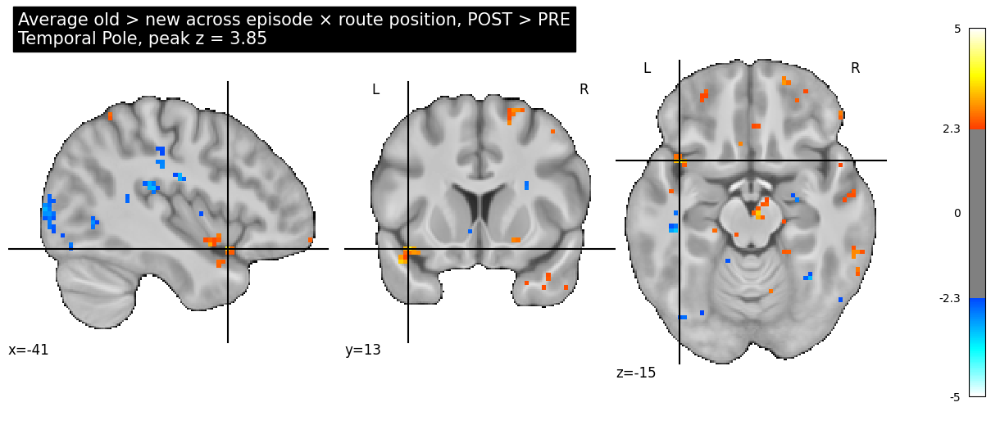

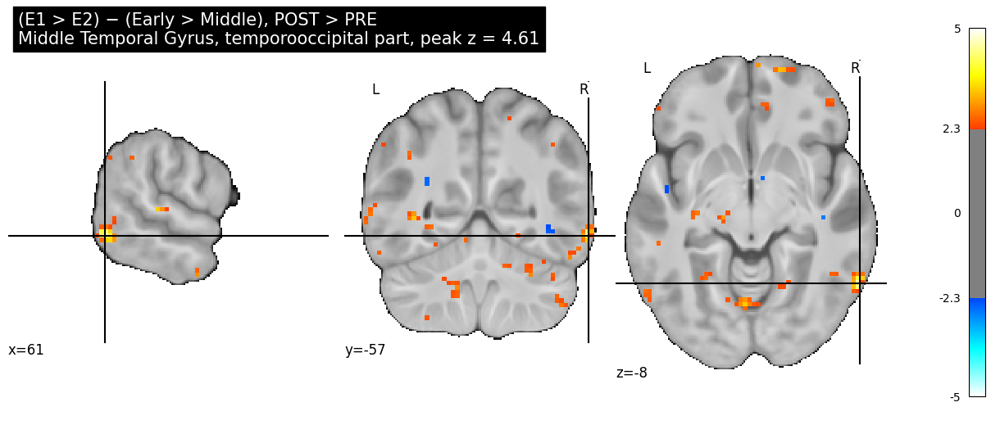

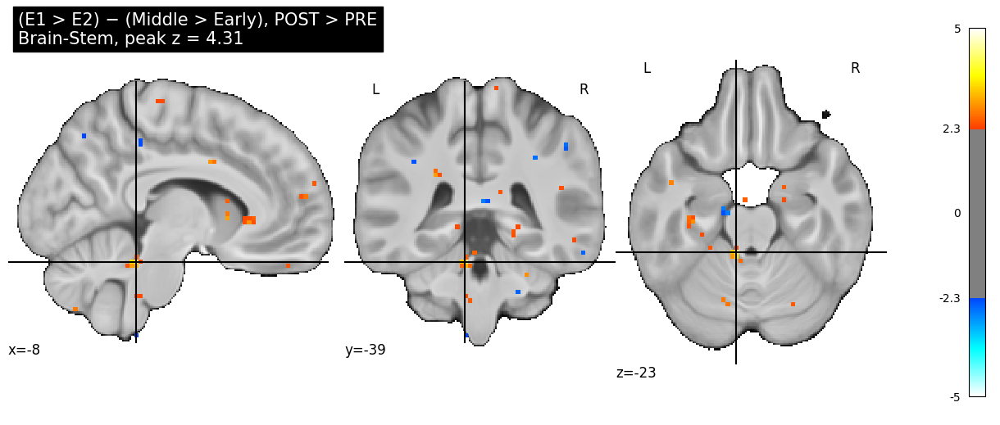

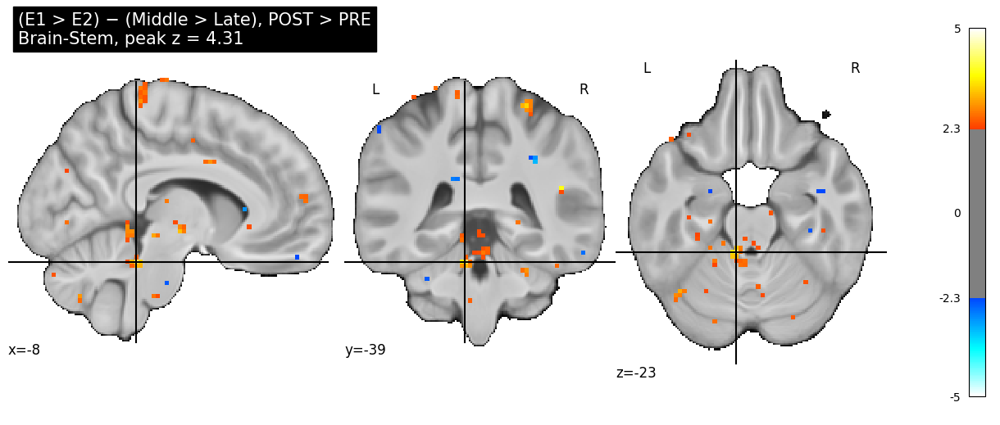

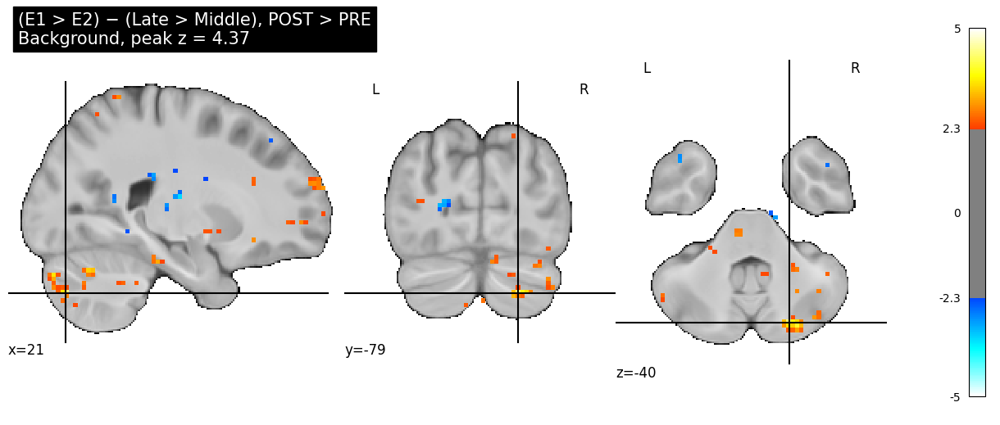

...

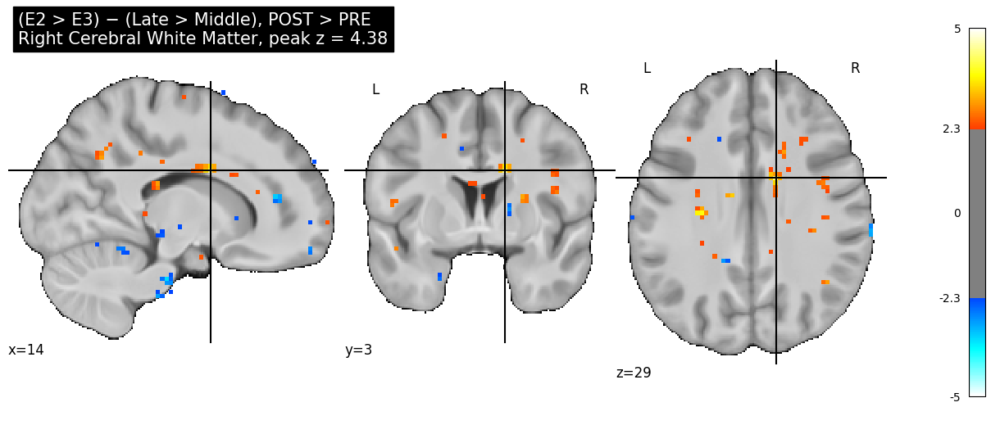

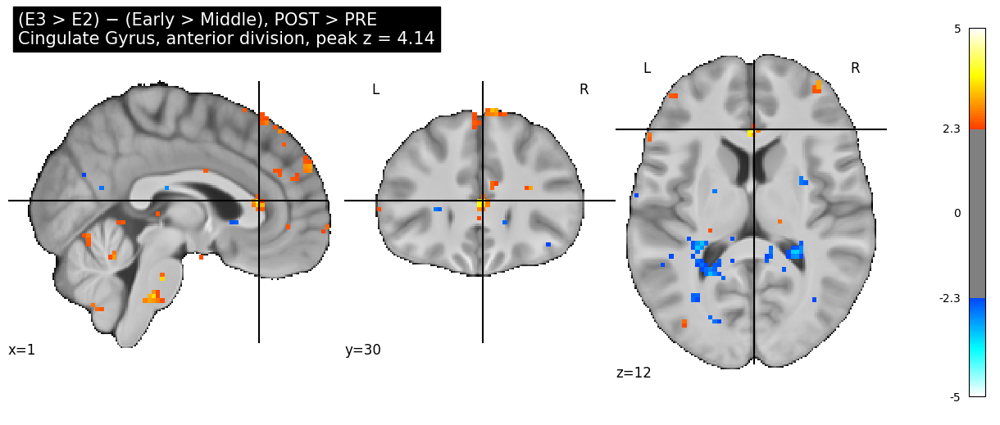

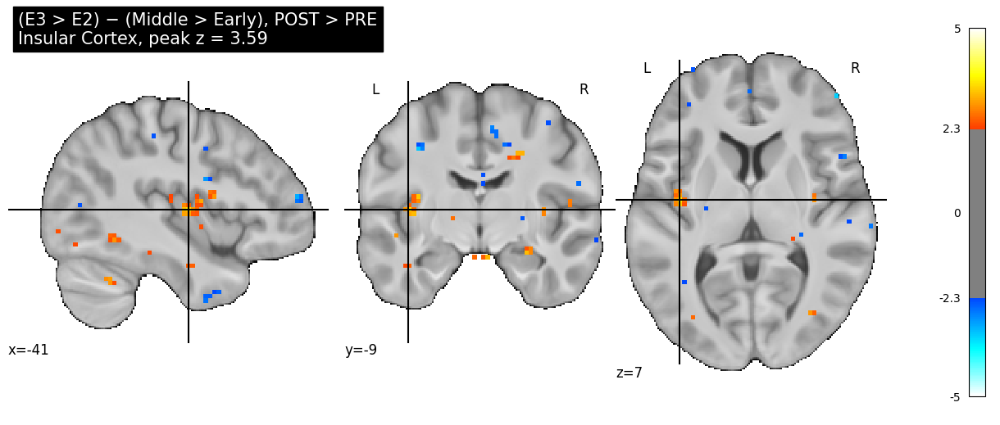

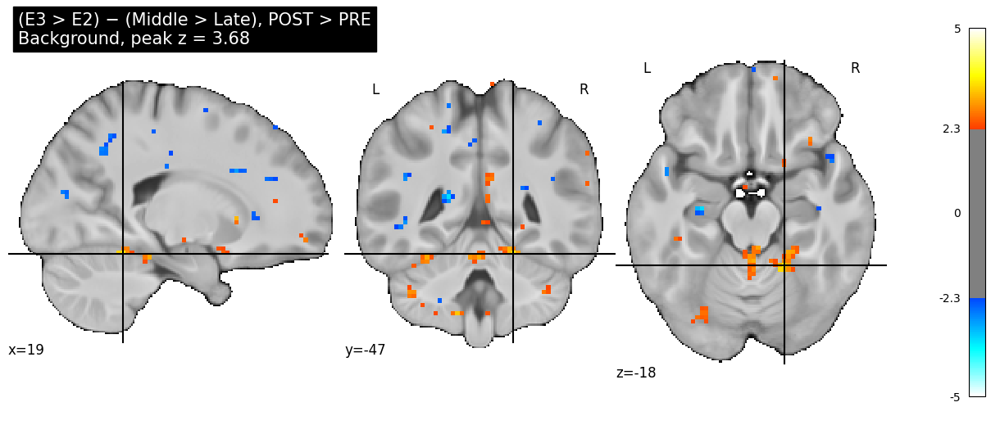

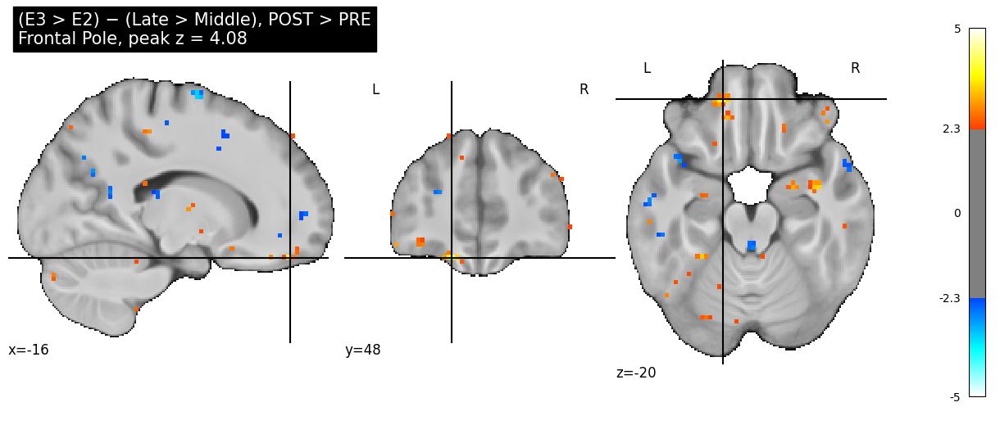

,contrast,figure_path,cut_x,cut_y,cut_z
0,temporal_spatial_average_old_gt_new_post_gt_pre,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/figures/pre_post_temporal_minus_spatial_glm_temporal_spatial_average_old_gt_new_post_gt_pre_smo...,-41.0,13.0,-15.5
1,temporal_e1_gt_e2_minus_spatial_early_gt_middle_post_gt_pre,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/figures/pre_post_temporal_minus_spatial_glm_temporal_e1_gt_e2_minus_spatial_early_gt_middle_pos...,61.5,-57.0,-8.0
2,temporal_e1_gt_e2_minus_spatial_middle_gt_early_post_gt_pre,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/figures/pre_post_temporal_minus_spatial_glm_temporal_e1_gt_e2_minus_spatial_middle_gt_early_pos...,-8.5,-39.5,-23.0
3,temporal_e1_gt_e2_minus_spatial_middle_gt_late_post_gt_pre,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/figures/pre_post_temporal_minus_spatial_glm_temporal_e1_gt_e2_minus_spatial_middle_gt_late_post...,-8.5,-39.5,-23.0
4,temporal_e1_gt_e2_minus_spatial_late_gt_middle_post_gt_pre,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/figures/pre_post_temporal_minus_spatial_glm_temporal_e1_gt_e2_minus_spatial_late_gt_middle_post...,21.5,-79.5,-40.5
5,temporal_e2_gt_e1_minus_spatial_early_gt_middle_post_gt_pre,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/figures/pre_post_temporal_minus_spatial_glm_temporal_e2_gt_e1_minus_spatial_early_gt_middle_pos...,16.5,-24.5,34.5
6,temporal_e2_gt_e1_minus_spatial_middle_gt_early_post_gt_pre,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/figures/pre_post_temporal_minus_spatial_glm_temporal_e2_gt_e1_minus_spatial_middle_gt_early_pos...,-28.5,-24.5,29.5
7,temporal_e2_gt_e1_minus_spatial_middle_gt_late_post_gt_pre,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/figures/pre_post_temporal_minus_spatial_glm_temporal_e2_gt_e1_minus_spatial_middle_gt_late_post...,46.5,-69.5,32.0
8,temporal_e2_gt_e1_minus_spatial_late_gt_middle_post_gt_pre,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/figures/pre_post_temporal_minus_spatial_glm_temporal_e2_gt_e1_minus_spatial_late_gt_middle_post...,14.0,15.5,27.0
9,temporal_e1_gt_e3_minus_spatial_early_gt_late_post_gt_pre,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/figures/pre_post_temporal_minus_spatial_glm_temporal_e1_gt_e3_minus_spatial_early_gt_late_post_...,-26.0,-17.0,4.5


Saved: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/tables/pre_post_temporal_minus_spatial_glm_temporal_minus_spatial_plot_index_smoothed5mm.csv


In [25]:
# ============================================================
# 11. Plot main Temporal − Spatial contrasts on mean T1w background
# ============================================================

plot_rows = []

second_level_by_contrast = second_level_table.set_index("contrast")

for contrast_name in main_contrasts:
    if contrast_name not in second_level_by_contrast.index:
        print("Skipping missing contrast:", contrast_name)
        continue

    z_map_path = second_level_by_contrast.loc[contrast_name, "z_map_path"]

    table = cluster_details_labeled.query(
        "contrast == @contrast_name and threshold_label == 'z_gt_2.33'"
    ).copy()

    if len(table) > 0:
        top = table.sort_values("Peak Stat", ascending=False).iloc[0]
        cut_coords = (float(top["X"]), float(top["Y"]), float(top["Z"]))
        atlas_label = top.get("harvard_oxford_cortical_label", "")
        if atlas_label == "Background":
            atlas_label = top.get("harvard_oxford_subcortical_label", "Background")
        title = (
            f"{plot_title_map.get(contrast_name, contrast_name)}\n"
            f"{atlas_label}, peak z = {float(top['Peak Stat']):.2f}"
        )
    else:
        cut_coords = (0, 0, 0)
        title = plot_title_map.get(contrast_name, contrast_name)

    fig_path = dirs["figures"] / f"{ANALYSIS_NAME}_{contrast_name}_{SMOOTHING_LABEL}_zgt2p33.png"

    plot_group_stat_map(
        z_map_path=z_map_path,
        cut_coords=cut_coords,
        title=title,
        threshold=2.33,
        vmax=5.0,
        output_path=fig_path,
        bg_img=mean_t1w_img if USE_MEAN_T1W_BACKGROUND else None,
        dim=-0.2,
    )

    plot_rows.append({
        "contrast": contrast_name,
        "figure_path": str(fig_path),
        "cut_x": cut_coords[0],
        "cut_y": cut_coords[1],
        "cut_z": cut_coords[2],
    })

plot_index = pd.DataFrame(plot_rows)
plot_index_path = dirs["tables"] / f"{ANALYSIS_NAME}_temporal_minus_spatial_plot_index_{SMOOTHING_LABEL}.csv"
plot_index.to_csv(plot_index_path, index=False)
display(plot_index)
print("Saved:", plot_index_path)


In [ ]:
# ============================================================
# 12. Save optional interactive views
# ============================================================

interactive_rows = []

for contrast_name in main_contrasts:
    if contrast_name not in set(second_level_table["contrast"]):
        print("Skipping missing contrast:", contrast_name)
        continue

    z_map_path = second_level_table.set_index("contrast").loc[contrast_name, "z_map_path"]
    html_path = dirs["interactive"] / f"{ANALYSIS_NAME}_{contrast_name}_{SMOOTHING_LABEL}_interactive.html"
    view = make_interactive_view(
        z_map_path,
        threshold=2.33,
        title=plot_title_map.get(contrast_name, contrast_name),
    )
    view.save_as_html(str(html_path))
    interactive_rows.append({"contrast": contrast_name, "interactive_html_path": str(html_path)})

interactive_index = pd.DataFrame(interactive_rows)
interactive_index_path = dirs["tables"] / f"{ANALYSIS_NAME}_temporal_minus_spatial_interactive_index_{SMOOTHING_LABEL}.csv"
interactive_index.to_csv(interactive_index_path, index=False)

display(interactive_index)
print("Saved:", interactive_index_path)


## ROI visualization with hippocampus/amygdala masks

For each selected Temporal − Spatial contrast, this cell creates:

- an ROI-masked interactive HTML view showing only activity inside the group consensus hippoAmyg mask;
- a static whole-brain z-map with the hippoAmyg ROI contour overlaid;
- a table counting suprathreshold positive/negative voxels inside the ROI.

This is intended for inspecting possible anterior/posterior hippocampal involvement in Temporal − Spatial gradients.


ROI root: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/rois/hippoAmyg_02022024
Saving ROI figures to: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/figures/roi_mask_overlays
Saving ROI interactive views to: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/interactive_views/roi_masked_views
Loaded 54 unilateral ROI masks.
Saved group consensus ROI mask:
/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/tables/roi_overlap/group_consensus_hippoAmyg_threshold-0.50_mask.nii.gz


/home/kroczak/.conda/envs/island/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


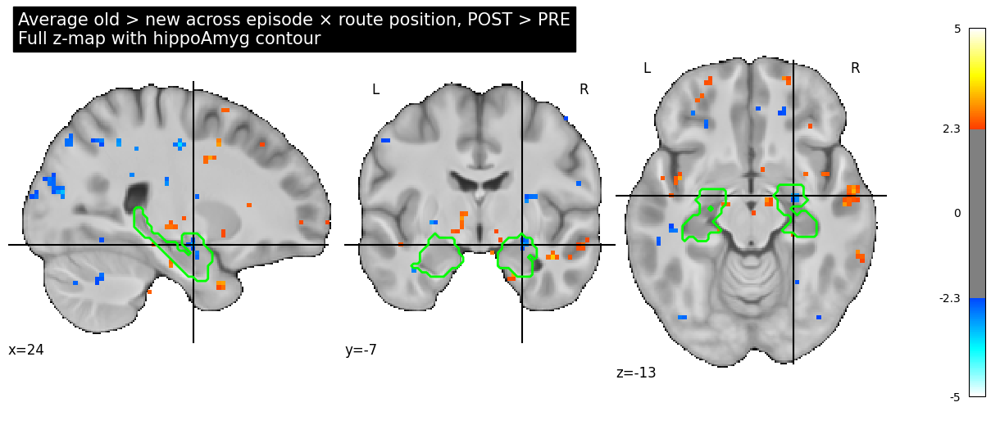

Contrast: temporal_spatial_average_old_gt_new_post_gt_pre
Title: Average old > new across episode × route position, POST > PRE
Saved ROI-masked interactive HTML: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/interactive_views/roi_masked_views/temporal_spatial_average_old_gt_new_post_gt_pre_hippoAmyg_masked_interactive.html
Saved contour overlay PNG: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/figures/roi_mask_overlays/temporal_spatial_average_old_gt_new_post_gt_pre_hippoAmyg_contour_overlay.png
ROI stats: {'roi_voxels': 1544, 'positive_suprathreshold_voxels_inside_roi': 5, 'negative_suprathreshold_voxels_inside_roi': 10, 'max_z_inside_roi': 2.802212715148926, 'min_z_inside_roi': -3.2346668243408203, 'contrast': 'temporal_spatial_average_old_gt_new_post_gt_pre', 'priority': '12b_average_old_new_post_pre_control', 'display_title': 'Averag

/home/kroczak/.conda/envs/island/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


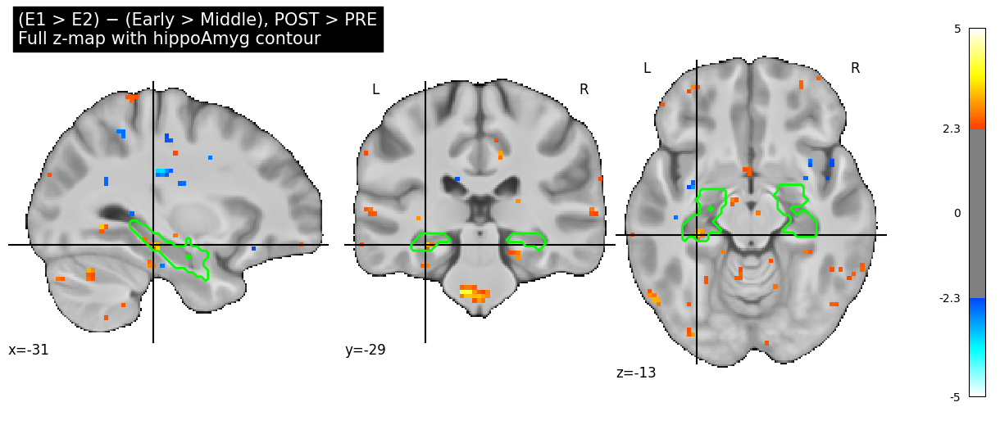

Contrast: temporal_e1_gt_e2_minus_spatial_early_gt_middle_post_gt_pre
Title: (E1 > E2) − (Early > Middle), POST > PRE
Saved ROI-masked interactive HTML: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/interactive_views/roi_masked_views/temporal_e1_gt_e2_minus_spatial_early_gt_middle_post_gt_pre_hippoAmyg_masked_interactive.html
Saved contour overlay PNG: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/figures/roi_mask_overlays/temporal_e1_gt_e2_minus_spatial_early_gt_middle_post_gt_pre_hippoAmyg_contour_overlay.png
ROI stats: {'roi_voxels': 1544, 'positive_suprathreshold_voxels_inside_roi': 21, 'negative_suprathreshold_voxels_inside_roi': 0, 'max_z_inside_roi': 3.534390926361084, 'min_z_inside_roi': -2.2000412940979004, 'contrast': 'temporal_e1_gt_e2_minus_spatial_early_gt_middle_post_gt_pre', 'priority': '12b_temporal_minus_spatial_small_tim

/home/kroczak/.conda/envs/island/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


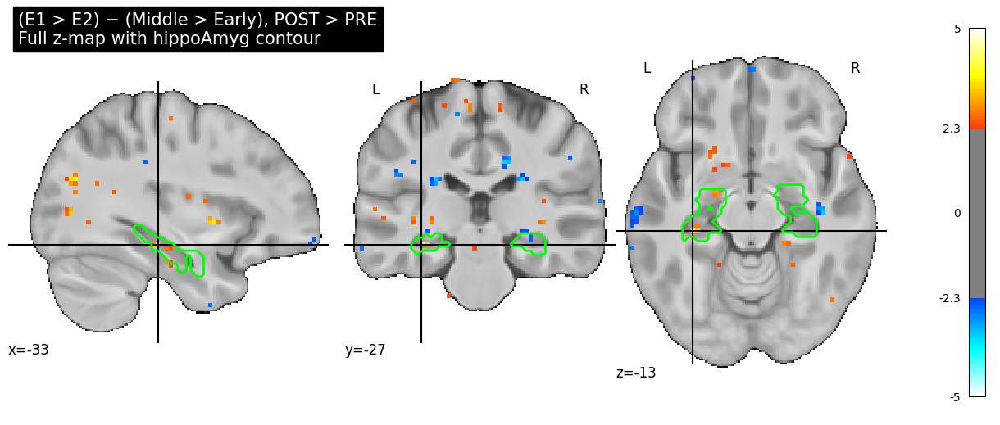

Contrast: temporal_e1_gt_e2_minus_spatial_middle_gt_early_post_gt_pre
Title: (E1 > E2) − (Middle > Early), POST > PRE
Saved ROI-masked interactive HTML: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/interactive_views/roi_masked_views/temporal_e1_gt_e2_minus_spatial_middle_gt_early_post_gt_pre_hippoAmyg_masked_interactive.html
Saved contour overlay PNG: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/figures/roi_mask_overlays/temporal_e1_gt_e2_minus_spatial_middle_gt_early_post_gt_pre_hippoAmyg_contour_overlay.png
ROI stats: {'roi_voxels': 1544, 'positive_suprathreshold_voxels_inside_roi': 18, 'negative_suprathreshold_voxels_inside_roi': 5, 'max_z_inside_roi': 4.024313449859619, 'min_z_inside_roi': -2.704479455947876, 'contrast': 'temporal_e1_gt_e2_minus_spatial_middle_gt_early_post_gt_pre', 'priority': '12b_temporal_minus_spatial_small_time

/home/kroczak/.conda/envs/island/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


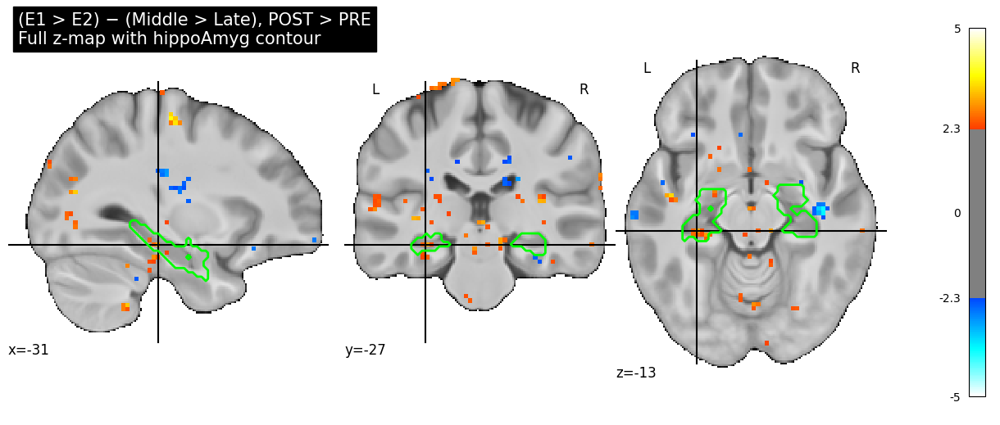

Contrast: temporal_e1_gt_e2_minus_spatial_middle_gt_late_post_gt_pre
Title: (E1 > E2) − (Middle > Late), POST > PRE
Saved ROI-masked interactive HTML: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/interactive_views/roi_masked_views/temporal_e1_gt_e2_minus_spatial_middle_gt_late_post_gt_pre_hippoAmyg_masked_interactive.html
Saved contour overlay PNG: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/figures/roi_mask_overlays/temporal_e1_gt_e2_minus_spatial_middle_gt_late_post_gt_pre_hippoAmyg_contour_overlay.png
ROI stats: {'roi_voxels': 1544, 'positive_suprathreshold_voxels_inside_roi': 22, 'negative_suprathreshold_voxels_inside_roi': 11, 'max_z_inside_roi': 3.089733362197876, 'min_z_inside_roi': -2.9653520584106445, 'contrast': 'temporal_e1_gt_e2_minus_spatial_middle_gt_late_post_gt_pre', 'priority': '12b_temporal_minus_spatial_small_time_mi

/home/kroczak/.conda/envs/island/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


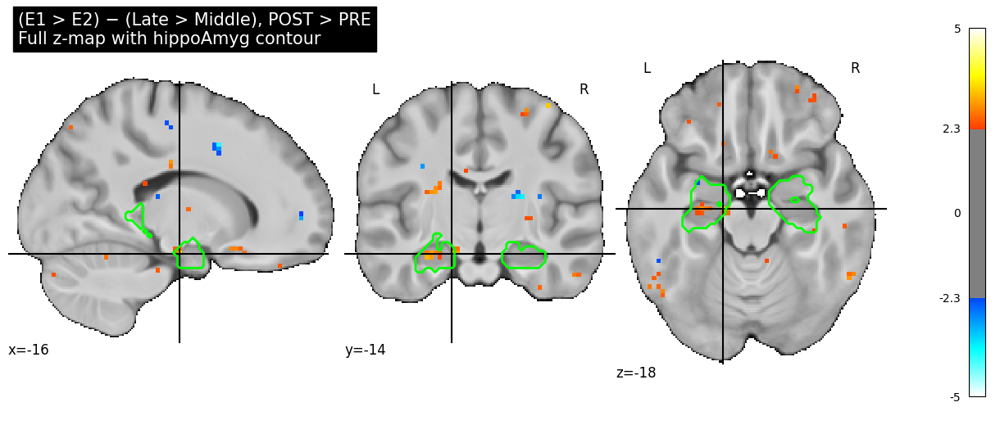

Contrast: temporal_e1_gt_e2_minus_spatial_late_gt_middle_post_gt_pre
Title: (E1 > E2) − (Late > Middle), POST > PRE
Saved ROI-masked interactive HTML: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/interactive_views/roi_masked_views/temporal_e1_gt_e2_minus_spatial_late_gt_middle_post_gt_pre_hippoAmyg_masked_interactive.html
Saved contour overlay PNG: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/figures/roi_mask_overlays/temporal_e1_gt_e2_minus_spatial_late_gt_middle_post_gt_pre_hippoAmyg_contour_overlay.png
ROI stats: {'roi_voxels': 1544, 'positive_suprathreshold_voxels_inside_roi': 30, 'negative_suprathreshold_voxels_inside_roi': 1, 'max_z_inside_roi': 3.3787593841552734, 'min_z_inside_roi': -2.3679115772247314, 'contrast': 'temporal_e1_gt_e2_minus_spatial_late_gt_middle_post_gt_pre', 'priority': '12b_temporal_minus_spatial_small_time_mi

/home/kroczak/.conda/envs/island/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


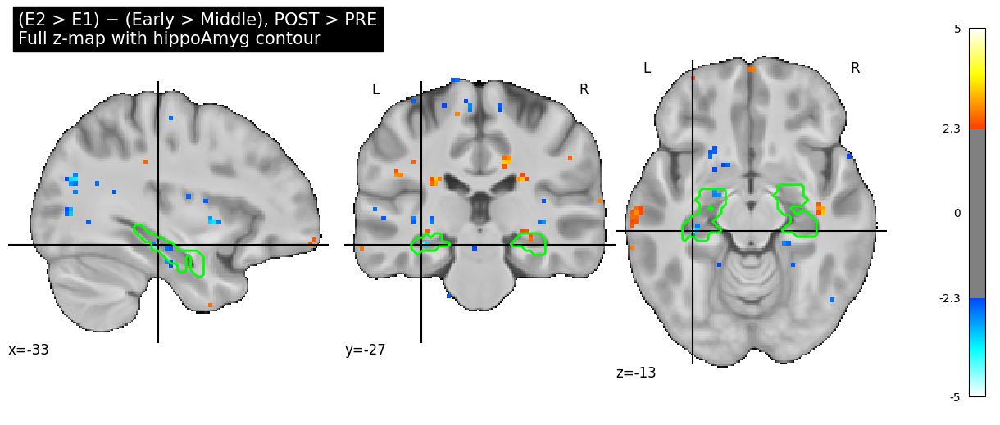

Contrast: temporal_e2_gt_e1_minus_spatial_early_gt_middle_post_gt_pre
Title: (E2 > E1) − (Early > Middle), POST > PRE
Saved ROI-masked interactive HTML: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/interactive_views/roi_masked_views/temporal_e2_gt_e1_minus_spatial_early_gt_middle_post_gt_pre_hippoAmyg_masked_interactive.html
Saved contour overlay PNG: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/figures/roi_mask_overlays/temporal_e2_gt_e1_minus_spatial_early_gt_middle_post_gt_pre_hippoAmyg_contour_overlay.png
ROI stats: {'roi_voxels': 1544, 'positive_suprathreshold_voxels_inside_roi': 5, 'negative_suprathreshold_voxels_inside_roi': 18, 'max_z_inside_roi': 2.704479455947876, 'min_z_inside_roi': -4.024313449859619, 'contrast': 'temporal_e2_gt_e1_minus_spatial_early_gt_middle_post_gt_pre', 'priority': '12b_temporal_minus_spatial_small_time

/home/kroczak/.conda/envs/island/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


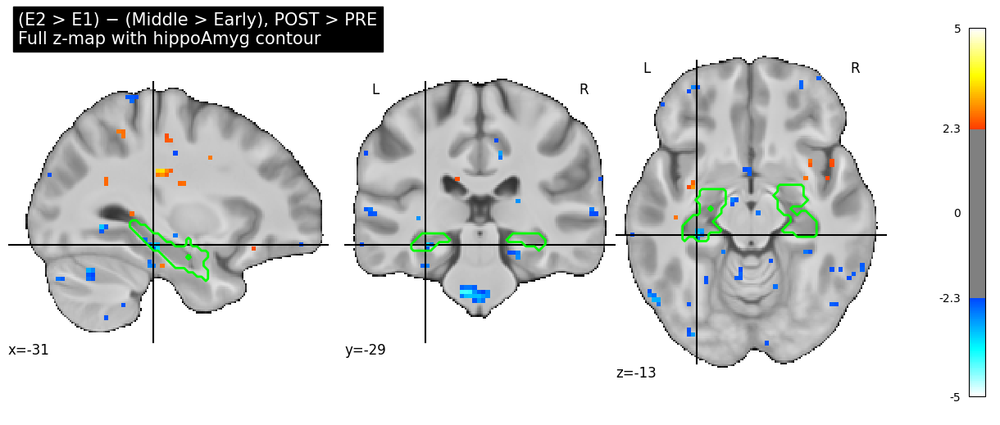

Contrast: temporal_e2_gt_e1_minus_spatial_middle_gt_early_post_gt_pre
Title: (E2 > E1) − (Middle > Early), POST > PRE
Saved ROI-masked interactive HTML: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/interactive_views/roi_masked_views/temporal_e2_gt_e1_minus_spatial_middle_gt_early_post_gt_pre_hippoAmyg_masked_interactive.html
Saved contour overlay PNG: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/figures/roi_mask_overlays/temporal_e2_gt_e1_minus_spatial_middle_gt_early_post_gt_pre_hippoAmyg_contour_overlay.png
ROI stats: {'roi_voxels': 1544, 'positive_suprathreshold_voxels_inside_roi': 0, 'negative_suprathreshold_voxels_inside_roi': 21, 'max_z_inside_roi': 2.2000412940979004, 'min_z_inside_roi': -3.534390926361084, 'contrast': 'temporal_e2_gt_e1_minus_spatial_middle_gt_early_post_gt_pre', 'priority': '12b_temporal_minus_spatial_small_tim

/home/kroczak/.conda/envs/island/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


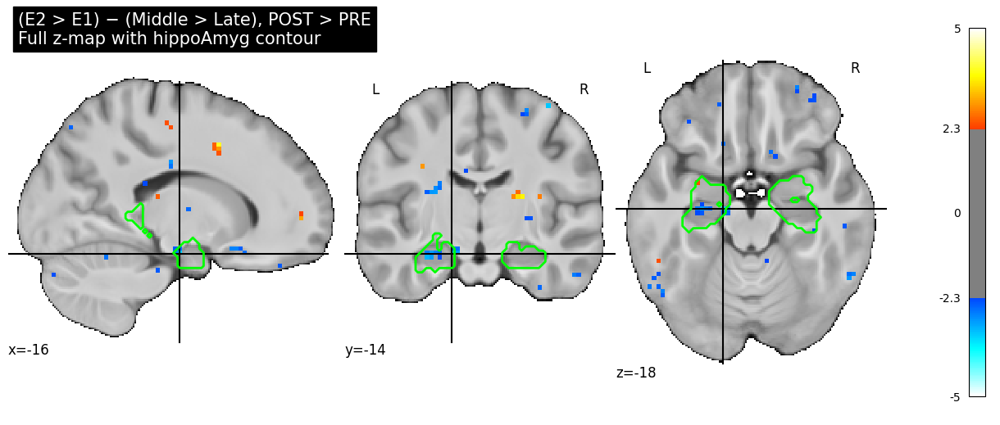

Contrast: temporal_e2_gt_e1_minus_spatial_middle_gt_late_post_gt_pre
Title: (E2 > E1) − (Middle > Late), POST > PRE
Saved ROI-masked interactive HTML: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/interactive_views/roi_masked_views/temporal_e2_gt_e1_minus_spatial_middle_gt_late_post_gt_pre_hippoAmyg_masked_interactive.html
Saved contour overlay PNG: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/figures/roi_mask_overlays/temporal_e2_gt_e1_minus_spatial_middle_gt_late_post_gt_pre_hippoAmyg_contour_overlay.png
ROI stats: {'roi_voxels': 1544, 'positive_suprathreshold_voxels_inside_roi': 1, 'negative_suprathreshold_voxels_inside_roi': 30, 'max_z_inside_roi': 2.3679115772247314, 'min_z_inside_roi': -3.3787593841552734, 'contrast': 'temporal_e2_gt_e1_minus_spatial_middle_gt_late_post_gt_pre', 'priority': '12b_temporal_minus_spatial_small_time_mi

/home/kroczak/.conda/envs/island/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


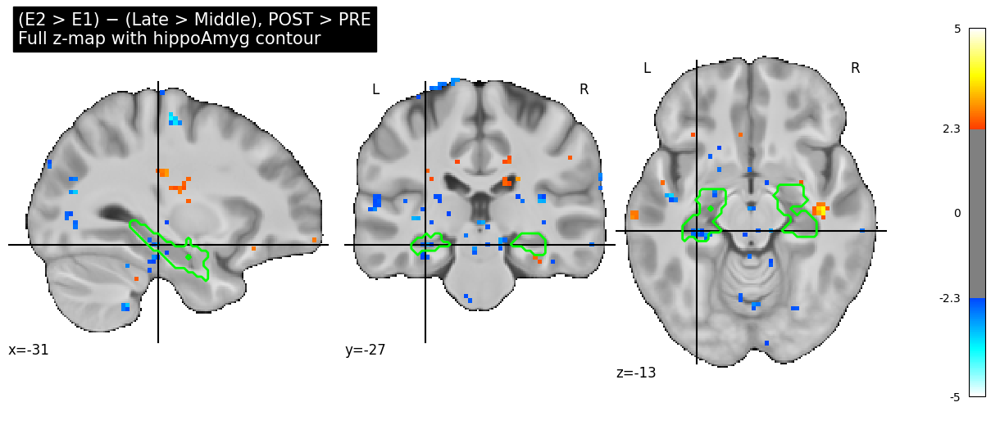

Contrast: temporal_e2_gt_e1_minus_spatial_late_gt_middle_post_gt_pre
Title: (E2 > E1) − (Late > Middle), POST > PRE
Saved ROI-masked interactive HTML: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/interactive_views/roi_masked_views/temporal_e2_gt_e1_minus_spatial_late_gt_middle_post_gt_pre_hippoAmyg_masked_interactive.html
Saved contour overlay PNG: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/figures/roi_mask_overlays/temporal_e2_gt_e1_minus_spatial_late_gt_middle_post_gt_pre_hippoAmyg_contour_overlay.png
ROI stats: {'roi_voxels': 1544, 'positive_suprathreshold_voxels_inside_roi': 11, 'negative_suprathreshold_voxels_inside_roi': 22, 'max_z_inside_roi': 2.9653520584106445, 'min_z_inside_roi': -3.089733362197876, 'contrast': 'temporal_e2_gt_e1_minus_spatial_late_gt_middle_post_gt_pre', 'priority': '12b_temporal_minus_spatial_small_time_mi

/home/kroczak/.conda/envs/island/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


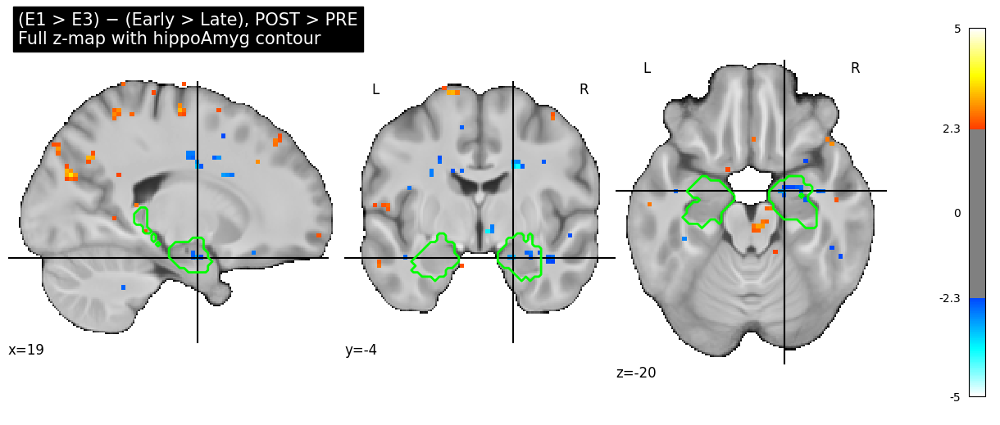

Contrast: temporal_e1_gt_e3_minus_spatial_early_gt_late_post_gt_pre
Title: (E1 > E3) − (Early > Late), POST > PRE
Saved ROI-masked interactive HTML: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/interactive_views/roi_masked_views/temporal_e1_gt_e3_minus_spatial_early_gt_late_post_gt_pre_hippoAmyg_masked_interactive.html
Saved contour overlay PNG: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/figures/roi_mask_overlays/temporal_e1_gt_e3_minus_spatial_early_gt_late_post_gt_pre_hippoAmyg_contour_overlay.png
ROI stats: {'roi_voxels': 1544, 'positive_suprathreshold_voxels_inside_roi': 7, 'negative_suprathreshold_voxels_inside_roi': 28, 'max_z_inside_roi': 2.9721856117248535, 'min_z_inside_roi': -3.182189464569092, 'contrast': 'temporal_e1_gt_e3_minus_spatial_early_gt_late_post_gt_pre', 'priority': '12b_temporal_minus_spatial_large_time_minus_la

/home/kroczak/.conda/envs/island/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


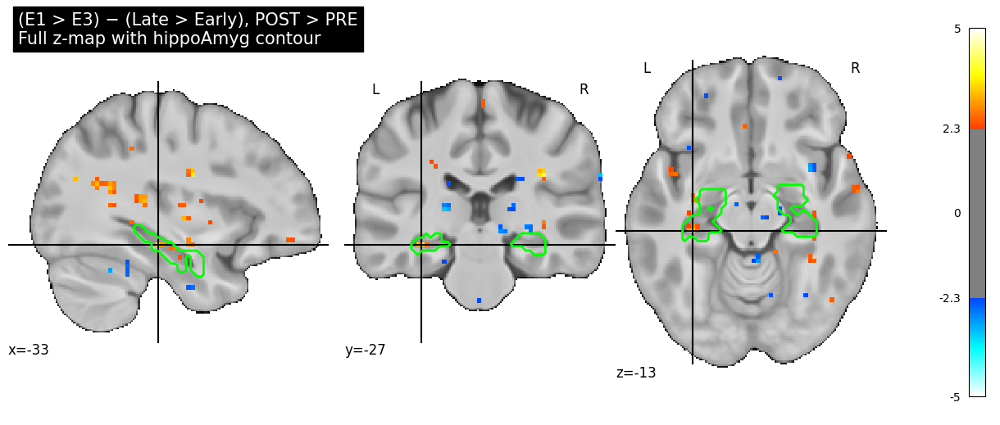

Contrast: temporal_e1_gt_e3_minus_spatial_late_gt_early_post_gt_pre
Title: (E1 > E3) − (Late > Early), POST > PRE
Saved ROI-masked interactive HTML: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/interactive_views/roi_masked_views/temporal_e1_gt_e3_minus_spatial_late_gt_early_post_gt_pre_hippoAmyg_masked_interactive.html
Saved contour overlay PNG: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/figures/roi_mask_overlays/temporal_e1_gt_e3_minus_spatial_late_gt_early_post_gt_pre_hippoAmyg_contour_overlay.png
ROI stats: {'roi_voxels': 1544, 'positive_suprathreshold_voxels_inside_roi': 39, 'negative_suprathreshold_voxels_inside_roi': 9, 'max_z_inside_roi': 3.735384702682495, 'min_z_inside_roi': -3.128007173538208, 'contrast': 'temporal_e1_gt_e3_minus_spatial_late_gt_early_post_gt_pre', 'priority': '12b_temporal_minus_spatial_large_time_minus_lar

/home/kroczak/.conda/envs/island/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


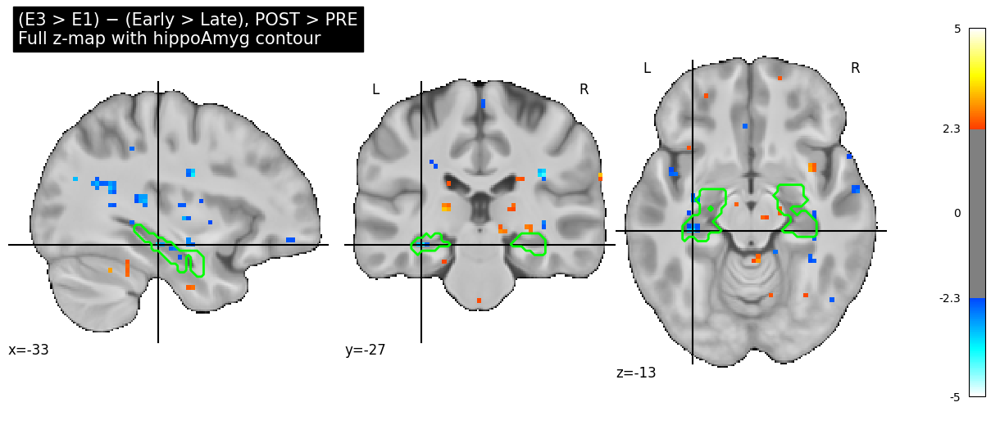

Contrast: temporal_e3_gt_e1_minus_spatial_early_gt_late_post_gt_pre
Title: (E3 > E1) − (Early > Late), POST > PRE
Saved ROI-masked interactive HTML: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/interactive_views/roi_masked_views/temporal_e3_gt_e1_minus_spatial_early_gt_late_post_gt_pre_hippoAmyg_masked_interactive.html
Saved contour overlay PNG: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/figures/roi_mask_overlays/temporal_e3_gt_e1_minus_spatial_early_gt_late_post_gt_pre_hippoAmyg_contour_overlay.png
ROI stats: {'roi_voxels': 1544, 'positive_suprathreshold_voxels_inside_roi': 9, 'negative_suprathreshold_voxels_inside_roi': 39, 'max_z_inside_roi': 3.128007173538208, 'min_z_inside_roi': -3.735384702682495, 'contrast': 'temporal_e3_gt_e1_minus_spatial_early_gt_late_post_gt_pre', 'priority': '12b_temporal_minus_spatial_large_time_minus_lar

/home/kroczak/.conda/envs/island/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


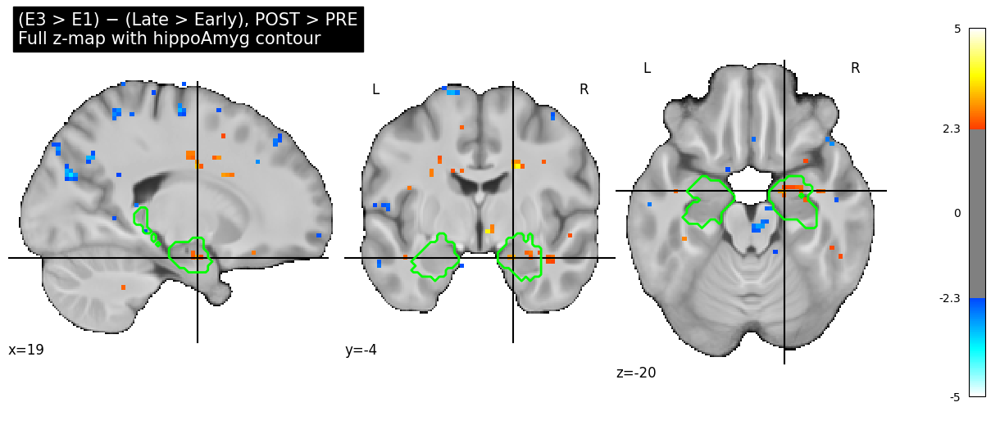

Contrast: temporal_e3_gt_e1_minus_spatial_late_gt_early_post_gt_pre
Title: (E3 > E1) − (Late > Early), POST > PRE
Saved ROI-masked interactive HTML: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/interactive_views/roi_masked_views/temporal_e3_gt_e1_minus_spatial_late_gt_early_post_gt_pre_hippoAmyg_masked_interactive.html
Saved contour overlay PNG: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/figures/roi_mask_overlays/temporal_e3_gt_e1_minus_spatial_late_gt_early_post_gt_pre_hippoAmyg_contour_overlay.png
ROI stats: {'roi_voxels': 1544, 'positive_suprathreshold_voxels_inside_roi': 28, 'negative_suprathreshold_voxels_inside_roi': 7, 'max_z_inside_roi': 3.182189464569092, 'min_z_inside_roi': -2.9721856117248535, 'contrast': 'temporal_e3_gt_e1_minus_spatial_late_gt_early_post_gt_pre', 'priority': '12b_temporal_minus_spatial_large_time_minus_la

/home/kroczak/.conda/envs/island/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


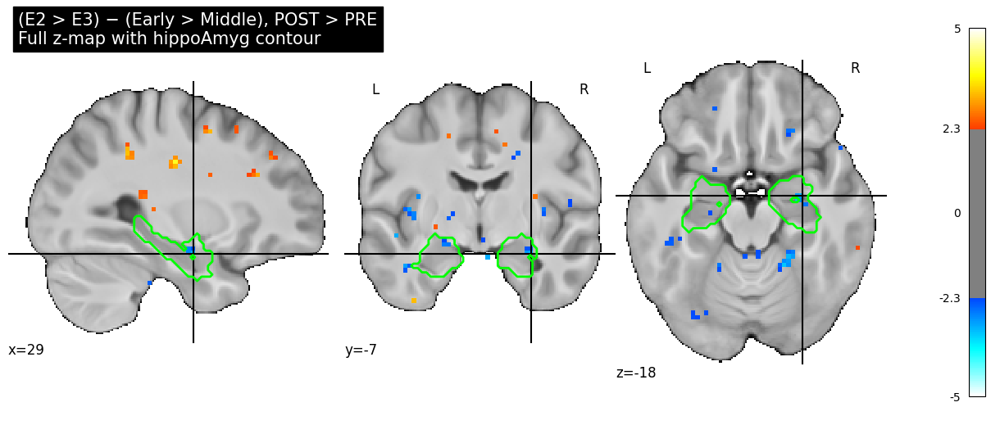

Contrast: temporal_e2_gt_e3_minus_spatial_early_gt_middle_post_gt_pre
Title: (E2 > E3) − (Early > Middle), POST > PRE
Saved ROI-masked interactive HTML: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/interactive_views/roi_masked_views/temporal_e2_gt_e3_minus_spatial_early_gt_middle_post_gt_pre_hippoAmyg_masked_interactive.html
Saved contour overlay PNG: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/figures/roi_mask_overlays/temporal_e2_gt_e3_minus_spatial_early_gt_middle_post_gt_pre_hippoAmyg_contour_overlay.png
ROI stats: {'roi_voxels': 1544, 'positive_suprathreshold_voxels_inside_roi': 1, 'negative_suprathreshold_voxels_inside_roi': 19, 'max_z_inside_roi': 2.608140468597412, 'min_z_inside_roi': -3.154998540878296, 'contrast': 'temporal_e2_gt_e3_minus_spatial_early_gt_middle_post_gt_pre', 'priority': '12b_temporal_minus_spatial_small_time

/home/kroczak/.conda/envs/island/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


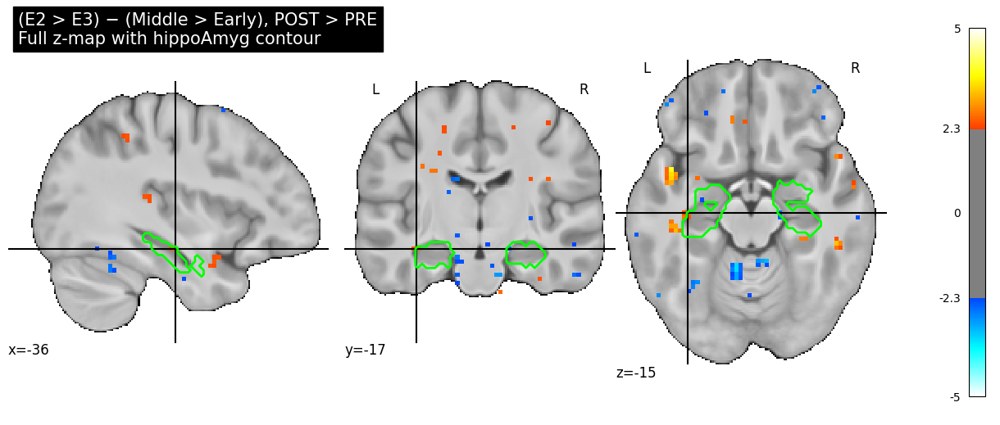

Contrast: temporal_e2_gt_e3_minus_spatial_middle_gt_early_post_gt_pre
Title: (E2 > E3) − (Middle > Early), POST > PRE
Saved ROI-masked interactive HTML: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/interactive_views/roi_masked_views/temporal_e2_gt_e3_minus_spatial_middle_gt_early_post_gt_pre_hippoAmyg_masked_interactive.html
Saved contour overlay PNG: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/figures/roi_mask_overlays/temporal_e2_gt_e3_minus_spatial_middle_gt_early_post_gt_pre_hippoAmyg_contour_overlay.png
ROI stats: {'roi_voxels': 1544, 'positive_suprathreshold_voxels_inside_roi': 3, 'negative_suprathreshold_voxels_inside_roi': 7, 'max_z_inside_roi': 2.6327080726623535, 'min_z_inside_roi': -2.565261125564575, 'contrast': 'temporal_e2_gt_e3_minus_spatial_middle_gt_early_post_gt_pre', 'priority': '12b_temporal_minus_spatial_small_time

/home/kroczak/.conda/envs/island/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


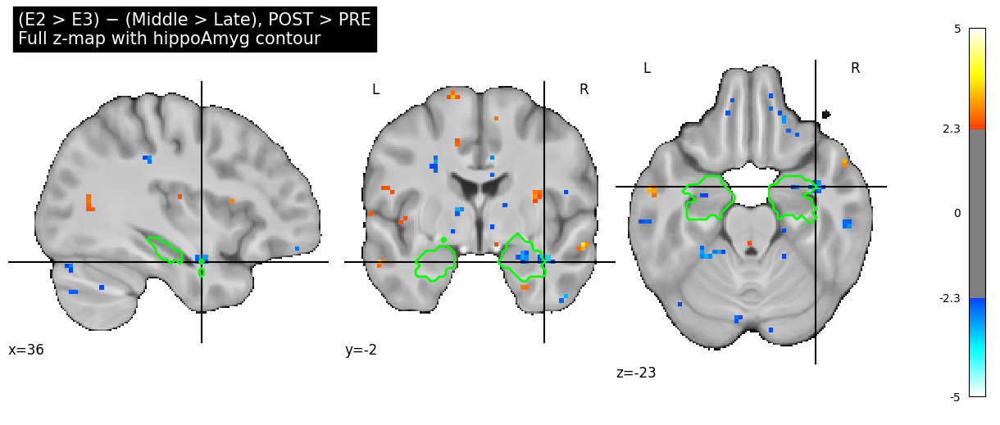

Contrast: temporal_e2_gt_e3_minus_spatial_middle_gt_late_post_gt_pre
Title: (E2 > E3) − (Middle > Late), POST > PRE
Saved ROI-masked interactive HTML: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/interactive_views/roi_masked_views/temporal_e2_gt_e3_minus_spatial_middle_gt_late_post_gt_pre_hippoAmyg_masked_interactive.html
Saved contour overlay PNG: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/figures/roi_mask_overlays/temporal_e2_gt_e3_minus_spatial_middle_gt_late_post_gt_pre_hippoAmyg_contour_overlay.png
ROI stats: {'roi_voxels': 1544, 'positive_suprathreshold_voxels_inside_roi': 4, 'negative_suprathreshold_voxels_inside_roi': 21, 'max_z_inside_roi': 2.893423557281494, 'min_z_inside_roi': -3.2582626342773438, 'contrast': 'temporal_e2_gt_e3_minus_spatial_middle_gt_late_post_gt_pre', 'priority': '12b_temporal_minus_spatial_small_time_min

/home/kroczak/.conda/envs/island/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


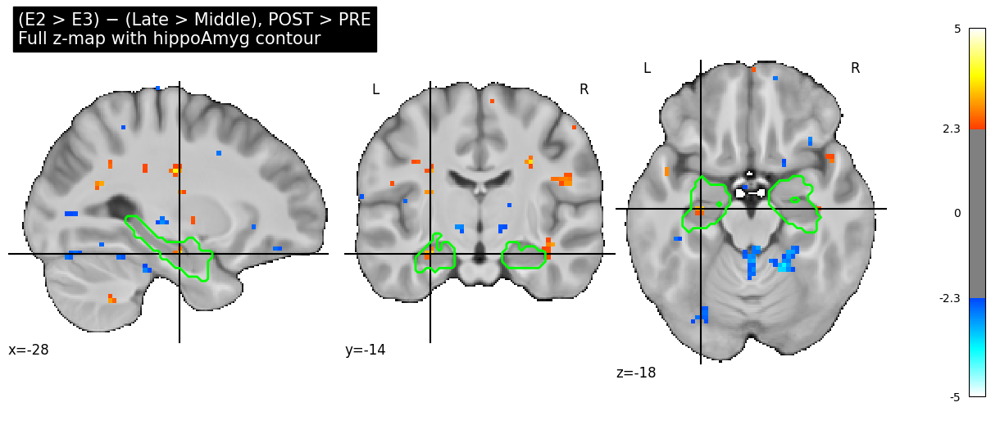

Contrast: temporal_e2_gt_e3_minus_spatial_late_gt_middle_post_gt_pre
Title: (E2 > E3) − (Late > Middle), POST > PRE
Saved ROI-masked interactive HTML: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/interactive_views/roi_masked_views/temporal_e2_gt_e3_minus_spatial_late_gt_middle_post_gt_pre_hippoAmyg_masked_interactive.html
Saved contour overlay PNG: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/figures/roi_mask_overlays/temporal_e2_gt_e3_minus_spatial_late_gt_middle_post_gt_pre_hippoAmyg_contour_overlay.png
ROI stats: {'roi_voxels': 1544, 'positive_suprathreshold_voxels_inside_roi': 13, 'negative_suprathreshold_voxels_inside_roi': 14, 'max_z_inside_roi': 3.4390501976013184, 'min_z_inside_roi': -3.180715560913086, 'contrast': 'temporal_e2_gt_e3_minus_spatial_late_gt_middle_post_gt_pre', 'priority': '12b_temporal_minus_spatial_small_time_mi

/home/kroczak/.conda/envs/island/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


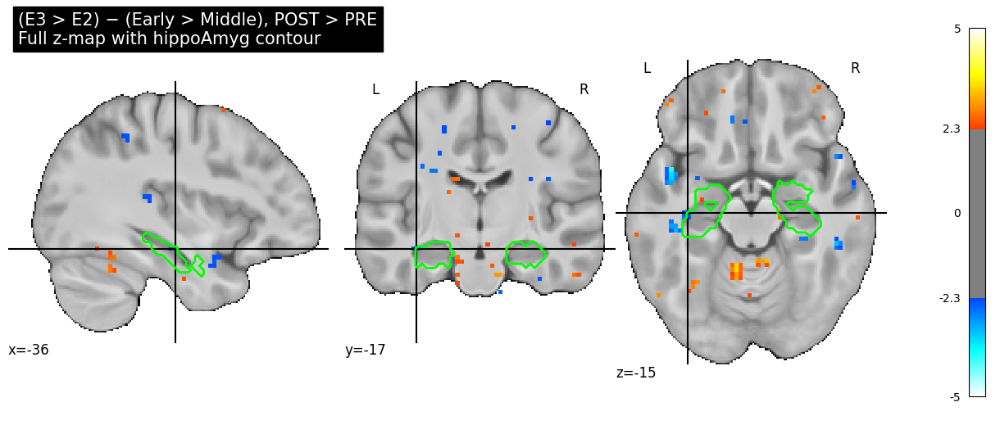

Contrast: temporal_e3_gt_e2_minus_spatial_early_gt_middle_post_gt_pre
Title: (E3 > E2) − (Early > Middle), POST > PRE
Saved ROI-masked interactive HTML: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/interactive_views/roi_masked_views/temporal_e3_gt_e2_minus_spatial_early_gt_middle_post_gt_pre_hippoAmyg_masked_interactive.html
Saved contour overlay PNG: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/figures/roi_mask_overlays/temporal_e3_gt_e2_minus_spatial_early_gt_middle_post_gt_pre_hippoAmyg_contour_overlay.png
ROI stats: {'roi_voxels': 1544, 'positive_suprathreshold_voxels_inside_roi': 7, 'negative_suprathreshold_voxels_inside_roi': 3, 'max_z_inside_roi': 2.565261125564575, 'min_z_inside_roi': -2.6327080726623535, 'contrast': 'temporal_e3_gt_e2_minus_spatial_early_gt_middle_post_gt_pre', 'priority': '12b_temporal_minus_spatial_small_time

/home/kroczak/.conda/envs/island/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


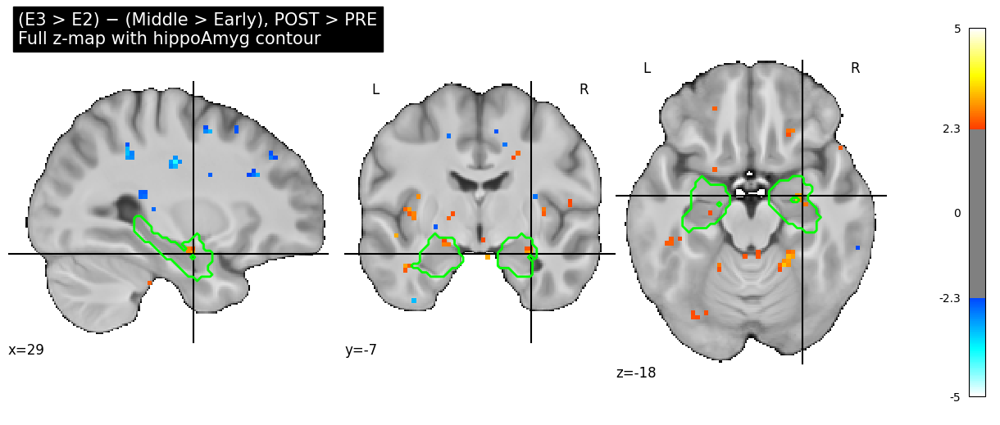

Contrast: temporal_e3_gt_e2_minus_spatial_middle_gt_early_post_gt_pre
Title: (E3 > E2) − (Middle > Early), POST > PRE
Saved ROI-masked interactive HTML: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/interactive_views/roi_masked_views/temporal_e3_gt_e2_minus_spatial_middle_gt_early_post_gt_pre_hippoAmyg_masked_interactive.html
Saved contour overlay PNG: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/figures/roi_mask_overlays/temporal_e3_gt_e2_minus_spatial_middle_gt_early_post_gt_pre_hippoAmyg_contour_overlay.png
ROI stats: {'roi_voxels': 1544, 'positive_suprathreshold_voxels_inside_roi': 19, 'negative_suprathreshold_voxels_inside_roi': 1, 'max_z_inside_roi': 3.154998540878296, 'min_z_inside_roi': -2.608140468597412, 'contrast': 'temporal_e3_gt_e2_minus_spatial_middle_gt_early_post_gt_pre', 'priority': '12b_temporal_minus_spatial_small_time

/home/kroczak/.conda/envs/island/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


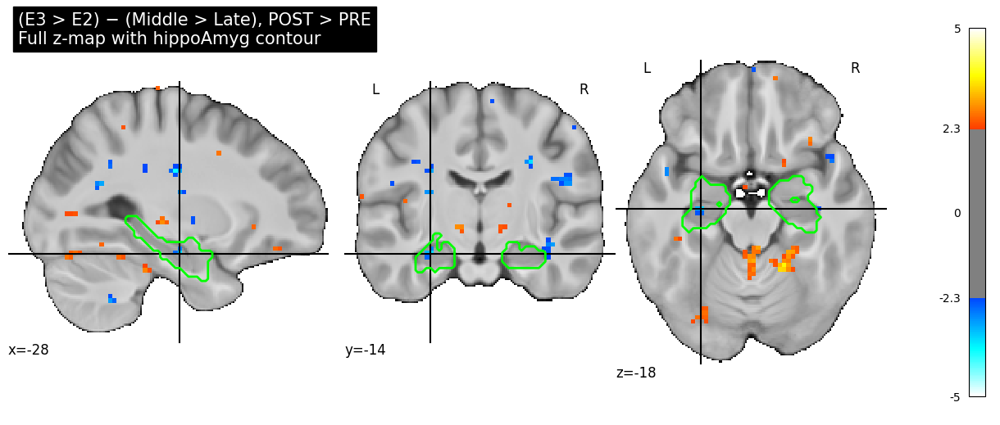

Contrast: temporal_e3_gt_e2_minus_spatial_middle_gt_late_post_gt_pre
Title: (E3 > E2) − (Middle > Late), POST > PRE
Saved ROI-masked interactive HTML: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/interactive_views/roi_masked_views/temporal_e3_gt_e2_minus_spatial_middle_gt_late_post_gt_pre_hippoAmyg_masked_interactive.html
Saved contour overlay PNG: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/figures/roi_mask_overlays/temporal_e3_gt_e2_minus_spatial_middle_gt_late_post_gt_pre_hippoAmyg_contour_overlay.png
ROI stats: {'roi_voxels': 1544, 'positive_suprathreshold_voxels_inside_roi': 14, 'negative_suprathreshold_voxels_inside_roi': 13, 'max_z_inside_roi': 3.180715560913086, 'min_z_inside_roi': -3.4390501976013184, 'contrast': 'temporal_e3_gt_e2_minus_spatial_middle_gt_late_post_gt_pre', 'priority': '12b_temporal_minus_spatial_small_time_mi

/home/kroczak/.conda/envs/island/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


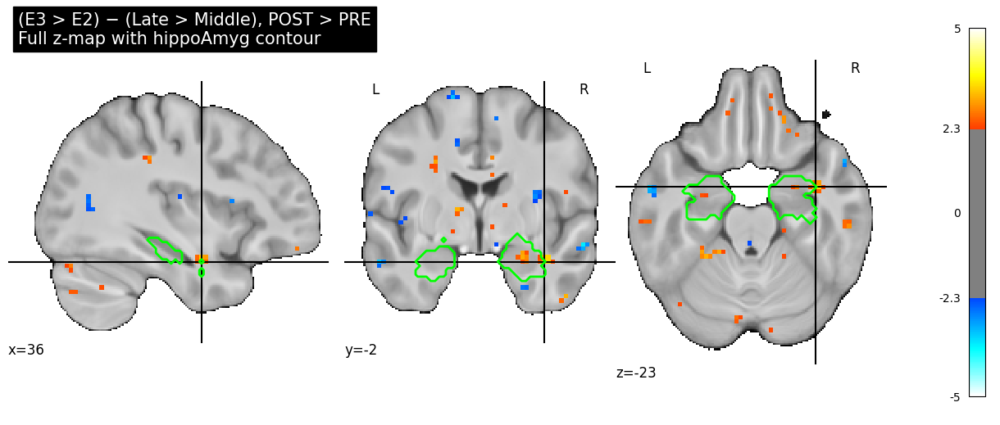

Contrast: temporal_e3_gt_e2_minus_spatial_late_gt_middle_post_gt_pre
Title: (E3 > E2) − (Late > Middle), POST > PRE
Saved ROI-masked interactive HTML: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/interactive_views/roi_masked_views/temporal_e3_gt_e2_minus_spatial_late_gt_middle_post_gt_pre_hippoAmyg_masked_interactive.html
Saved contour overlay PNG: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/figures/roi_mask_overlays/temporal_e3_gt_e2_minus_spatial_late_gt_middle_post_gt_pre_hippoAmyg_contour_overlay.png
ROI stats: {'roi_voxels': 1544, 'positive_suprathreshold_voxels_inside_roi': 21, 'negative_suprathreshold_voxels_inside_roi': 4, 'max_z_inside_roi': 3.2582626342773438, 'min_z_inside_roi': -2.893423557281494, 'contrast': 'temporal_e3_gt_e2_minus_spatial_late_gt_middle_post_gt_pre', 'priority': '12b_temporal_minus_spatial_small_time_min

,roi_voxels,positive_suprathreshold_voxels_inside_roi,negative_suprathreshold_voxels_inside_roi,max_z_inside_roi,min_z_inside_roi,contrast,priority,display_title,z_map_path,roi_masked_z_map_path
10,1544,39,9,3.735385,-3.128007,temporal_e1_gt_e3_minus_spatial_late_gt_early_post_gt_pre,12b_temporal_minus_spatial_large_time_minus_large_space,"(E1 > E3) − (Late > Early), POST > PRE",/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/second_level_from_smoothed5mm/maps/group_temporal_e1_gt_e3_minus_spatial_late_gt_early_post_gt_...,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/tables/roi_overlap/temporal_e1_gt_e3_minus_spatial_late_gt_early_post_gt_pre_hippoAmyg_masked_z...
4,1544,30,1,3.378759,-2.367912,temporal_e1_gt_e2_minus_spatial_late_gt_middle_post_gt_pre,12b_temporal_minus_spatial_small_time_minus_small_space,"(E1 > E2) − (Late > Middle), POST > PRE",/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/second_level_from_smoothed5mm/maps/group_temporal_e1_gt_e2_minus_spatial_late_gt_middle_post_gt...,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/tables/roi_overlap/temporal_e1_gt_e2_minus_spatial_late_gt_middle_post_gt_pre_hippoAmyg_masked_...
12,1544,28,7,3.182189,-2.972186,temporal_e3_gt_e1_minus_spatial_late_gt_early_post_gt_pre,12b_temporal_minus_spatial_large_time_minus_large_space,"(E3 > E1) − (Late > Early), POST > PRE",/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/second_level_from_smoothed5mm/maps/group_temporal_e3_gt_e1_minus_spatial_late_gt_early_post_gt_...,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/tables/roi_overlap/temporal_e3_gt_e1_minus_spatial_late_gt_early_post_gt_pre_hippoAmyg_masked_z...
3,1544,22,11,3.089733,-2.965352,temporal_e1_gt_e2_minus_spatial_middle_gt_late_post_gt_pre,12b_temporal_minus_spatial_small_time_minus_small_space,"(E1 > E2) − (Middle > Late), POST > PRE",/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/second_level_from_smoothed5mm/maps/group_temporal_e1_gt_e2_minus_spatial_middle_gt_late_post_gt...,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/tables/roi_overlap/temporal_e1_gt_e2_minus_spatial_middle_gt_late_post_gt_pre_hippoAmyg_masked_...
1,1544,21,0,3.534391,-2.200041,temporal_e1_gt_e2_minus_spatial_early_gt_middle_post_gt_pre,12b_temporal_minus_spatial_small_time_minus_small_space,"(E1 > E2) − (Early > Middle), POST > PRE",/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/second_level_from_smoothed5mm/maps/group_temporal_e1_gt_e2_minus_spatial_early_gt_middle_post_g...,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/tables/roi_overlap/temporal_e1_gt_e2_minus_spatial_early_gt_middle_post_gt_pre_hippoAmyg_masked...
20,1544,21,4,3.258263,-2.893424,temporal_e3_gt_e2_minus_spatial_late_gt_middle_post_gt_pre,12b_temporal_minus_spatial_small_time_minus_small_space,"(E3 > E2) − (Late > Middle), POST > PRE",/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/second_level_from_smoothed5mm/maps/group_temporal_e3_gt_e2_minus_spatial_late_gt_middle_post_gt...,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/tables/roi_overlap/temporal_e3_gt_e2_minus_spatial_late_gt_middle_post_gt_pre_hippoAmyg_masked_...
18,1544,19,1,3.154999,-2.608140,tem

Saved ROI overlap table:
/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/tables/roi_overlap/pre_post_temporal_minus_spatial_glm_hippoAmyg_overlap_stats_zgt2.33.csv


In [26]:
# ============================================================
# 13. ROI visualization: hippocampus/amygdala mask overlays
# ============================================================

import nibabel as nib
from nilearn.image import resample_to_img, math_img, mean_img
from nilearn.plotting import plot_stat_map, view_img

ROI_NAME = "hippoAmyg"
ROI_ROOT = paths.data_dir / "rois" / "hippoAmyg_02022024"

ROI_THRESHOLD = 0.50
STAT_THRESHOLD = 2.33
VMAX = 5.0

roi_fig_dir = dirs["figures"] / "roi_mask_overlays"
roi_fig_dir.mkdir(parents=True, exist_ok=True)

roi_html_dir = dirs["interactive"] / "roi_masked_views"
roi_html_dir.mkdir(parents=True, exist_ok=True)

roi_table_dir = dirs["tables"] / "roi_overlap"
roi_table_dir.mkdir(parents=True, exist_ok=True)

print("ROI root:", ROI_ROOT)
print("Saving ROI figures to:", roi_fig_dir)
print("Saving ROI interactive views to:", roi_html_dir)

roi_imgs = []
missing_roi_rows = []

for subject in subjects:
    left_mask = (
        ROI_ROOT / subject / "ses-01" / "anat" /
        f"{subject}_ses-01_space-MNI152NLin2009cAsym_hemi-L_label-hippoAmyg.nii.gz"
    )
    right_mask = (
        ROI_ROOT / subject / "ses-01" / "anat" /
        f"{subject}_ses-01_space-MNI152NLin2009cAsym_hemi-R_label-hippoAmyg.nii.gz"
    )

    if left_mask.exists():
        roi_imgs.append(load_img(str(left_mask)))
    else:
        missing_roi_rows.append({"subject": subject, "hemi": "L", "missing_mask_path": str(left_mask)})

    if right_mask.exists():
        roi_imgs.append(load_img(str(right_mask)))
    else:
        missing_roi_rows.append({"subject": subject, "hemi": "R", "missing_mask_path": str(right_mask)})

print(f"Loaded {len(roi_imgs)} unilateral ROI masks.")

if missing_roi_rows:
    display(pd.DataFrame(missing_roi_rows))

assert len(roi_imgs) > 0, "No ROI masks found. Check ROI_ROOT."

roi_mean_img = mean_img(roi_imgs)
roi_group_mask_img = math_img(f"img >= {ROI_THRESHOLD}", img=roi_mean_img)

roi_group_mask_path = roi_table_dir / f"group_consensus_{ROI_NAME}_threshold-{ROI_THRESHOLD:.2f}_mask.nii.gz"
roi_group_mask_img.to_filename(str(roi_group_mask_path))

print("Saved group consensus ROI mask:")
print(roi_group_mask_path)


def compute_roi_overlap_stats(z_img, roi_mask_img, threshold=2.33):
    roi_resampled = resample_to_img(
        roi_mask_img,
        z_img,
        interpolation="nearest",
        force_resample=True,
        copy_header=True,
    )

    z_data = z_img.get_fdata()
    roi_data = roi_resampled.get_fdata() > 0

    pos_supra = z_data > threshold
    neg_supra = z_data < -threshold

    pos_inside = pos_supra & roi_data
    neg_inside = neg_supra & roi_data

    if roi_data.sum() == 0:
        max_z_inside = np.nan
        min_z_inside = np.nan
    else:
        max_z_inside = float(np.nanmax(np.where(roi_data, z_data, np.nan)))
        min_z_inside = float(np.nanmin(np.where(roi_data, z_data, np.nan)))

    return {
        "roi_voxels": int(roi_data.sum()),
        "positive_suprathreshold_voxels_inside_roi": int(pos_inside.sum()),
        "negative_suprathreshold_voxels_inside_roi": int(neg_inside.sum()),
        "max_z_inside_roi": max_z_inside,
        "min_z_inside_roi": min_z_inside,
    }


roi_overlap_rows = []
second_level_by_contrast = second_level_table.set_index("contrast")

for contrast_name in main_contrasts:
    if contrast_name not in second_level_by_contrast.index:
        print("Skipping missing contrast:", contrast_name)
        continue

    row = second_level_by_contrast.loc[contrast_name]
    z_map_path = Path(row["z_map_path"])
    z_img = load_img(str(z_map_path))

    roi_resampled = resample_to_img(
        roi_group_mask_img,
        z_img,
        interpolation="nearest",
        force_resample=True,
        copy_header=True,
    )

    z_roi_img = math_img("z * (roi > 0)", z=z_img, roi=roi_resampled)

    z_roi_path = roi_table_dir / f"{contrast_name}_{ROI_NAME}_masked_zmap.nii.gz"
    z_roi_img.to_filename(str(z_roi_path))

    stats = compute_roi_overlap_stats(
        z_img=z_img,
        roi_mask_img=roi_group_mask_img,
        threshold=STAT_THRESHOLD,
    )

    stats["contrast"] = contrast_name
    stats["priority"] = contrast_specs[contrast_name].get("priority", "") if contrast_name in contrast_specs else ""
    stats["display_title"] = plot_title_map.get(contrast_name, contrast_name)
    stats["z_map_path"] = str(z_map_path)
    stats["roi_masked_z_map_path"] = str(z_roi_path)
    roi_overlap_rows.append(stats)

    html_path = roi_html_dir / f"{contrast_name}_{ROI_NAME}_masked_interactive.html"

    view = view_img(
        z_roi_img,
        bg_img=mean_t1w_img if USE_MEAN_T1W_BACKGROUND else None,
        threshold=STAT_THRESHOLD,
        vmax=VMAX,
        cmap="cold_hot",
        title=(
            f"{plot_title_map.get(contrast_name, contrast_name)} — "
            f"activity inside {ROI_NAME} ROI"
        ),
    )
    view.save_as_html(str(html_path))

    z_roi_data = z_roi_img.get_fdata()

    if np.any(np.abs(z_roi_data) > STAT_THRESHOLD):
        max_idx = np.unravel_index(np.nanargmax(np.abs(z_roi_data)), z_roi_data.shape)
        cut_coords = nib.affines.apply_affine(z_roi_img.affine, max_idx)
    else:
        cut_coords = (-28, -24, -14)

    fig = plt.figure(figsize=(12, 5))

    display_obj = plot_stat_map(
        z_img,
        bg_img=mean_t1w_img if USE_MEAN_T1W_BACKGROUND else None,
        threshold=STAT_THRESHOLD,
        vmax=VMAX,
        cmap="cold_hot",
        display_mode="ortho",
        cut_coords=cut_coords,
        black_bg=False,
        title=(
            f"{plot_title_map.get(contrast_name, contrast_name)}\n"
            f"Full z-map with {ROI_NAME} contour"
        ),
        figure=fig,
        dim=-0.2,
    )

    display_obj.add_contours(
        roi_resampled,
        levels=[0.5],
        colors="lime",
        linewidths=2.0,
    )

    contour_fig_path = roi_fig_dir / f"{contrast_name}_{ROI_NAME}_contour_overlay.png"
    fig.savefig(contour_fig_path, dpi=300, bbox_inches="tight")
    plt.show()

    print("=" * 80)
    print("Contrast:", contrast_name)
    print("Title:", plot_title_map.get(contrast_name, contrast_name))
    print("Saved ROI-masked interactive HTML:", html_path)
    print("Saved contour overlay PNG:", contour_fig_path)
    print("ROI stats:", stats)

roi_overlap_table = pd.DataFrame(roi_overlap_rows)
roi_overlap_table_path = roi_table_dir / f"{ANALYSIS_NAME}_{ROI_NAME}_overlap_stats_zgt{STAT_THRESHOLD:.2f}.csv"
roi_overlap_table.to_csv(roi_overlap_table_path, index=False)

display(roi_overlap_table.sort_values("positive_suprathreshold_voxels_inside_roi", ascending=False))
print("Saved ROI overlap table:")
print(roi_overlap_table_path)


In [28]:
# ============================================================
# 14. Save analysis manifest
# ============================================================

analysis_manifest = {
    "notebook": "12b_pre_post_temporal_minus_spatial_glm.ipynb",
    "analysis_name": ANALYSIS_NAME,
    "project_root": str(PROJECT_ROOT),
    "n_subjects": len(subjects),
    "subjects": subjects,
    "smoothing_fwhm": SMOOTHING_FWHM,
    "smoothing_label": SMOOTHING_LABEL,
    "runtime_flags": {
        "RUN_FIRST_LEVEL": RUN_FIRST_LEVEL,
        "OVERWRITE_FIRST_LEVEL": OVERWRITE_FIRST_LEVEL,
        "RUN_SECOND_LEVEL": RUN_SECOND_LEVEL,
        "OVERWRITE_SECOND_LEVEL": OVERWRITE_SECOND_LEVEL,
        "USE_MEAN_T1W_BACKGROUND": USE_MEAN_T1W_BACKGROUND,
    },
    "episode_definition": {
        "E1": "first encoding episode / week",
        "E2": "second encoding episode / week",
        "E3": "third encoding episode / week",
    },
    "route_position_definition": {
        "early": "checkpoints 1–5",
        "middle": "checkpoints 6–10",
        "late": "checkpoints 11–16",
    },
    "main_contrasts": {
        name: contrast_specs[name]
        for name in main_contrasts
        if name in contrast_specs
    },
    "key_outputs": {
        "contrast_definitions": str(contrast_table_path),
        "event_qc": str(event_qc_path),
        "first_level_qc": str(first_level_qc_path),
        "first_level_contrast_qc": str(first_level_contrast_qc_path),
        "first_level_map_qc": str(map_qc_path),
        "second_level_table": str(second_level_table_path),
        "threshold_summary": str(threshold_summary_path),
        "cluster_summary": str(cluster_summary_path),
        "cluster_details_labeled": str(cluster_details_labeled_path),
        "plot_index": str(plot_index_path) if "plot_index_path" in globals() else "",
        "interactive_index": str(interactive_index_path) if "interactive_index_path" in globals() else "",
        "roi_overlap_table": str(roi_overlap_table_path) if "roi_overlap_table_path" in globals() else "",
    },
}

manifest_dir = dirs["tables"] / "manifests"
manifest_dir.mkdir(parents=True, exist_ok=True)

analysis_manifest_path = manifest_dir / f"{ANALYSIS_NAME}_manifest.json"

with open(analysis_manifest_path, "w") as f:
    json.dump(analysis_manifest, f, indent=2)

print("Saved analysis manifest:")
print(analysis_manifest_path)


Saved analysis manifest:
/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/tables/manifests/pre_post_temporal_minus_spatial_glm_manifest.json


In [35]:
# ============================================================
# Add Spatial − Temporal sign-flipped maps
# Correctly named as:
# spatial_<spaceA>_gt_<spaceB>_minus_temporal_<episodeA>_gt_<episodeB>_post_gt_pre
# ============================================================

from nilearn.image import load_img, math_img
from pathlib import Path
import pandas as pd
import re

# Use a safe output folder because dirs["maps"] does not exist in this notebook.
flipped_dir = dirs["tables"] / "spatial_minus_temporal_flipped_zmaps"
flipped_dir.mkdir(parents=True, exist_ok=True)

def make_spatial_minus_temporal_name(original_name):
    """
    Convert:
        temporal_e1_gt_e2_minus_spatial_middle_gt_early_post_gt_pre

    into:
        spatial_middle_gt_early_minus_temporal_e1_gt_e2_post_gt_pre
    """
    original_name = str(original_name)

    m = re.match(
        r"temporal_(e[123])_gt_(e[123])_minus_spatial_(early|middle|late)_gt_(early|middle|late)_post_gt_pre",
        original_name,
    )

    if not m:
        return None

    ea, eb, sa, sb = m.groups()

    flipped_name = (
        f"spatial_{sa}_gt_{sb}_minus_"
        f"temporal_{ea}_gt_{eb}_post_gt_pre"
    )

    return flipped_name


rows = []

for _, row in second_level_table.iterrows():
    contrast_name = str(row["contrast"])
    z_map_path = Path(row["z_map_path"])

    # --------------------------------------------------------
    # Keep original Temporal − Spatial row
    # --------------------------------------------------------
    original_row = row.copy()
    original_row["direction"] = "Temporal − Spatial"
    original_row["clean_direction"] = "Temporal − Spatial"
    rows.append(original_row)

    # --------------------------------------------------------
    # Create Spatial − Temporal only for valid temporal-minus-spatial contrasts
    # --------------------------------------------------------
    flipped_name = make_spatial_minus_temporal_name(contrast_name)

    if flipped_name is None:
        continue

    flipped_z_path = flipped_dir / f"{flipped_name}_z_map.nii.gz"

    if not flipped_z_path.exists():
        z_img = load_img(str(z_map_path))
        flipped_img = math_img("-img", img=z_img)
        flipped_img.to_filename(str(flipped_z_path))

    flipped_row = row.copy()
    flipped_row["contrast"] = flipped_name
    flipped_row["z_map_path"] = str(flipped_z_path)
    flipped_row["direction"] = "Spatial − Temporal"
    flipped_row["clean_direction"] = "Spatial − Temporal"
    rows.append(flipped_row)

second_level_table_with_reverse = pd.DataFrame(rows)

print("Original rows:", len(second_level_table))
print("Rows with Spatial − Temporal sign-flipped maps:", len(second_level_table_with_reverse))
print("Saved flipped maps to:")
print(flipped_dir)

print("\nDirection counts:")
display(second_level_table_with_reverse["direction"].value_counts().reset_index())

print("\nExample rows:")
display(
    second_level_table_with_reverse[
        ["contrast", "direction", "z_map_path"]
    ].head(40)
)

# Sanity check: Spatial − Temporal labels should have spaces after spatial_ and episodes after temporal_
bad_spatial_labels = second_level_table_with_reverse[
    second_level_table_with_reverse["contrast"].astype(str).str.match(
        r"spatial_e[123]_gt_e[123]_minus_temporal_",
        na=False,
    )
]

assert len(bad_spatial_labels) == 0, (
    "Bad Spatial − Temporal labels found. "
    "Spatial labels should contain early/middle/late, not E1/E2/E3."
)

good_spatial_labels = second_level_table_with_reverse[
    second_level_table_with_reverse["contrast"].astype(str).str.startswith("spatial_")
]

print("\nGood Spatial − Temporal examples:")
display(good_spatial_labels[["contrast", "direction"]].head(20))

Original rows: 21
Rows with Spatial − Temporal sign-flipped maps: 41
Saved flipped maps to:
/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/tables/spatial_minus_temporal_flipped_zmaps

Direction counts:


,direction,count
0,Temporal − Spatial,21
1,Spatial − Temporal,20



Example rows:


,contrast,direction,z_map_path
0,temporal_spatial_average_old_gt_new_post_gt_pre,Temporal − Spatial,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/second_level_from_smoothed5mm/maps/group_temporal_spatial_average_old_gt_new_post_gt_pre_smooth...
1,temporal_e1_gt_e2_minus_spatial_early_gt_middle_post_gt_pre,Temporal − Spatial,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/second_level_from_smoothed5mm/maps/group_temporal_e1_gt_e2_minus_spatial_early_gt_middle_post_g...
1,spatial_early_gt_middle_minus_temporal_e1_gt_e2_post_gt_pre,Spatial − Temporal,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/tables/spatial_minus_temporal_flipped_zmaps/spatial_early_gt_middle_minus_temporal_e1_gt_e2_pos...
2,temporal_e1_gt_e2_minus_spatial_middle_gt_early_post_gt_pre,Temporal − Spatial,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/second_level_from_smoothed5mm/maps/group_temporal_e1_gt_e2_minus_spatial_middle_gt_early_post_g...
2,spatial_middle_gt_early_minus_temporal_e1_gt_e2_post_gt_pre,Spatial − Temporal,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/tables/spatial_minus_temporal_flipped_zmaps/spatial_middle_gt_early_minus_temporal_e1_gt_e2_pos...
3,temporal_e1_gt_e2_minus_spatial_middle_gt_late_post_gt_pre,Temporal − Spatial,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/second_level_from_smoothed5mm/maps/group_temporal_e1_gt_e2_minus_spatial_middle_gt_late_post_gt...
3,spatial_middle_gt_late_minus_temporal_e1_gt_e2_post_gt_pre,Spatial − Temporal,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/tables/spatial_minus_temporal_flipped_zmaps/spatial_middle_gt_late_minus_temporal_e1_gt_e2_post...
4,temporal_e1_gt_e2_minus_spatial_late_gt_middle_post_gt_pre,Temporal − Spatial,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/second_level_from_smoothed5mm/maps/group_temporal_e1_gt_e2_minus_spatial_late_gt_middle_post_gt...
4,spatial_late_gt_middle_minus_temporal_e1_gt_e2_post_gt_pre,Spatial − Temporal,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/tables/spatial_minus_temporal_flipped_zmaps/spatial_late_gt_middle_minus_temporal_e1_gt_e2_post...
5,temporal_e2_gt_e1_minus_spatial_early_gt_middle_post_gt_pre,Temporal − Spatial,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/second_level_from_smoothed5mm/maps/group_temporal_e2_gt_e1_minus_spatial_early_gt_middle_post_g...



Good Spatial − Temporal examples:


,contrast,direction
1,spatial_early_gt_middle_minus_temporal_e1_gt_e2_post_gt_pre,Spatial − Temporal
2,spatial_middle_gt_early_minus_temporal_e1_gt_e2_post_gt_pre,Spatial − Temporal
3,spatial_middle_gt_late_minus_temporal_e1_gt_e2_post_gt_pre,Spatial − Temporal
4,spatial_late_gt_middle_minus_temporal_e1_gt_e2_post_gt_pre,Spatial − Temporal
5,spatial_early_gt_middle_minus_temporal_e2_gt_e1_post_gt_pre,Spatial − Temporal
6,spatial_middle_gt_early_minus_temporal_e2_gt_e1_post_gt_pre,Spatial − Temporal
7,spatial_middle_gt_late_minus_temporal_e2_gt_e1_post_gt_pre,Spatial − Temporal
8,spatial_late_gt_middle_minus_temporal_e2_gt_e1_post_gt_pre,Spatial − Temporal
9,spatial_early_gt_late_minus_temporal_e1_gt_e3_post_gt_pre,Spatial − Temporal
10,spatial_late_gt_early_minus_temporal_e1_gt_e3_post_gt_pre,Spatial − Temporal


## Literature-guided hippocampus / MTL SVC search

This uses the same hippocampal and MTL coordinate family as Notebook 12. It screens all Temporal − Spatial POST > PRE contrasts inside 6 mm literature-defined spheres, then exports ranked tables.

Saving literature SVC tables to: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/tables/literature_6mm_spheres_temporal_minus_spatial_post_gt_pre
Saving figures to: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/figures/literature_6mm_spheres_temporal_minus_spatial_post_gt_pre
Saving interactive 3D viewer to: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/figures/literature_6mm_spheres_temporal_minus_spatial_post_gt_pre/interactive_3d_hippocampus
Using second_level_table_with_reverse for SVC/3D extraction.

Literature centers:


,paper,roi_name,concept,x,y,z,priority
0,Deuker et al.,Deuker_temporal_right_medial_anterior_HPC,Temporal distance / close temporal relationships,26.0,-18.0,-22.0,temporal_event_map
1,Deuker et al.,Deuker_spatial_right_medial_anterior_HPC,Spatial distance / close spatial relationships,34.0,-17.0,-22.0,spatial_event_map
2,Deuker et al.,Deuker_combined_space_time_right_medial_anterior_HPC,Combined spatial and temporal proximity,32.0,-17.0,-22.0,space_time_event_map
3,Bellmund et al. 2022,Bellmund_same_sequence_left_anterior_HPC,"Constructed event-time relations, same sequence",-24.0,-13.0,-20.0,temporal_structure
4,Bellmund et al. 2022,Bellmund_interaction_right_anterior_HPC,Temporal-distance representation differs for same vs different sequences,31.0,-16.0,-21.0,temporal_structure
5,Bellmund et al. 2022,Bellmund_across_sequence_left_anterior_HPC_exploratory,"Across-sequence temporal relation, exploratory",-26.0,-19.0,-15.0,temporal_structure
6,Montagrin et al.,Montagrin_current_gt_remote_left_posterior_HPC,Current > remote goals,-30.0,-31.0,-14.5,temporal_goal_structure
7,Montagrin et al.,Montagrin_remote_gt_current_left_anterior_HPC,Remote > current goals,-15.0,-8.5,-14.5,temporal_goal_structure
8,Montagrin et al.,Montagrin_remote_gt_current_right_anterior_HPC,Remote > current goals,17.5,-21.0,-14.5,temporal_goal_structure



POST > PRE contrasts found:
 - temporal_spatial_average_old_gt_new_post_gt_pre
 - temporal_e1_gt_e2_minus_spatial_early_gt_middle_post_gt_pre
 - spatial_early_gt_middle_minus_temporal_e1_gt_e2_post_gt_pre
 - temporal_e1_gt_e2_minus_spatial_middle_gt_early_post_gt_pre
 - spatial_middle_gt_early_minus_temporal_e1_gt_e2_post_gt_pre
 - temporal_e1_gt_e2_minus_spatial_middle_gt_late_post_gt_pre
 - spatial_middle_gt_late_minus_temporal_e1_gt_e2_post_gt_pre
 - temporal_e1_gt_e2_minus_spatial_late_gt_middle_post_gt_pre
 - spatial_late_gt_middle_minus_temporal_e1_gt_e2_post_gt_pre
 - temporal_e2_gt_e1_minus_spatial_early_gt_middle_post_gt_pre
 - spatial_early_gt_middle_minus_temporal_e2_gt_e1_post_gt_pre
 - temporal_e2_gt_e1_minus_spatial_middle_gt_early_post_gt_pre
 - spatial_middle_gt_early_minus_temporal_e2_gt_e1_post_gt_pre
 - temporal_e2_gt_e1_minus_spatial_middle_gt_late_post_gt_pre
 - spatial_middle_gt_late_minus_temporal_e2_gt_e1_post_gt_pre
 - temporal_e2_gt_e1_minus_spatial_late_gt_m

,n_voxels_in_sphere,peak_x,peak_y,peak_z_coord,peak_z_stat,peak_distance_from_literature_center_mm,peak_p_uncorrected,peak_p_bonferroni_within_sphere,peak_q_fdr_within_sphere,n_voxels_p_unc_lt_0_001,n_voxels_fdr_q_lt_0_05,paper,literature_roi,concept,priority,contrast,contrast_label,sphere_center_x,sphere_center_y,sphere_center_z,sphere_radius_mm,sphere_mask_path,z_map_path,peak_hemisphere,peak_long_axis
0,56,-33.5,-27.0,-13.0,4.024313,5.522681,0.000029,0.001600,0.001600,2,3,Montagrin et al.,Montagrin_current_gt_remote_left_posterior_HPC,Current > remote goals,temporal_goal_structure,temporal_e1_gt_e2_minus_spatial_middle_gt_early_post_gt_pre,"temporal E1 > E2 minus spatial Middle > early, POST > PRE",-30.0,-31.0,-14.5,6.0,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/tables/literature_6mm_spheres_temporal_minus_spatial_post_gt_pre/Montagrin_current_gt_remote_le...,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/second_level_from_smoothed5mm/maps/group_temporal_e1_gt_e2_minus_spatial_middle_gt_early_post_g...,left,posterior
1,56,-33.5,-27.0,-13.0,4.024313,5.522681,0.000029,0.001600,0.001600,2,3,Montagrin et al.,Montagrin_current_gt_remote_left_posterior_HPC,Current > remote goals,temporal_goal_structure,spatial_early_gt_middle_minus_temporal_e2_gt_e1_post_gt_pre,"spatial Early > Middle minus temporal E2 > e1, POST > PRE",-30.0,-31.0,-14.5,6.0,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/tables/literature_6mm_spheres_temporal_minus_spatial_post_gt_pre/Montagrin_current_gt_remote_le...,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/tables/spatial_minus_temporal_flipped_zmaps/spatial_early_gt_middle_minus_temporal_e2_gt_e1_pos...,left,posterior
2,56,-33.5,-27.0,-13.0,3.735385,5.522681,0.000094,0.005248,0.005248,1,1,Montagrin et al.,Montagrin_current_gt_remote_left_posterior_HPC,Current > remote goals,temporal_goal_structure,temporal_e1_gt_e3_minus_spatial_late_gt_early_post_gt_pre,"temporal E1 > E3 minus spatial Late > early, POST > PRE",-30.0,-31.0,-14.5,6.0,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/tables/literature_6mm_spheres_temporal_minus_spatial_post_gt_pre/Montagrin_current_gt_remote_le...,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/second_level_from_smoothed5mm/maps/group_temporal_e1_gt_e3_minus_spatial_late_gt_early_post_gt_...,left,posterior
3,56,-33.5,-27.0,-13.0,3.735385,5.522681,0.000094,0.005248,0.005248,1,1,Montagrin et al.,Montagrin_current_gt_remote_left_posterior_HPC,Current > remote goals,temporal_goal_structure,spatial_early_gt_late_minus_temporal_e3_gt_e1_post_gt_pre,"spatial Early > Late minus temporal E3 > e1, POST > PRE",-30.0,-31.0,-14.5,6.0,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/tables/literature_6mm_spheres_temporal_minus_spatial_post_gt_pre/Montagrin_current_gt_remote_le...,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/tables/spatial_minus_temporal_flipped_zmaps/spatial_early_gt_late_minus_temporal_e3_gt_e1_post_...,left,posterior
4,56,-31.0,-29.5,-13.0,3.534391,2.345208,0.000204,0.011444,0.006541,3,9,Montagrin et al.,Montagrin_current_gt_remote_left_posterior_HPC,Current > remote goals,temporal_goal_structure,temporal_e1_gt_e2_minus_spatial_early_gt_middle_post_gt_pre,"temporal E1 > E2 minus spatial Early > middle, POST > PRE",-30.0,-31.0,-14.5,6.0,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/tables/literature_6mm_spheres_temp


TABLE 1 — POST > PRE effects close to current literature peaks


,Contrast,Peak,Region,z,qFDR sphere,pBonf sphere,Literature match,Papers,Concepts,Min dist. mm,Use
0,"spatial Early > Middle minus temporal E2 > e1, POST > PRE","(-34, -27, -13)",left posterior hippocampus,4.02,.002,.002,Montagrin L posterior HPC,Montagrin et al.,Current > remote goals,5.5,FDR-supported
1,"temporal E1 > E2 minus spatial Middle > early, POST > PRE","(-34, -27, -13)",left posterior hippocampus,4.02,.002,.002,Montagrin L posterior HPC,Montagrin et al.,Current > remote goals,5.5,FDR-supported
2,"spatial Early > Late minus temporal E3 > e1, POST > PRE","(-34, -27, -13)",left posterior hippocampus,3.74,.005,.005,Montagrin L posterior HPC,Montagrin et al.,Current > remote goals,5.5,FDR-supported
3,"temporal E1 > E3 minus spatial Late > early, POST > PRE","(-34, -27, -13)",left posterior hippocampus,3.74,.005,.005,Montagrin L posterior HPC,Montagrin et al.,Current > remote goals,5.5,FDR-supported
4,"spatial Middle > Early minus temporal E2 > e1, POST > PRE","(-31, -30, -13)",left posterior hippocampus,3.53,.007,.011,Montagrin L posterior HPC,Montagrin et al.,Current > remote goals,2.3,FDR-supported
5,"temporal E1 > E2 minus spatial Early > middle, POST > PRE","(-31, -30, -13)",left posterior hippocampus,3.53,.007,.011,Montagrin L posterior HPC,Montagrin et al.,Current > remote goals,2.3,FDR-supported
6,"spatial Middle > Late minus temporal E3 > e2, POST > PRE","(-28, -14, -18)",left anterior hippocampus,3.44,.016–.018,.016–.018,Bellmund same-sequence L anterior HPC; Bellmund across-sequence L anterior HPC,Bellmund et al. 2022,"Across-sequence temporal relation, exploratory; Constructed event-time relations, same sequence",5.1,FDR-supported
7,"temporal E2 > E3 minus spatial Late > middle, POST > PRE","(-28, -14, -18)",left anterior hippocampus,3.44,.016–.018,.016–.018,Bellmund same-sequence L anterior HPC; Bellmund across-sequence L anterior HPC,Bellmund et al. 2022,"Across-sequence temporal relation, exploratory; Constructed event-time relations, same sequence",5.1,FDR-supported
8,"spatial Middle > Late minus temporal E2 > e1, POST > PRE","(-31, -27, -16)",left posterior hippocampus,3.31,.012,.026,Montagrin L posterior HPC,Montagrin et al.,Current > remote goals,4.2,FDR-supported
9,"temporal E1 > E2 minus spatial Late > middle, POST > PRE","(-31, -27, -16)",left posterior hippocampus,3.31,.012,.026,Montagrin L posterior HPC,Montagrin et al.,Current > remote goals,4.2,FDR-supported


Saved:
/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/tables/literature_6mm_spheres_temporal_minus_spatial_post_gt_pre/pre_post_temporal_minus_spatial_glm_POST_GT_PRE_literature_close_exploratory_summary.csv


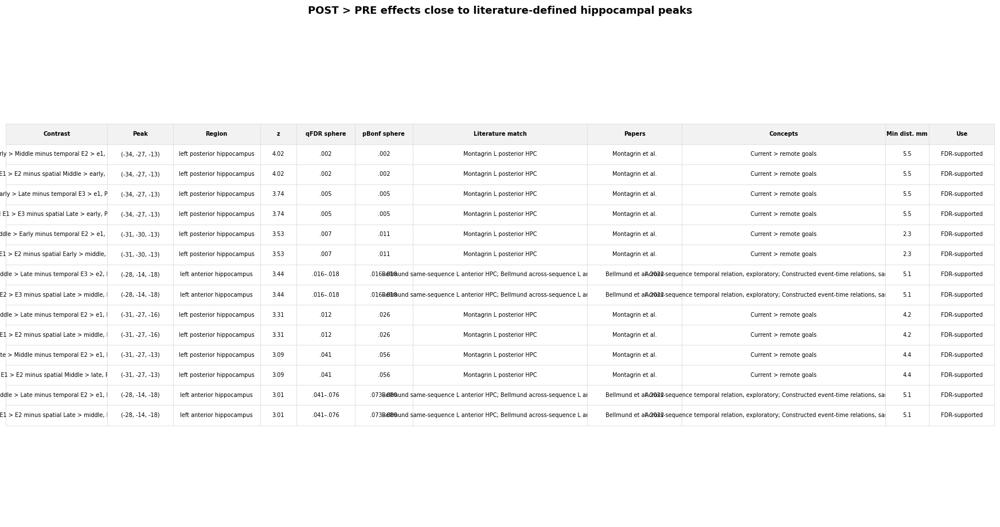

Saved table PNG:
/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/figures/literature_6mm_spheres_temporal_minus_spatial_post_gt_pre/pre_post_temporal_minus_spatial_glm_POST_GT_PRE_literature_close_exploratory_summary.png

Extracting whole-brain peaks for temporal_spatial_average_old_gt_new_post_gt_pre
z-map: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/second_level_from_smoothed5mm/maps/group_temporal_spatial_average_old_gt_new_post_gt_pre_smoothed5mm_zmap.nii.gz

Extracting whole-brain peaks for temporal_e1_gt_e2_minus_spatial_early_gt_middle_post_gt_pre
z-map: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/second_level_from_smoothed5mm/maps/group_temporal_e1_gt_e2_minus_spatial_early_gt_middle_post_gt_pre_smoothed5mm_zmap.nii.gz

Extracting whole-brain peaks for spa

,contrast,Contrast,Peak,x,y,z_coord,Peak z,Cluster size,Hemisphere,HPC axis heuristic,Nearest literature sphere,Nearest paper,Nearest center,Distance to nearest literature center mm,Close to current literature?
0,temporal_spatial_average_old_gt_new_post_gt_pre,"temporal spatial average Old > new, POST > PRE","(4, -12, -18)",4.0,-12.0,-18.0,3.761024,171.0,right,anterior,Montagrin R anterior HPC,Montagrin et al.,"(18, -21, -14)",16.598193,False
1,temporal_spatial_average_old_gt_new_post_gt_pre,"temporal spatial average Old > new, POST > PRE","(6, 33, 32)",6.5,33.0,32.0,3.592064,234.0,right,anterior,Montagrin L anterior HPC,Montagrin et al.,"(-15, -8, -14)",65.929887,False
2,temporal_spatial_average_old_gt_new_post_gt_pre,"temporal spatial average Old > new, POST > PRE","(-8, -27, -33)",-8.5,-27.0,-33.0,3.467457,78.0,left,posterior,Bellmund same-sequence L anterior HPC,Bellmund et al. 2022,"(-24, -13, -20)",24.601829,False
3,temporal_e1_gt_e2_minus_spatial_early_gt_middle_post_gt_pre,"temporal E1 > E2 minus spatial Early > middle, POST > PRE","(62, -57, -8)",61.5,-57.0,-8.0,4.608305,218,right,posterior,Deuker spatial R anterior HPC,Deuker et al.,"(34, -17, -22)",50.519798,False
4,temporal_e1_gt_e2_minus_spatial_early_gt_middle_post_gt_pre,"temporal E1 > E2 minus spatial Early > middle, POST > PRE","(-28, -64, -28)",-28.5,-64.5,-28.0,4.086429,78,left,posterior,Montagrin L posterior HPC,Montagrin et al.,"(-30, -31, -14)",36.148997,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
200,spatial_late_gt_middle_minus_temporal_e3_gt_e2_post_gt_pre,"spatial Late > Middle minus temporal E3 > e2, POST > PRE","(4, -60, 20)",4.0,-59.5,19.5,3.860299,93,right,posterior,Montagrin R anterior HPC,Montagrin et al.,"(18, -21, -14)",53.108380,False
201,spatial_late_gt_middle_minus_temporal_e3_gt_e2_post_gt_pre,"spatial Late > Middle minus temporal E3 > e2, POST > PRE","(-6, -60, 20)",-6.0,-59.5,19.5,3.849494,109,left,posterior,Montagrin L posterior HPC,Montagrin et al.,"(-30, -31, -14)",50.440559,False
202,spatial_late_gt_middle_minus_temporal_e3_gt_e2_post_gt_pre,"spatial Late > Middle minus temporal E3 > e2, POST > PRE","(9, -64, 27)",9.0,-64.5,27.0,3.549398,250,right,posterior,Montagrin R anterior HPC,Montagrin et al.,"(18, -21, -14)",60.718613,False
203,spatial_late_gt_middle_minus_temporal_e3_gt_e2_post_gt_pre,"spatial Late > Middle minus temporal E3 > e2, POST > PRE","(2, -70, 27)",1.5,-69.5,27.0,3.318038,,midline,posterior,Montagrin L posterior HPC,Montagrin et al.,"(-30, -31, -14)",64.782328,False


Saved all whole-brain peaks:
/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/tables/literature_6mm_spheres_temporal_minus_spatial_post_gt_pre/pre_post_temporal_minus_spatial_glm_POST_GT_PRE_wholebrain_peaks_z3.00_ALL.csv

TABLE 2 — Strong POST > PRE MTL-ish peaks not close to current literature peaks


,Contrast,Peak,Peak z,Cluster size,Hemisphere,HPC axis heuristic,Nearest literature sphere,Nearest paper,Nearest center,Distance to nearest literature center mm
0,"temporal E1 > E2 minus spatial Middle > early, POST > PRE","(-8, -40, -23)",4.31,78,left,posterior,Montagrin L posterior HPC,Montagrin et al.,"(-30, -31, -14)",24.6
1,"spatial Early > Middle minus temporal E2 > e1, POST > PRE","(-8, -40, -23)",4.31,78,left,posterior,Montagrin L posterior HPC,Montagrin et al.,"(-30, -31, -14)",24.6
2,"temporal E1 > E2 minus spatial Middle > late, POST > PRE","(-8, -40, -23)",4.31,109.0,left,posterior,Montagrin L posterior HPC,Montagrin et al.,"(-30, -31, -14)",24.6
3,"spatial Late > Middle minus temporal E2 > e1, POST > PRE","(-8, -40, -23)",4.31,109.0,left,posterior,Montagrin L posterior HPC,Montagrin et al.,"(-30, -31, -14)",24.6
4,"temporal E1 > E3 minus spatial Early > late, POST > PRE","(-26, -17, 4)",4.31,93.0,left,anterior,Bellmund across-sequence L anterior HPC,Bellmund et al. 2022,"(-26, -19, -15)",19.6
5,"spatial Late > Early minus temporal E3 > e1, POST > PRE","(-26, -17, 4)",4.31,93.0,left,anterior,Bellmund across-sequence L anterior HPC,Bellmund et al. 2022,"(-26, -19, -15)",19.6
6,"temporal E1 > E2 minus spatial Middle > late, POST > PRE","(6, -52, -3)",4.07,359.0,right,posterior,Montagrin R anterior HPC,Montagrin et al.,"(18, -21, -14)",34.8
7,"spatial Late > Middle minus temporal E2 > e1, POST > PRE","(6, -52, -3)",4.07,359.0,right,posterior,Montagrin R anterior HPC,Montagrin et al.,"(18, -21, -14)",34.8
8,"temporal E1 > E2 minus spatial Early > middle, POST > PRE","(-8, -30, -40)",4.05,406,left,posterior,Bellmund same-sequence L anterior HPC,Bellmund et al. 2022,"(-24, -13, -20)",30.5
9,"spatial Middle > Early minus temporal E2 > e1, POST > PRE","(-8, -30, -40)",4.05,406,left,posterior,Bellmund same-sequence L anterior HPC,Bellmund et al. 2022,"(-24, -13, -20)",30.5


Saved:
/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/tables/literature_6mm_spheres_temporal_minus_spatial_post_gt_pre/pre_post_temporal_minus_spatial_glm_POST_GT_PRE_MTL_unmatched_candidate_peaks.csv


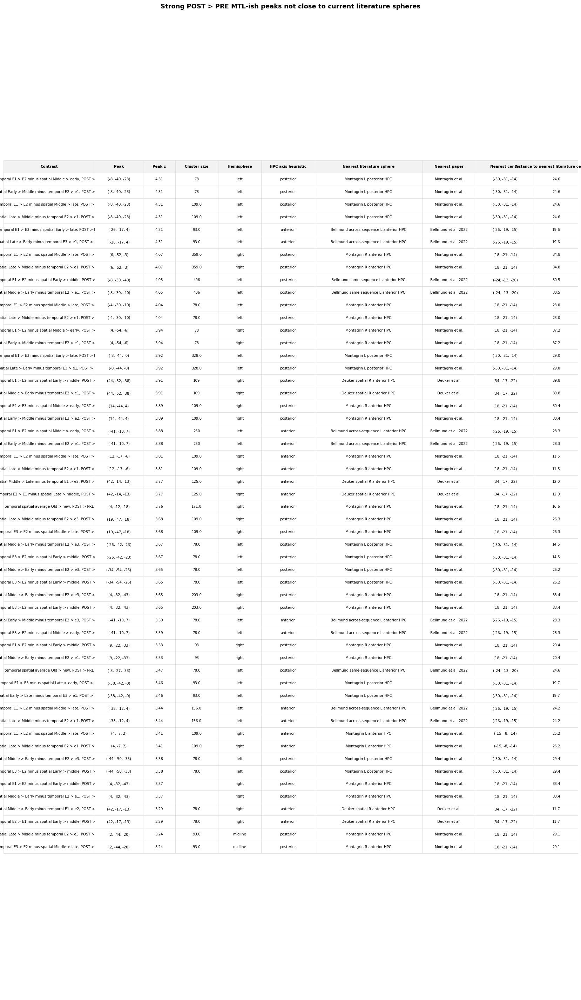

Saved table PNG:
/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/figures/literature_6mm_spheres_temporal_minus_spatial_post_gt_pre/pre_post_temporal_minus_spatial_glm_POST_GT_PRE_MTL_unmatched_candidate_peaks.png

Observed points for interactive 3D:


,source,Contrast,Peak,x,y,z,Peak z,Hemisphere,Axis,Support,Papers,Use
0,literature-matched,"spatial Early > Middle minus temporal E2 > e1, POST > PRE","(-34, -27, -13)",-34.0,-27.0,-13.0,4.020000,left,posterior,Montagrin L posterior HPC,Montagrin et al.,FDR-supported
1,literature-matched,"temporal E1 > E2 minus spatial Middle > early, POST > PRE","(-34, -27, -13)",-34.0,-27.0,-13.0,4.020000,left,posterior,Montagrin L posterior HPC,Montagrin et al.,FDR-supported
2,literature-matched,"spatial Early > Late minus temporal E3 > e1, POST > PRE","(-34, -27, -13)",-34.0,-27.0,-13.0,3.740000,left,posterior,Montagrin L posterior HPC,Montagrin et al.,FDR-supported
3,literature-matched,"temporal E1 > E3 minus spatial Late > early, POST > PRE","(-34, -27, -13)",-34.0,-27.0,-13.0,3.740000,left,posterior,Montagrin L posterior HPC,Montagrin et al.,FDR-supported
4,literature-matched,"spatial Middle > Early minus temporal E2 > e1, POST > PRE","(-31, -30, -13)",-31.0,-30.0,-13.0,3.530000,left,posterior,Montagrin L posterior HPC,Montagrin et al.,FDR-supported
...,...,...,...,...,...,...,...,...,...,...,...,...
59,exploratory-unmatched,"spatial Late > Middle minus temporal E2 > e1, POST > PRE","(4, -7, 2)",4.0,-7.0,2.0,3.411337,right,anterior,Nearest current literature center: Montagrin L anterior HPC (25.2 mm),new literature search needed,Exploratory unmatched
60,exploratory-unmatched,"spatial Middle > Early minus temporal E2 > e3, POST > PRE","(-44, -50, -33)",-43.5,-49.5,-33.0,3.377373,left,posterior,Nearest current literature center: Montagrin L posterior HPC (29.4 mm),new literature search needed,Exploratory unmatched
61,exploratory-unmatched,"temporal E3 > E2 minus spatial Early > middle, POST > PRE","(-44, -50, -33)",-43.5,-49.5,-33.0,3.377373,left,posterior,Nearest current literature center: Montagrin L posterior HPC (29.4 mm),new literature search needed,Exploratory unmatched
62,exploratory-unmatched,"temporal E1 > E2 minus spatial Early > middle, POST > PRE","(4, -32, -43)",4.0,-32.0,-43.0,3.366430,right,posterior,Nearest current literature center: Montagrin R anterior HPC (33.4 mm),new literature search needed,Exploratory unmatched


Saved:
/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/tables/literature_6mm_spheres_temporal_minus_spatial_post_gt_pre/interactive_3d_hippocampus/pre_post_temporal_minus_spatial_glm_POST_GT_PRE_observed_points_for_3D.csv
Looking for hippocampus/amygdala masks in:
/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/rois/hippoAmyg_02022024
Found 192 NIfTI candidate masks in explicit ROI search.
First candidate masks:
 - /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/rois/hippoAmyg_02022024/sub-P10/ses-01/anat/sub-P10_ses-01_space-MNI152NLin2009cAsym_hemi-L_label-hippoAmyg.nii.gz
 - /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/rois/hippoAmyg_02022024/sub-P10/ses-01/anat/sub-P10_ses-01_space-MNI152NLin2009cAsym_hemi-R_label-hippoAmyg.nii.gz
 - /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/rois/hippoAmyg_02022024/sub-P10/ses-

,source,Contrast,Peak,x,y,z,Peak z,Hemisphere,Axis,Support,Papers,Use
0,literature-matched,"spatial Early > Middle minus temporal E2 > e1, POST > PRE","(-34, -27, -13)",-34.0,-27.0,-13.0,4.020000,left,posterior,Montagrin L posterior HPC,Montagrin et al.,FDR-supported
1,literature-matched,"temporal E1 > E2 minus spatial Middle > early, POST > PRE","(-34, -27, -13)",-34.0,-27.0,-13.0,4.020000,left,posterior,Montagrin L posterior HPC,Montagrin et al.,FDR-supported
2,literature-matched,"spatial Early > Late minus temporal E3 > e1, POST > PRE","(-34, -27, -13)",-34.0,-27.0,-13.0,3.740000,left,posterior,Montagrin L posterior HPC,Montagrin et al.,FDR-supported
3,literature-matched,"temporal E1 > E3 minus spatial Late > early, POST > PRE","(-34, -27, -13)",-34.0,-27.0,-13.0,3.740000,left,posterior,Montagrin L posterior HPC,Montagrin et al.,FDR-supported
4,literature-matched,"spatial Middle > Early minus temporal E2 > e1, POST > PRE","(-31, -30, -13)",-31.0,-30.0,-13.0,3.530000,left,posterior,Montagrin L posterior HPC,Montagrin et al.,FDR-supported
...,...,...,...,...,...,...,...,...,...,...,...,...
59,exploratory-unmatched,"spatial Late > Middle minus temporal E2 > e1, POST > PRE","(4, -7, 2)",4.0,-7.0,2.0,3.411337,right,anterior,Nearest current literature center: Montagrin L anterior HPC (25.2 mm),new literature search needed,Exploratory unmatched
60,exploratory-unmatched,"spatial Middle > Early minus temporal E2 > e3, POST > PRE","(-44, -50, -33)",-43.5,-49.5,-33.0,3.377373,left,posterior,Nearest current literature center: Montagrin L posterior HPC (29.4 mm),new literature search needed,Exploratory unmatched
61,exploratory-unmatched,"temporal E3 > E2 minus spatial Early > middle, POST > PRE","(-44, -50, -33)",-43.5,-49.5,-33.0,3.377373,left,posterior,Nearest current literature center: Montagrin L posterior HPC (29.4 mm),new literature search needed,Exploratory unmatched
62,exploratory-unmatched,"temporal E1 > E2 minus spatial Early > middle, POST > PRE","(4, -32, -43)",4.0,-32.0,-43.0,3.366430,right,posterior,Nearest current literature center: Montagrin R anterior HPC (33.4 mm),new literature search needed,Exploratory unmatched


Saved:
/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/tables/literature_6mm_spheres_temporal_minus_spatial_post_gt_pre/interactive_3d_hippocampus/pre_post_temporal_minus_spatial_glm_interactive_3D_observed_points.csv



Saved interactive 3D viewer:
/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/figures/literature_6mm_spheres_temporal_minus_spatial_post_gt_pre/interactive_3d_hippocampus/pre_post_temporal_minus_spatial_glm_interactive_3D_hippocampus_POST_GT_PRE.html



Key objects created:
- temporal_minus_spatial_literature_svc_table
- post_pre_literature_summary
- wholebrain_peaks
- mtl_unmatched_clean
- observed_3d_points
- interactive_html

Next step:
Inspect the interactive 3D viewer. Then decide which effects are truly inside the hippocampal/MTL cloud and tell a coherent story.


In [36]:
# ============================================================
# Notebook 12b: POST > PRE literature-SVC exploration
# Temporal − Spatial marginal-difference GLM
#
# Paste after: Cell 14 — save analysis manifest
#
# Outputs:
# 1) post_pre_literature_summary
# 2) wholebrain_peaks
# 3) mtl_unmatched_clean
# 4) observed_3d_points
# 5) interactive Plotly 3D hippocampus / MTL viewer
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path

import nibabel as nib
from nilearn.image import load_img, new_img_like, resample_to_img
from nilearn.reporting import get_clusters_table
from scipy.stats import norm
from statsmodels.stats.multitest import multipletests
from IPython.display import display, HTML

# Plotly for interactive 3D
import plotly.graph_objects as go

# ------------------------------------------------------------
# Output folders
# ------------------------------------------------------------

tsx_svc_dir = dirs["tables"] / "literature_6mm_spheres_temporal_minus_spatial_post_gt_pre"
tsx_fig_dir = dirs["figures"] / "literature_6mm_spheres_temporal_minus_spatial_post_gt_pre"

tsx_svc_dir.mkdir(parents=True, exist_ok=True)
tsx_fig_dir.mkdir(parents=True, exist_ok=True)

tsx_interactive_dir = tsx_fig_dir / "interactive_3d_hippocampus"
tsx_interactive_table_dir = tsx_svc_dir / "interactive_3d_hippocampus"

tsx_interactive_dir.mkdir(parents=True, exist_ok=True)
tsx_interactive_table_dir.mkdir(parents=True, exist_ok=True)

print("Saving literature SVC tables to:", tsx_svc_dir)
print("Saving figures to:", tsx_fig_dir)
print("Saving interactive 3D viewer to:", tsx_interactive_dir)

# ------------------------------------------------------------
# Settings
# ------------------------------------------------------------

LITERATURE_SPHERE_RADIUS_MM = 6.0

# Literature-sphere exploratory rule:
# keep qFDR-supported effects, plus strong local peaks.
QFDR_THRESHOLD = 0.05
EXPLORATORY_Z_THRESHOLD_INSIDE_SPHERE = 3.00

# Whole-brain / unmatched peak search
WHOLE_BRAIN_Z_THRESHOLD = 3.00
MIN_CLUSTER_SIZE_VOXELS = 5

# Distance from current paper coordinates
LITERATURE_MATCH_DISTANCE_MM = 8.0

# Merge repeated literature-sphere hits that are basically same observed peak
PEAK_MERGE_DISTANCE_MM = 6.0

# MTL-ish box for filtering whole-brain peaks for the 3D hippocampus plot
MTL_X_RANGE = (-45, 45)
MTL_Y_RANGE = (-55, 8)
MTL_Z_RANGE = (-45, 8)

# Keep unmatched MTL-ish peaks above this z for the interactive plot
MTL_UNMATCHED_MIN_Z = 3.30

# ------------------------------------------------------------
# Safety checks
# ------------------------------------------------------------

assert "second_level_table" in globals(), "second_level_table not found. Run Notebook 12b second-level cells first."
assert {"contrast", "z_map_path"}.issubset(second_level_table.columns), "second_level_table needs contrast and z_map_path columns."
assert "ANALYSIS_NAME" in globals(), "ANALYSIS_NAME not found."
assert "dirs" in globals(), "dirs not found."

# Use expanded table if Spatial − Temporal flipped maps were created.
if "second_level_table_with_reverse" in globals():
    second_level_table_for_svc = second_level_table_with_reverse.copy()
    print("Using second_level_table_with_reverse for SVC/3D extraction.")
else:
    second_level_table_for_svc = second_level_table.copy()
    print("Using original second_level_table for SVC/3D extraction.")

# ------------------------------------------------------------
# Literature coordinates
# ------------------------------------------------------------
# Same coordinate family used in Notebooks 10/11.
# Coordinates are MNI.

LITERATURE_CENTERS = [
    # Deuker et al. — spatial/temporal event maps
    {
        "paper": "Deuker et al.",
        "roi_name": "Deuker_temporal_right_medial_anterior_HPC",
        "concept": "Temporal distance / close temporal relationships",
        "x": 26.0,
        "y": -18.0,
        "z": -22.0,
        "priority": "temporal_event_map",
    },
    {
        "paper": "Deuker et al.",
        "roi_name": "Deuker_spatial_right_medial_anterior_HPC",
        "concept": "Spatial distance / close spatial relationships",
        "x": 34.0,
        "y": -17.0,
        "z": -22.0,
        "priority": "spatial_event_map",
    },
    {
        "paper": "Deuker et al.",
        "roi_name": "Deuker_combined_space_time_right_medial_anterior_HPC",
        "concept": "Combined spatial and temporal proximity",
        "x": 32.0,
        "y": -17.0,
        "z": -22.0,
        "priority": "space_time_event_map",
    },

    # Bellmund et al. 2022 — temporal/event structure
    {
        "paper": "Bellmund et al. 2022",
        "roi_name": "Bellmund_same_sequence_left_anterior_HPC",
        "concept": "Constructed event-time relations, same sequence",
        "x": -24.0,
        "y": -13.0,
        "z": -20.0,
        "priority": "temporal_structure",
    },
    {
        "paper": "Bellmund et al. 2022",
        "roi_name": "Bellmund_interaction_right_anterior_HPC",
        "concept": "Temporal-distance representation differs for same vs different sequences",
        "x": 31.0,
        "y": -16.0,
        "z": -21.0,
        "priority": "temporal_structure",
    },
    {
        "paper": "Bellmund et al. 2022",
        "roi_name": "Bellmund_across_sequence_left_anterior_HPC_exploratory",
        "concept": "Across-sequence temporal relation, exploratory",
        "x": -26.0,
        "y": -19.0,
        "z": -15.0,
        "priority": "temporal_structure",
    },

    # Montagrin et al. — temporal goal structure
    {
        "paper": "Montagrin et al.",
        "roi_name": "Montagrin_current_gt_remote_left_posterior_HPC",
        "concept": "Current > remote goals",
        "x": -30.0,
        "y": -31.0,
        "z": -14.5,
        "priority": "temporal_goal_structure",
    },
    {
        "paper": "Montagrin et al.",
        "roi_name": "Montagrin_remote_gt_current_left_anterior_HPC",
        "concept": "Remote > current goals",
        "x": -15.0,
        "y": -8.5,
        "z": -14.5,
        "priority": "temporal_goal_structure",
    },
    {
        "paper": "Montagrin et al.",
        "roi_name": "Montagrin_remote_gt_current_right_anterior_HPC",
        "concept": "Remote > current goals",
        "x": 17.5,
        "y": -21.0,
        "z": -14.5,
        "priority": "temporal_goal_structure",
    },

    # # Viard et al. — autobiographical / posterior hippocampus
    # {
    #     "paper": "Viard et al.",
    #     "roi_name": "Viard_left_posterior_HPC_autobiographical_period",
    #     "concept": "Autobiographical memory period, left posterior hippocampus",
    #     "x": -30.0,
    #     "y": -26.0,
    #     "z": -12.0,
    #     "priority": "autobiographical_memory",
    # },
    # {
    #     "paper": "Viard et al.",
    #     "roi_name": "Viard_right_posterior_HPC_autobiographical_period",
    #     "concept": "Autobiographical memory period, right posterior hippocampus",
    #     "x": 34.0,
    #     "y": -38.0,
    #     "z": -6.0,
    #     "priority": "autobiographical_memory",
    # },
    # {
    #     "paper": "Viard et al.",
    #     "roi_name": "Viard_right_posterior_HPC_autobiographical_period_secondary",
    #     "concept": "Autobiographical memory period, right posterior hippocampus secondary",
    #     "x": 14.0,
    #     "y": -38.0,
    #     "z": 2.0,
    #     "priority": "autobiographical_memory",
    # },
]

literature_centers_df = pd.DataFrame(LITERATURE_CENTERS)

print("\nLiterature centers:")
display(literature_centers_df)

# ------------------------------------------------------------
# Helper functions
# ------------------------------------------------------------

def fmt_p_tsx(x):
    if pd.isna(x):
        return "—"
    x = float(x)
    if x < 0.001:
        return "< .001"
    return f"{x:.3f}".replace("0.", ".")


def fmt_coord_tsx(x, y, z):
    return f"({x:.0f}, {y:.0f}, {z:.0f})"


def classify_hemi_tsx(x):
    if x < -2:
        return "left"
    if x > 2:
        return "right"
    return "midline"


def classify_axis_tsx(y):
    # Simple readability heuristic.
    return "posterior" if y < -21 else "anterior"


def euclidean_distance_tsx(a, b):
    return float(np.linalg.norm(np.array(a, dtype=float) - np.array(b, dtype=float)))


def make_contrast_label_tsx(contrast_name):
    """
    Robust label function for Notebook 12b.
    It avoids relying on any existing variable called contrast_label.
    """
    label = str(contrast_name)

    # common cleanup
    label = label.replace("_post_gt_pre", ", POST > PRE")
    label = label.replace("_gt_", " > ")
    label = label.replace("_x_", " × ")
    label = label.replace("__", "_")
    label = label.replace("_", " ")

    # nicer capitalization
    replacements = {
        "early": "Early",
        "middle": "Middle",
        "late": "Late",
        "new": "new",
        "old": "Old",
        "e1": "E1",
        "e2": "E2",
        "e3": "E3",
        "post": "POST",
        "pre": "PRE",
        "encoding": "encoding",
        "time": "time",
        "space": "space",
        "interaction": "interaction",
    }

    words = []
    for w in label.split(" "):
        words.append(replacements.get(w, w))

    label = " ".join(words)

    # small readability fixes
    label = label.replace("POST > PRE", "POST > PRE")
    label = label.replace(" × ", " × ")

    return label


def short_sphere_name_tsx(roi):
    roi = str(roi)

    replacements = {
        "Deuker_temporal_right_medial_anterior_HPC": "Deuker temporal R anterior HPC",
        "Deuker_spatial_right_medial_anterior_HPC": "Deuker spatial R anterior HPC",
        "Deuker_combined_space_time_right_medial_anterior_HPC": "Deuker space-time R anterior HPC",
        "Bellmund_same_sequence_left_anterior_HPC": "Bellmund same-sequence L anterior HPC",
        "Bellmund_interaction_right_anterior_HPC": "Bellmund interaction R anterior HPC",
        "Bellmund_across_sequence_left_anterior_HPC_exploratory": "Bellmund across-sequence L anterior HPC",
        "Montagrin_current_gt_remote_left_posterior_HPC": "Montagrin L posterior HPC",
        "Montagrin_remote_gt_current_left_anterior_HPC": "Montagrin L anterior HPC",
        "Montagrin_remote_gt_current_right_anterior_HPC": "Montagrin R anterior HPC",
        "Viard_left_posterior_HPC_autobiographical_period": "Viard L posterior HPC",
        "Viard_right_posterior_HPC_autobiographical_period": "Viard R posterior HPC",
        "Viard_right_posterior_HPC_autobiographical_period_secondary": "Viard R posterior HPC secondary",
    }

    return replacements.get(roi, roi)


def nearest_literature_center_tsx(coord, literature_df):
    distances = []

    for _, row in literature_df.iterrows():
        center = (row["x"], row["y"], row["z"])
        distances.append(euclidean_distance_tsx(coord, center))

    nearest_idx = int(np.argmin(distances))
    nearest = literature_df.iloc[nearest_idx]

    return {
        "nearest_paper": nearest["paper"],
        "nearest_literature_sphere": nearest["roi_name"],
        "nearest_concept": nearest["concept"],
        "nearest_center": (nearest["x"], nearest["y"], nearest["z"]),
        "nearest_distance_mm": float(distances[nearest_idx]),
    }


def make_sphere_mask_img_tsx(reference_img, center_mni, radius_mm):
    """Create a binary MNI sphere mask on the grid of reference_img."""
    ref_img = load_img(reference_img) if isinstance(reference_img, (str, Path)) else reference_img

    shape = ref_img.shape[:3]
    affine = ref_img.affine

    ijk = np.array(
        np.meshgrid(
            np.arange(shape[0]),
            np.arange(shape[1]),
            np.arange(shape[2]),
            indexing="ij",
        )
    ).reshape(3, -1).T

    xyz = nib.affines.apply_affine(affine, ijk)
    center = np.array(center_mni, dtype=float)

    distances = np.linalg.norm(xyz - center, axis=1)
    sphere_data = (distances <= radius_mm).reshape(shape).astype(np.uint8)

    return new_img_like(ref_img, sphere_data)


def run_sphere_svc_tsx(z_map_path, sphere_img, center_mni):
    """Voxelwise p/q calculation inside fixed 6 mm literature sphere."""
    z_img = load_img(str(z_map_path))

    sphere_resampled = resample_to_img(
        sphere_img,
        z_img,
        interpolation="nearest",
        force_resample=True,
        copy_header=True,
    )

    z_data = z_img.get_fdata()
    sphere_data = sphere_resampled.get_fdata() > 0

    n_voxels = int(sphere_data.sum())
    assert n_voxels > 0, "Sphere mask has zero voxels."

    z_inside = z_data[sphere_data]

    peak_index = int(np.nanargmax(z_inside))
    peak_z = float(z_inside[peak_index])

    p_values = norm.sf(z_inside)
    peak_p_unc = float(norm.sf(peak_z))

    _, q_values, _, _ = multipletests(
        p_values,
        alpha=0.05,
        method="fdr_bh",
    )

    sphere_indices = np.array(np.where(sphere_data)).T
    peak_ijk = sphere_indices[peak_index]
    peak_mni = nib.affines.apply_affine(z_img.affine, peak_ijk)

    center = np.array(center_mni, dtype=float)
    peak_distance_mm = float(np.linalg.norm(np.array(peak_mni) - center))

    peak_q_fdr = float(q_values[peak_index])
    peak_p_bonf = float(min(peak_p_unc * n_voxels, 1.0))

    return {
        "n_voxels_in_sphere": n_voxels,
        "peak_x": float(peak_mni[0]),
        "peak_y": float(peak_mni[1]),
        "peak_z_coord": float(peak_mni[2]),
        "peak_z_stat": peak_z,
        "peak_distance_from_literature_center_mm": peak_distance_mm,
        "peak_p_uncorrected": peak_p_unc,
        "peak_p_bonferroni_within_sphere": peak_p_bonf,
        "peak_q_fdr_within_sphere": peak_q_fdr,
        "n_voxels_p_unc_lt_0_001": int(np.sum(p_values < 0.001)),
        "n_voxels_fdr_q_lt_0_05": int(np.sum(q_values < 0.05)),
    }


def save_clean_table_png_tsx(
    df,
    out_path,
    title=None,
    fontsize=8,
    header_fontsize=8,
    scale_y=1.65,
    col_widths=None,
    figsize=None,
):
    n_rows, n_cols = df.shape

    if figsize is None:
        figsize = (max(10, n_cols * 1.5), max(2.8, n_rows * 0.55 + 1.2))

    fig, ax = plt.subplots(figsize=figsize)
    fig.patch.set_facecolor("white")
    ax.axis("off")

    if col_widths is None:
        col_widths = [1 / n_cols] * n_cols

    table = ax.table(
        cellText=df.values,
        colLabels=df.columns,
        cellLoc="center",
        colLoc="center",
        loc="center",
        colWidths=col_widths,
    )

    table.auto_set_font_size(False)
    table.set_fontsize(fontsize)
    table.scale(1, scale_y)

    for (row, col), cell in table.get_celld().items():
        cell.set_edgecolor("#DDDDDD")
        cell.set_linewidth(0.6)

        if row == 0:
            cell.set_text_props(weight="bold", fontsize=header_fontsize)
            cell.set_facecolor("#F2F2F2")
        else:
            cell.set_facecolor("white")

    if title:
        ax.set_title(title, fontsize=13, weight="bold", pad=18)

    plt.tight_layout()
    fig.savefig(out_path, dpi=300, bbox_inches="tight", facecolor="white")
    plt.show()

    print("Saved table PNG:")
    print(out_path)

# ============================================================
# Part 1 — Run literature SVC for POST > PRE contrasts only
# ============================================================

post_pre_contrasts = (
    second_level_table_for_svc["contrast"]
    .dropna()
    .astype(str)
    .loc[lambda s: s.str.contains("post_gt_pre", case=False, regex=False)]
    .unique()
    .tolist()
)

print("\nPOST > PRE contrasts found:")
for c in post_pre_contrasts:
    print(" -", c)

assert len(post_pre_contrasts) > 0, "No POST > PRE contrasts found. Check contrast names in second_level_table."

reference_z_map_path = Path(
    second_level_table_for_svc.loc[
        second_level_table_for_svc["contrast"] == post_pre_contrasts[0],
        "z_map_path",
    ].iloc[0]
)
reference_img = load_img(str(reference_z_map_path))

svc_rows = []

for center in LITERATURE_CENTERS:

    center_mni = (float(center["x"]), float(center["y"]), float(center["z"]))

    sphere_img = make_sphere_mask_img_tsx(
        reference_img=reference_img,
        center_mni=center_mni,
        radius_mm=LITERATURE_SPHERE_RADIUS_MM,
    )

    sphere_mask_path = (
        tsx_svc_dir
        / f"{center['roi_name']}_radius-{LITERATURE_SPHERE_RADIUS_MM:.1f}mm_mask.nii.gz"
    )
    sphere_img.to_filename(str(sphere_mask_path))

    print(f"\nSphere: {center['paper']} | {center['roi_name']} | center={center_mni}")

    for contrast_name in post_pre_contrasts:

        z_map_path = Path(
            second_level_table_for_svc.loc[
                second_level_table_for_svc["contrast"] == contrast_name,
                "z_map_path",
            ].iloc[0]
        )

        res = run_sphere_svc_tsx(
            z_map_path=z_map_path,
            sphere_img=sphere_img,
            center_mni=center_mni,
        )

        res.update({
            "paper": center["paper"],
            "literature_roi": center["roi_name"],
            "concept": center["concept"],
            "priority": center["priority"],
            "contrast": contrast_name,
            "contrast_label": make_contrast_label_tsx(contrast_name),
            "sphere_center_x": center["x"],
            "sphere_center_y": center["y"],
            "sphere_center_z": center["z"],
            "sphere_radius_mm": LITERATURE_SPHERE_RADIUS_MM,
            "sphere_mask_path": str(sphere_mask_path),
            "z_map_path": str(z_map_path),
            "peak_hemisphere": classify_hemi_tsx(res["peak_x"]),
            "peak_long_axis": classify_axis_tsx(res["peak_y"]),
        })

        svc_rows.append(res)

temporal_minus_spatial_literature_svc_table = pd.DataFrame(svc_rows)

temporal_minus_spatial_literature_svc_table = temporal_minus_spatial_literature_svc_table.sort_values(
    ["peak_q_fdr_within_sphere", "peak_z_stat"],
    ascending=[True, False],
).reset_index(drop=True)

full_svc_csv = (
    tsx_svc_dir
    / f"{ANALYSIS_NAME}_POST_GT_PRE_literature_defined_6mm_sphere_svc_ALL.csv"
)
temporal_minus_spatial_literature_svc_table.to_csv(full_svc_csv, index=False)

print("\nSaved full POST > PRE literature SVC table:")
print(full_svc_csv)

display(temporal_minus_spatial_literature_svc_table.head(30))

# ============================================================
# Part 2 — Clean table of literature-matched POST > PRE effects
# ============================================================

post_pre_svc = temporal_minus_spatial_literature_svc_table.copy()

post_pre_svc["passes_fdr_sphere"] = (
    post_pre_svc["peak_q_fdr_within_sphere"] < QFDR_THRESHOLD
)

post_pre_svc["passes_exploratory_z"] = (
    post_pre_svc["peak_z_stat"] >= EXPLORATORY_Z_THRESHOLD_INSIDE_SPHERE
)

post_pre_svc["passes_exploratory_rule"] = (
    post_pre_svc["passes_fdr_sphere"]
    | post_pre_svc["passes_exploratory_z"]
)

post_pre_svc_hits = post_pre_svc[
    post_pre_svc["passes_exploratory_rule"]
].copy()

post_pre_svc_hits = post_pre_svc_hits.sort_values(
    ["contrast", "peak_q_fdr_within_sphere", "peak_z_stat"],
    ascending=[True, True, False],
).reset_index(drop=True)

# Merge same observed peaks within each contrast
merged_rows = []

for contrast_name, group in post_pre_svc_hits.groupby("contrast", sort=False):

    group = group.sort_values(
        ["peak_q_fdr_within_sphere", "peak_z_stat"],
        ascending=[True, False],
    ).reset_index(drop=True)

    used = np.zeros(len(group), dtype=bool)

    for i, row in group.iterrows():

        if used[i]:
            continue

        peak_i = np.array([row["peak_x"], row["peak_y"], row["peak_z_coord"]], dtype=float)

        same_peak_indices = []

        for j, row_j in group.iterrows():

            if used[j]:
                continue

            peak_j = np.array([row_j["peak_x"], row_j["peak_y"], row_j["peak_z_coord"]], dtype=float)

            if np.linalg.norm(peak_i - peak_j) <= PEAK_MERGE_DISTANCE_MM:
                same_peak_indices.append(j)

        peak_group = group.loc[same_peak_indices].copy()
        used[same_peak_indices] = True

        best = peak_group.sort_values(
            ["peak_q_fdr_within_sphere", "peak_z_stat"],
            ascending=[True, False],
        ).iloc[0]

        papers = " + ".join(sorted(peak_group["paper"].unique()))
        spheres = "; ".join(
            short_sphere_name_tsx(x)
            for x in peak_group["literature_roi"].unique()
        )
        concepts = "; ".join(
            sorted(set(str(x) for x in peak_group["concept"].unique()))
        )

        q_min = peak_group["peak_q_fdr_within_sphere"].min()
        q_max = peak_group["peak_q_fdr_within_sphere"].max()
        p_min = peak_group["peak_p_bonferroni_within_sphere"].min()
        p_max = peak_group["peak_p_bonferroni_within_sphere"].max()

        q_range = (
            fmt_p_tsx(q_min)
            if np.isclose(q_min, q_max)
            else f"{fmt_p_tsx(q_min)}–{fmt_p_tsx(q_max)}"
        )

        p_range = (
            fmt_p_tsx(p_min)
            if np.isclose(p_min, p_max)
            else f"{fmt_p_tsx(p_min)}–{fmt_p_tsx(p_max)}"
        )

        use_label = (
            "FDR-supported"
            if best["peak_q_fdr_within_sphere"] < QFDR_THRESHOLD
            else "Exploratory z≥3"
        )

        merged_rows.append({
            "Contrast": best["contrast_label"],
            "Peak": fmt_coord_tsx(best["peak_x"], best["peak_y"], best["peak_z_coord"]),
            "Region": f"{classify_hemi_tsx(best['peak_x'])} {classify_axis_tsx(best['peak_y'])} hippocampus",
            "z": f"{best['peak_z_stat']:.2f}",
            "qFDR sphere": q_range,
            "pBonf sphere": p_range,
            "Literature match": spheres,
            "Papers": papers,
            "Concepts": concepts,
            "Min dist. mm": f"{peak_group['peak_distance_from_literature_center_mm'].min():.1f}",
            "Use": use_label,
        })

post_pre_literature_summary = pd.DataFrame(merged_rows)

if len(post_pre_literature_summary) > 0:
    post_pre_literature_summary["_z_float"] = post_pre_literature_summary["z"].astype(float)
    post_pre_literature_summary["_use_order"] = post_pre_literature_summary["Use"].map({
        "FDR-supported": 0,
        "Exploratory z≥3": 1,
    }).fillna(2)

    post_pre_literature_summary = post_pre_literature_summary.sort_values(
        ["_use_order", "_z_float"],
        ascending=[True, False],
    ).drop(columns=["_z_float", "_use_order"]).reset_index(drop=True)

post_pre_lit_csv = (
    tsx_svc_dir
    / f"{ANALYSIS_NAME}_POST_GT_PRE_literature_close_exploratory_summary.csv"
)
post_pre_literature_summary.to_csv(post_pre_lit_csv, index=False)

print("\nTABLE 1 — POST > PRE effects close to current literature peaks")
display(post_pre_literature_summary)

print("Saved:")
print(post_pre_lit_csv)

if len(post_pre_literature_summary) > 0:
    post_pre_lit_png = (
        tsx_fig_dir
        / f"{ANALYSIS_NAME}_POST_GT_PRE_literature_close_exploratory_summary.png"
    )

    save_clean_table_png_tsx(
        post_pre_literature_summary,
        post_pre_lit_png,
        title="POST > PRE effects close to literature-defined hippocampal peaks",
        fontsize=7.0,
        header_fontsize=7.0,
        scale_y=1.75,
        col_widths=[0.14, 0.09, 0.12, 0.05, 0.08, 0.08, 0.24, 0.13, 0.28, 0.06, 0.09],
        figsize=(18, max(3.4, 0.55 * len(post_pre_literature_summary) + 1.6)),
    )

# ============================================================
# Part 3 — Whole-brain peaks and unmatched MTL-ish candidates
# ============================================================

wholebrain_peak_rows = []

for contrast_name in post_pre_contrasts:

    z_map_path = Path(
        second_level_table_for_svc.loc[
            second_level_table_for_svc["contrast"] == contrast_name,
            "z_map_path",
        ].iloc[0]
    )

    z_img = load_img(str(z_map_path))

    print(f"\nExtracting whole-brain peaks for {contrast_name}")
    print("z-map:", z_map_path)

    try:
        clusters = get_clusters_table(
            z_img,
            stat_threshold=WHOLE_BRAIN_Z_THRESHOLD,
            cluster_threshold=MIN_CLUSTER_SIZE_VOXELS,
            two_sided=False,
        )
    except TypeError:
        clusters = get_clusters_table(
            z_img,
            stat_threshold=WHOLE_BRAIN_Z_THRESHOLD,
            cluster_threshold=MIN_CLUSTER_SIZE_VOXELS,
        )

    if clusters is None or len(clusters) == 0:
        print("No clusters found.")
        continue

    clusters = clusters.copy()

    if not {"X", "Y", "Z"}.issubset(clusters.columns):
        raise ValueError(
            "Could not find X/Y/Z columns in get_clusters_table output. "
            f"Columns were: {clusters.columns.tolist()}"
        )

    for _, cluster_row in clusters.iterrows():

        peak_coord = (
            float(cluster_row["X"]),
            float(cluster_row["Y"]),
            float(cluster_row["Z"]),
        )

        if "Peak Stat" in clusters.columns:
            peak_stat = float(cluster_row["Peak Stat"])
        elif "Stat" in clusters.columns:
            peak_stat = float(cluster_row["Stat"])
        else:
            peak_stat = np.nan

        if "Cluster Size (mm3)" in clusters.columns:
            cluster_size = cluster_row["Cluster Size (mm3)"]
        elif "Cluster Size" in clusters.columns:
            cluster_size = cluster_row["Cluster Size"]
        elif "Cluster Size (voxels)" in clusters.columns:
            cluster_size = cluster_row["Cluster Size (voxels)"]
        else:
            cluster_size = np.nan

        nearest = nearest_literature_center_tsx(
            coord=peak_coord,
            literature_df=literature_centers_df,
        )

        is_close_to_literature = (
            nearest["nearest_distance_mm"] <= LITERATURE_MATCH_DISTANCE_MM
        )

        wholebrain_peak_rows.append({
            "contrast": contrast_name,
            "Contrast": make_contrast_label_tsx(contrast_name),
            "Peak": fmt_coord_tsx(*peak_coord),
            "x": peak_coord[0],
            "y": peak_coord[1],
            "z_coord": peak_coord[2],
            "Peak z": peak_stat,
            "Cluster size": cluster_size,
            "Hemisphere": classify_hemi_tsx(peak_coord[0]),
            "HPC axis heuristic": classify_axis_tsx(peak_coord[1]),
            "Nearest literature sphere": short_sphere_name_tsx(nearest["nearest_literature_sphere"]),
            "Nearest paper": nearest["nearest_paper"],
            "Nearest center": fmt_coord_tsx(*nearest["nearest_center"]),
            "Distance to nearest literature center mm": nearest["nearest_distance_mm"],
            "Close to current literature?": is_close_to_literature,
        })

wholebrain_peaks = pd.DataFrame(wholebrain_peak_rows)

wholebrain_all_csv = (
    tsx_svc_dir
    / f"{ANALYSIS_NAME}_POST_GT_PRE_wholebrain_peaks_z{WHOLE_BRAIN_Z_THRESHOLD:.2f}_ALL.csv"
)
wholebrain_peaks.to_csv(wholebrain_all_csv, index=False)

print("\nAll POST > PRE whole-brain peaks:")
display(wholebrain_peaks)

print("Saved all whole-brain peaks:")
print(wholebrain_all_csv)

# MTL-ish unmatched peaks
if len(wholebrain_peaks) > 0:
    mtl_box = (
        (wholebrain_peaks["x"].between(*MTL_X_RANGE))
        & (wholebrain_peaks["y"].between(*MTL_Y_RANGE))
        & (wholebrain_peaks["z_coord"].between(*MTL_Z_RANGE))
    )

    not_close = ~wholebrain_peaks["Close to current literature?"]

    mtl_unmatched = wholebrain_peaks[
        mtl_box & not_close
    ].copy()

    mtl_unmatched = mtl_unmatched.sort_values(
        ["Peak z", "Distance to nearest literature center mm"],
        ascending=[False, False],
    ).reset_index(drop=True)

    mtl_unmatched_clean = mtl_unmatched[
        [
            "Contrast",
            "Peak",
            "Peak z",
            "Cluster size",
            "Hemisphere",
            "HPC axis heuristic",
            "Nearest literature sphere",
            "Nearest paper",
            "Nearest center",
            "Distance to nearest literature center mm",
        ]
    ].copy()

    mtl_unmatched_clean["Peak z"] = mtl_unmatched_clean["Peak z"].map(
        lambda x: f"{float(x):.2f}" if pd.notna(x) else "—"
    )

    mtl_unmatched_clean["Distance to nearest literature center mm"] = mtl_unmatched_clean[
        "Distance to nearest literature center mm"
    ].map(lambda x: f"{float(x):.1f}")

else:
    mtl_unmatched = pd.DataFrame()
    mtl_unmatched_clean = pd.DataFrame()

mtl_unmatched_csv = (
    tsx_svc_dir
    / f"{ANALYSIS_NAME}_POST_GT_PRE_MTL_unmatched_candidate_peaks.csv"
)
mtl_unmatched_clean.to_csv(mtl_unmatched_csv, index=False)

print("\nTABLE 2 — Strong POST > PRE MTL-ish peaks not close to current literature peaks")
display(mtl_unmatched_clean)

print("Saved:")
print(mtl_unmatched_csv)

if len(mtl_unmatched_clean) > 0:
    mtl_unmatched_png = (
        tsx_fig_dir
        / f"{ANALYSIS_NAME}_POST_GT_PRE_MTL_unmatched_candidate_peaks.png"
    )

    save_clean_table_png_tsx(
        mtl_unmatched_clean,
        mtl_unmatched_png,
        title="Strong POST > PRE MTL-ish peaks not close to current literature spheres",
        fontsize=7.4,
        header_fontsize=7.4,
        scale_y=1.7,
        col_widths=[0.17, 0.09, 0.06, 0.08, 0.08, 0.10, 0.20, 0.10, 0.11, 0.08],
        figsize=(16.5, max(3.2, 0.5 * len(mtl_unmatched_clean) + 1.6)),
    )

# ============================================================
# Part 4 — Build observed point table for interactive 3D plot
# ============================================================

observed_rows = []

# Literature-matched observed peaks
for _, row in post_pre_literature_summary.iterrows():

    coord = str(row["Peak"]).replace("(", "").replace(")", "")
    x, y, z = [float(v.strip()) for v in coord.split(",")]

    observed_rows.append({
        "source": "literature-matched",
        "Contrast": row["Contrast"],
        "Peak": row["Peak"],
        "x": x,
        "y": y,
        "z": z,
        "Peak z": float(row["z"]),
        "Hemisphere": classify_hemi_tsx(x),
        "Axis": classify_axis_tsx(y),
        "Support": row.get("Literature match", ""),
        "Papers": row.get("Papers", ""),
        "Use": row.get("Use", ""),
    })

# Exploratory unmatched MTL-ish peaks
if len(mtl_unmatched) > 0:
    mtl_unmatched_for_3d = mtl_unmatched[
        mtl_unmatched["Peak z"] >= MTL_UNMATCHED_MIN_Z
    ].copy()

    for _, row in mtl_unmatched_for_3d.iterrows():
        observed_rows.append({
            "source": "exploratory-unmatched",
            "Contrast": row["Contrast"],
            "Peak": row["Peak"],
            "x": float(row["x"]),
            "y": float(row["y"]),
            "z": float(row["z_coord"]),
            "Peak z": float(row["Peak z"]),
            "Hemisphere": classify_hemi_tsx(float(row["x"])),
            "Axis": classify_axis_tsx(float(row["y"])),
            "Support": (
                f"Nearest current literature center: {row['Nearest literature sphere']} "
                f"({row['Distance to nearest literature center mm']:.1f} mm)"
            ),
            "Papers": "new literature search needed",
            "Use": "Exploratory unmatched",
        })

observed_3d_points = pd.DataFrame(observed_rows)

observed_3d_csv = (
    tsx_interactive_table_dir
    / f"{ANALYSIS_NAME}_POST_GT_PRE_observed_points_for_3D.csv"
)
observed_3d_points.to_csv(observed_3d_csv, index=False)

print("\nObserved points for interactive 3D:")
display(observed_3d_points)

print("Saved:")
print(observed_3d_csv)

# Literature center table for plotting
literature_interactive = literature_centers_df.copy()
literature_interactive["Short label"] = literature_interactive["roi_name"].apply(short_sphere_name_tsx)

# ============================================================
# Part 5 — Load hippocampus/MTL ROI masks for interactive viewer
# ============================================================

HIPPOAMYG_ROI_DIR = Path(
    "/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/rois/hippoAmyg_02022024"
)

print("Looking for hippocampus/amygdala masks in:")
print(HIPPOAMYG_ROI_DIR)


def _is_probably_left_mask_name(path):
    name = path.name.lower()
    return (
        "left" in name
        or "_lh" in name
        or "-lh" in name
        or "lh_" in name
        or "_l_" in name
        or "lhip" in name
        or "left" in str(path).lower()
    )


def _is_probably_right_mask_name(path):
    name = path.name.lower()
    return (
        "right" in name
        or "_rh" in name
        or "-rh" in name
        or "rh_" in name
        or "_r_" in name
        or "rhip" in name
        or "right" in str(path).lower()
    )


def _load_and_union_masks(mask_paths, reference_img=None, threshold=0):
    """
    Load multiple mask files and return a single union mask.

    If reference_img is provided, masks are resampled to that image grid.
    """
    mask_paths = [Path(p) for p in mask_paths]

    if len(mask_paths) == 0:
        return None

    union_data = None
    union_ref = None

    for p in mask_paths:
        try:
            img = load_img(str(p))

            if reference_img is not None:
                img = resample_to_img(
                    img,
                    reference_img,
                    interpolation="nearest",
                    force_resample=True,
                    copy_header=True,
                )

            data = img.get_fdata()
            binary = data > threshold

            if binary.sum() == 0:
                continue

            if union_data is None:
                union_data = binary.copy()
                union_ref = img
            else:
                union_data = union_data | binary

        except Exception as e:
            print(f"Skipping mask that could not be loaded: {p}")
            print("Reason:", e)

    if union_data is None:
        return None

    return new_img_like(union_ref, union_data.astype(np.uint8))


def _split_bilateral_mask_by_mni_x(mask_img):
    """
    If only a bilateral mask exists, split it into left and right masks
    using MNI x-coordinate.
    """
    if mask_img is None:
        return None, None

    data = mask_img.get_fdata() > 0

    if data.sum() == 0:
        return None, None

    ijk = np.array(np.where(data)).T
    xyz = nib.affines.apply_affine(mask_img.affine, ijk)

    left_data = np.zeros(mask_img.shape[:3], dtype=np.uint8)
    right_data = np.zeros(mask_img.shape[:3], dtype=np.uint8)

    left_ijk = ijk[xyz[:, 0] < 0]
    right_ijk = ijk[xyz[:, 0] > 0]

    if len(left_ijk) > 0:
        left_data[left_ijk[:, 0], left_ijk[:, 1], left_ijk[:, 2]] = 1

    if len(right_ijk) > 0:
        right_data[right_ijk[:, 0], right_ijk[:, 1], right_ijk[:, 2]] = 1

    left_img = new_img_like(mask_img, left_data)
    right_img = new_img_like(mask_img, right_data)

    return left_img, right_img


def try_load_roi_masks_tsx():
    """
    Robust hippocampus/MTL mask loader.

    Priority:
    1. Use left_roi_group_mask_img / right_roi_group_mask_img if already in memory.
    2. Search the explicit hippoAmyg_02022024 folder.
    3. If left/right masks are found by filename, union them separately.
    4. If only bilateral/ambiguous masks are found, union them and split by MNI x.
    5. Fallback to previous output folders.
    """

    # --------------------------------------------------------
    # 1. Use masks already in memory if available
    # --------------------------------------------------------
    if "left_roi_group_mask_img" in globals() and "right_roi_group_mask_img" in globals():
        print("Using left_roi_group_mask_img and right_roi_group_mask_img from memory.")
        return left_roi_group_mask_img, right_roi_group_mask_img

    # --------------------------------------------------------
    # 2. Search explicit ROI folder
    # --------------------------------------------------------
    explicit_dirs = [HIPPOAMYG_ROI_DIR]

    # Also search one level above, just in case the folder name differs slightly.
    if HIPPOAMYG_ROI_DIR.parent.exists():
        explicit_dirs.append(HIPPOAMYG_ROI_DIR.parent)

    nifti_candidates = []

    for d in explicit_dirs:
        if d.exists():
            nifti_candidates.extend(list(d.rglob("*.nii")))
            nifti_candidates.extend(list(d.rglob("*.nii.gz")))

    nifti_candidates = sorted(set(nifti_candidates))

    print(f"Found {len(nifti_candidates)} NIfTI candidate masks in explicit ROI search.")

    if len(nifti_candidates) > 0:
        print("First candidate masks:")
        for p in nifti_candidates[:12]:
            print(" -", p)

        left_candidates = [p for p in nifti_candidates if _is_probably_left_mask_name(p)]
        right_candidates = [p for p in nifti_candidates if _is_probably_right_mask_name(p)]

        print(f"Left-name candidates: {len(left_candidates)}")
        print(f"Right-name candidates: {len(right_candidates)}")

        # If filenames clearly separate left/right, union separately.
        if len(left_candidates) > 0 and len(right_candidates) > 0:
            left_img = _load_and_union_masks(
                left_candidates,
                reference_img=reference_img,
                threshold=0,
            )
            right_img = _load_and_union_masks(
                right_candidates,
                reference_img=reference_img,
                threshold=0,
            )

            if left_img is not None and right_img is not None:
                print("Loaded and unioned explicit left/right hippocampus masks.")
                return left_img, right_img

        # Otherwise assume masks are bilateral or ambiguous and split by MNI x.
        bilateral_img = _load_and_union_masks(
            nifti_candidates,
            reference_img=reference_img,
            threshold=0,
        )

        if bilateral_img is not None:
            left_img, right_img = _split_bilateral_mask_by_mni_x(bilateral_img)

            left_count = int(left_img.get_fdata().sum()) if left_img is not None else 0
            right_count = int(right_img.get_fdata().sum()) if right_img is not None else 0

            print("Loaded ambiguous/bilateral hippocampus masks and split by MNI x.")
            print("Left voxels:", left_count)
            print("Right voxels:", right_count)

            if left_count > 0 or right_count > 0:
                return left_img, right_img

    # --------------------------------------------------------
    # 3. Fallback to previous output folders
    # --------------------------------------------------------
    candidate_dirs = []

    if "roi_table_dir" in globals():
        candidate_dirs.append(Path(roi_table_dir))

    candidate_dirs.extend([
        dirs["tables"] / "roi_spatial_early_middle_late",
        dirs["tables"] / "roi_overlap",
        dirs["tables"] / "svc",
        dirs["tables"],
        dirs["figures"],
    ])

    possible_names = [
        (
            "group_consensus_left_hippoAmyg_threshold-0.50_mask.nii.gz",
            "group_consensus_right_hippoAmyg_threshold-0.50_mask.nii.gz",
        ),
        (
            "left_roi_group_mask.nii.gz",
            "right_roi_group_mask.nii.gz",
        ),
        (
            "group_left_hippoAmyg_mask.nii.gz",
            "group_right_hippoAmyg_mask.nii.gz",
        ),
    ]

    for d in candidate_dirs:
        for left_name, right_name in possible_names:
            left_path = Path(d) / left_name
            right_path = Path(d) / right_name

            if left_path.exists() and right_path.exists():
                print("Loaded ROI masks from fallback disk paths:")
                print(left_path)
                print(right_path)

                left_img = load_img(str(left_path))
                right_img = load_img(str(right_path))

                left_img = resample_to_img(
                    left_img,
                    reference_img,
                    interpolation="nearest",
                    force_resample=True,
                    copy_header=True,
                )
                right_img = resample_to_img(
                    right_img,
                    reference_img,
                    interpolation="nearest",
                    force_resample=True,
                    copy_header=True,
                )

                return left_img, right_img

    # Recursive fallback within current GLM output directory
    base_search_dirs = [
        dirs["tables"],
        dirs["figures"],
    ]

    left_candidates = []
    right_candidates = []

    for base in base_search_dirs:
        if Path(base).exists():
            left_candidates.extend(Path(base).rglob("*left*hippo*mask*.nii*"))
            right_candidates.extend(Path(base).rglob("*right*hippo*mask*.nii*"))

    if len(left_candidates) > 0 and len(right_candidates) > 0:
        print("Loaded ROI masks from recursive fallback search:")
        print(left_candidates[0])
        print(right_candidates[0])

        left_img = load_img(str(left_candidates[0]))
        right_img = load_img(str(right_candidates[0]))

        left_img = resample_to_img(
            left_img,
            reference_img,
            interpolation="nearest",
            force_resample=True,
            copy_header=True,
        )
        right_img = resample_to_img(
            right_img,
            reference_img,
            interpolation="nearest",
            force_resample=True,
            copy_header=True,
        )

        return left_img, right_img

    print(
        "WARNING: Could not find hippocampus/MTL ROI masks. "
        "The interactive viewer will still show observed peaks and literature centers, "
        "but not the hippocampal mesh/cloud."
    )

    return None, None


def mask_to_mesh_tsx(mask_img, level=0.5, step_size=1):
    if mask_img is None:
        return None, None

    try:
        from skimage import measure
    except ImportError:
        print("skimage not available; using point cloud fallback.")
        return None, None

    data = mask_img.get_fdata()
    binary = (data > 0).astype(float)

    if binary.sum() == 0:
        return None, None

    try:
        verts_vox, faces, normals, values = measure.marching_cubes(
            binary,
            level=level,
            step_size=step_size,
        )
    except Exception as e:
        print("Could not create mesh; using point cloud fallback.")
        print("Reason:", e)
        return None, None

    verts_mni = nib.affines.apply_affine(mask_img.affine, verts_vox)

    return verts_mni, faces


def mask_to_point_cloud_tsx(mask_img, max_points=12000, random_state=42):
    if mask_img is None:
        return np.empty((0, 3))

    data = mask_img.get_fdata() > 0
    ijk = np.array(np.where(data)).T

    if len(ijk) == 0:
        return np.empty((0, 3))

    xyz = nib.affines.apply_affine(mask_img.affine, ijk)

    if len(xyz) > max_points:
        rng = np.random.default_rng(random_state)
        keep = rng.choice(len(xyz), size=max_points, replace=False)
        xyz = xyz[keep]

    return xyz


left_mask_img, right_mask_img = try_load_roi_masks_tsx()

left_verts, left_faces = mask_to_mesh_tsx(left_mask_img)
right_verts, right_faces = mask_to_mesh_tsx(right_mask_img)

left_cloud = mask_to_point_cloud_tsx(left_mask_img, max_points=12000, random_state=1)
right_cloud = mask_to_point_cloud_tsx(right_mask_img, max_points=12000, random_state=2)

print("Left hippocampus/MTL cloud:", left_cloud.shape)
print("Right hippocampus/MTL cloud:", right_cloud.shape)

# Save the exact masks used for the viewer, so you can inspect/reuse them.
if left_mask_img is not None:
    left_viewer_mask_path = tsx_interactive_table_dir / f"{ANALYSIS_NAME}_viewer_left_hippoAmyg_mask.nii.gz"
    left_mask_img.to_filename(str(left_viewer_mask_path))
    print("Saved viewer left hippocampus/MTL mask:")
    print(left_viewer_mask_path)

if right_mask_img is not None:
    right_viewer_mask_path = tsx_interactive_table_dir / f"{ANALYSIS_NAME}_viewer_right_hippoAmyg_mask.nii.gz"
    right_mask_img.to_filename(str(right_viewer_mask_path))
    print("Saved viewer right hippocampus/MTL mask:")
    print(right_viewer_mask_path)

# ============================================================
# Part 6 — Interactive Plotly 3D viewer
# ============================================================

def make_hover_text_observed_tsx(df):
    hover = []

    for _, row in df.iterrows():
        hover.append(
            "<br>".join([
                f"<b>{row['Contrast']}</b>",
                f"Peak: ({row['x']:.0f}, {row['y']:.0f}, {row['z']:.0f})",
                f"z = {row['Peak z']:.2f}",
                f"Hemisphere: {row['Hemisphere']}",
                f"Axis: {row['Axis']}",
                f"Source: {row['source']}",
                f"Use: {row['Use']}",
                f"Support: {row['Support']}",
                f"Papers: {row['Papers']}",
            ])
        )

    return hover


def make_hover_text_literature_tsx(df):
    hover = []

    for _, row in df.iterrows():
        hover.append(
            "<br>".join([
                f"<b>{row['Short label']}</b>",
                f"Paper: {row['paper']}",
                f"Center: ({row['x']:.0f}, {row['y']:.0f}, {row['z']:.0f})",
                f"Concept: {row['concept']}",
            ])
        )

    return hover


observed_interactive = observed_3d_points.copy()

if len(observed_interactive) > 0:
    source_order = {
        "literature-matched": 0,
        "exploratory-unmatched": 1,
    }

    observed_interactive["_source_order"] = observed_interactive["source"].map(source_order).fillna(9)
    observed_interactive = observed_interactive.sort_values(
        ["_source_order", "Peak z"],
        ascending=[True, False],
    ).drop(columns=["_source_order"]).reset_index(drop=True)

observed_interactive_csv = (
    tsx_interactive_table_dir
    / f"{ANALYSIS_NAME}_interactive_3D_observed_points.csv"
)
observed_interactive.to_csv(observed_interactive_csv, index=False)

print("\nObserved interactive points:")
display(observed_interactive)

print("Saved:")
print(observed_interactive_csv)

# ------------------------------------------------------------
# Build Plotly figure
# ------------------------------------------------------------

fig = go.Figure()

# Hippocampus / MTL mesh or cloud
if left_verts is not None and left_faces is not None:
    fig.add_trace(
        go.Mesh3d(
            x=left_verts[:, 0],
            y=left_verts[:, 1],
            z=left_verts[:, 2],
            i=left_faces[:, 0],
            j=left_faces[:, 1],
            k=left_faces[:, 2],
            name="Left hippocampus/MTL ROI",
            color="lightskyblue",
            opacity=0.42,
            hoverinfo="skip",
            showscale=False,
        )
    )
elif len(left_cloud) > 0:
    fig.add_trace(
        go.Scatter3d(
            x=left_cloud[:, 0],
            y=left_cloud[:, 1],
            z=left_cloud[:, 2],
            mode="markers",
            marker=dict(size=2.8, color="lightskyblue", opacity=0.50),
            name="Left hippocampus/MTL ROI cloud",
            hoverinfo="skip",
        )
    )

if right_verts is not None and right_faces is not None:
    fig.add_trace(
        go.Mesh3d(
            x=right_verts[:, 0],
            y=right_verts[:, 1],
            z=right_verts[:, 2],
            i=right_faces[:, 0],
            j=right_faces[:, 1],
            k=right_faces[:, 2],
            name="Right hippocampus/MTL ROI",
            color="lightskyblue",
            opacity=0.42,
            hoverinfo="skip",
            showscale=False,
        )
    )
elif len(right_cloud) > 0:
    fig.add_trace(
        go.Scatter3d(
            x=right_cloud[:, 0],
            y=right_cloud[:, 1],
            z=right_cloud[:, 2],
            mode="markers",
            marker=dict(size=2.8, color="lightskyblue", opacity=0.50),
            name="Right hippocampus/MTL ROI cloud",
            hoverinfo="skip",
        )
    )

# Literature centers
fig.add_trace(
    go.Scatter3d(
        x=literature_interactive["x"],
        y=literature_interactive["y"],
        z=literature_interactive["z"],
        mode="markers+text",
        marker=dict(
            size=6,
            symbol="x",
            color="royalblue",
            opacity=0.95,
        ),
        text=literature_interactive["Short label"],
        textposition="top center",
        textfont=dict(size=9, color="royalblue"),
        hovertext=make_hover_text_literature_tsx(literature_interactive),
        hoverinfo="text",
        name="Literature centers",
    )
)

# Literature-matched observed peaks
matched = observed_interactive[
    observed_interactive["source"] == "literature-matched"
].copy()

if len(matched) > 0:
    fig.add_trace(
        go.Scatter3d(
            x=matched["x"],
            y=matched["y"],
            z=matched["z"],
            mode="markers+text",
            marker=dict(
                size=7 + matched["Peak z"].astype(float) * 2.2,
                color="orange",
                opacity=0.95,
                line=dict(color="black", width=0.8),
            ),
            text=matched["Contrast"].str.replace(", POST > PRE", "", regex=False),
            textposition="bottom center",
            textfont=dict(size=10, color="darkorange"),
            hovertext=make_hover_text_observed_tsx(matched),
            hoverinfo="text",
            name="Observed, literature-matched",
        )
    )

# Exploratory unmatched observed peaks
unmatched = observed_interactive[
    observed_interactive["source"] == "exploratory-unmatched"
].copy()

if len(unmatched) > 0:
    fig.add_trace(
        go.Scatter3d(
            x=unmatched["x"],
            y=unmatched["y"],
            z=unmatched["z"],
            mode="markers+text",
            marker=dict(
                size=7 + unmatched["Peak z"].astype(float) * 2.0,
                color="seagreen",
                symbol="diamond",
                opacity=0.90,
                line=dict(color="black", width=0.7),
            ),
            text=unmatched["Contrast"].str.replace(", POST > PRE", "", regex=False),
            textposition="top center",
            textfont=dict(size=9, color="seagreen"),
            hovertext=make_hover_text_observed_tsx(unmatched),
            hoverinfo="text",
            name="Observed, exploratory unmatched",
        )
    )

# Anterior/posterior guide plane y = -21
x_plane = np.array([-50, 50, 50, -50])
y_plane = np.array([-21, -21, -21, -21])
z_plane = np.array([-45, -45, 12, 12])

fig.add_trace(
    go.Mesh3d(
        x=x_plane,
        y=y_plane,
        z=z_plane,
        i=[0, 0],
        j=[1, 2],
        k=[2, 3],
        color="lightskyblue",
        opacity=0.10,
        name="Anterior/posterior guide y=-21",
        hoverinfo="skip",
        showscale=False,
    )
)

fig.update_layout(
    title=(
        "Interactive 3D hippocampus / MTL viewer — temporal − spatial POST > PRE effects<br>"
        "<sup>Orange = literature-matched peaks; green = exploratory unmatched peaks; blue x = literature centers</sup>"
    ),
    scene=dict(
        xaxis_title="MNI x: left ← → right",
        yaxis_title="MNI y: posterior ← → anterior",
        zaxis_title="MNI z",
        xaxis=dict(
            range=[-55, 55],
            backgroundcolor="white",
            gridcolor="lightgrey",
            zerolinecolor="lightgrey",
        ),
        yaxis=dict(
            range=[-65, 12],
            backgroundcolor="white",
            gridcolor="lightgrey",
            zerolinecolor="lightgrey",
        ),
        zaxis=dict(
            range=[-48, 15],
            backgroundcolor="white",
            gridcolor="lightgrey",
            zerolinecolor="lightgrey",
        ),
        aspectmode="data",
        camera=dict(
            eye=dict(x=1.6, y=-1.9, z=1.1),
            center=dict(x=0, y=-0.15, z=-0.15),
        ),
    ),
    legend=dict(
        x=0.02,
        y=0.98,
        bgcolor="rgba(255,255,255,0.75)",
    ),
    width=1100,
    height=850,
    margin=dict(l=0, r=0, b=0, t=80),
)

fig.show()

interactive_html = (
    tsx_interactive_dir
    / f"{ANALYSIS_NAME}_interactive_3D_hippocampus_POST_GT_PRE.html"
)

fig.write_html(
    str(interactive_html),
    include_plotlyjs="cdn",
    full_html=True,
)

print("\nSaved interactive 3D viewer:")
print(interactive_html)

display(HTML(f'<a href="{interactive_html}" target="_blank">Open interactive 3D hippocampus viewer</a>'))

# ============================================================
# Summary
# ============================================================

print("\nKey objects created:")
print("- temporal_minus_spatial_literature_svc_table")
print("- post_pre_literature_summary")
print("- wholebrain_peaks")
print("- mtl_unmatched_clean")
print("- observed_3d_points")
print("- interactive_html")

print("\nNext step:")
print("Inspect the interactive 3D viewer. Then decide which effects are truly inside the hippocampal/MTL cloud and tell a coherent story.")

In [37]:
# ============================================================
# 16. Rank and export the most relevant hippocampal literature-supported peaks
#     Includes both Temporal − Spatial and Spatial − Temporal directions
# ============================================================

import re
import numpy as np
import pandas as pd
from IPython.display import display

assert "temporal_minus_spatial_literature_svc_table" in globals(), (
    "Run the literature SVC exploration cell first."
)

tmsp_svc = temporal_minus_spatial_literature_svc_table.copy()

# Keep Temporal − Spatial and Spatial − Temporal marginal contrasts.
# Exclude the average old-new control.
contrast_str = tmsp_svc["contrast"].astype(str)

tmsp_svc = tmsp_svc[
    (
        contrast_str.str.startswith("temporal_")
        & contrast_str.str.contains("_minus_spatial_")
    )
    |
    (
        contrast_str.str.startswith("spatial_")
        & contrast_str.str.contains("_minus_temporal_")
    )
].copy()


def parse_temporal_spatial_marginal_contrast(name):
    """
    Parse both directions:

    1) temporal_e1_gt_e2_minus_spatial_middle_gt_early_post_gt_pre
       = (E1 > E2) − (Middle > Early)

    2) spatial_middle_gt_early_minus_temporal_e1_gt_e2_post_gt_pre
       = (Middle > Early) − (E1 > E2)

    Returns clean labels, distance interpretation, and equivalent/opposite forms.
    """

    name = str(name)

    # Temporal − Spatial
    m_ts = re.match(
        r"temporal_(e[123])_gt_(e[123])_minus_spatial_(early|middle|late)_gt_(early|middle|late)_post_gt_pre",
        name,
    )

    # Spatial − Temporal
    m_st = re.match(
        r"spatial_(early|middle|late)_gt_(early|middle|late)_minus_temporal_(e[123])_gt_(e[123])_post_gt_pre",
        name,
    )

    cap = {"early": "Early", "middle": "Middle", "late": "Late"}

    if m_ts:
        ea, eb, sa, sb = m_ts.groups()
        ea, eb = ea.upper(), eb.upper()
        sa, sb = cap[sa], cap[sb]

        direction = "Temporal − Spatial"
        clean_label = f"({ea} > {eb}) − ({sa} > {sb}), POST > PRE"

        same = (
            f"({ea}>{eb}) − ({sa}>{sb}) = "
            f"({ea}>{eb}) + ({sb}>{sa}) = "
            f"({sb}>{sa}) − ({eb}>{ea})"
        )

        opposite = (
            f"({sa}>{sb}) − ({ea}>{eb}) = "
            f"({eb}>{ea}) − ({sb}>{sa})"
        )

        interpretation = (
            f"The averaged {ea} > {eb} temporal effect is stronger than "
            f"the averaged {sa} > {sb} route-position effect from PRE to POST."
        )

    elif m_st:
        sa, sb, ea, eb = m_st.groups()
        ea, eb = ea.upper(), eb.upper()
        sa, sb = cap[sa], cap[sb]

        direction = "Spatial − Temporal"
        clean_label = f"({sa} > {sb}) − ({ea} > {eb}), POST > PRE"

        same = (
            f"({sa}>{sb}) − ({ea}>{eb}) = "
            f"({sa}>{sb}) + ({eb}>{ea}) = "
            f"({eb}>{ea}) − ({sb}>{sa})"
        )

        opposite = (
            f"({ea}>{eb}) − ({sa}>{sb}) = "
            f"({sb}>{sa}) − ({eb}>{ea})"
        )

        interpretation = (
            f"The averaged {sa} > {sb} route-position effect is stronger than "
            f"the averaged {ea} > {eb} temporal effect from PRE to POST."
        )

    else:
        return pd.Series({
            "direction": "",
            "temporal_pair": "",
            "spatial_pair": "",
            "distance_interpretation": "",
            "clean_label": name,
            "plain_interpretation": "",
            "same_sign_equivalents": "",
            "opposite_sign": "",
        })

    temporal_distance = (
        "large temporal"
        if {ea, eb} == {"E1", "E3"}
        else "smaller temporal"
    )

    spatial_distance = (
        "large spatial"
        if {sa, sb} == {"Early", "Late"}
        else "smaller/moderate spatial"
    )

    if direction == "Temporal − Spatial":
        distance_interpretation = f"{temporal_distance} − {spatial_distance}"
    else:
        distance_interpretation = f"{spatial_distance} − {temporal_distance}"

    return pd.Series({
        "direction": direction,
        "temporal_pair": f"{ea}>{eb}",
        "spatial_pair": f"{sa}>{sb}",
        "distance_interpretation": distance_interpretation,
        "clean_label": clean_label,
        "plain_interpretation": interpretation,
        "same_sign_equivalents": same,
        "opposite_sign": opposite,
    })


parsed = tmsp_svc["contrast"].apply(parse_temporal_spatial_marginal_contrast)
tmsp_svc = pd.concat([tmsp_svc, parsed], axis=1)

# ------------------------------------------------------------
# Ranking logic
# ------------------------------------------------------------
# 1. Literature SVC qFDR <= .05
# 2. Strong z inside sphere
# 3. Close to literature center
# 4. Hippocampal anterior/posterior interpretability

tmsp_svc["q_numeric"] = pd.to_numeric(
    tmsp_svc["peak_q_fdr_within_sphere"],
    errors="coerce",
)

tmsp_svc["z_numeric"] = pd.to_numeric(
    tmsp_svc["peak_z_stat"],
    errors="coerce",
)

tmsp_svc["distance_numeric"] = pd.to_numeric(
    tmsp_svc["peak_distance_from_literature_center_mm"],
    errors="coerce",
)

tmsp_svc["svc_significant"] = tmsp_svc["q_numeric"] <= 0.05
tmsp_svc["strong_local_peak"] = tmsp_svc["z_numeric"] >= 3.00
tmsp_svc["close_to_center"] = tmsp_svc["distance_numeric"] <= 6.0

priority_bonus = {
    "autobiographical_memory": 3.0,
    "temporal_structure": 2.5,
    "space_time_event_map": 2.5,
    "temporal_event_map": 2.0,
    "spatial_event_map": 2.0,
    "temporal_goal_structure": 2.0,
}

tmsp_svc["priority_bonus"] = (
    tmsp_svc["priority"].map(priority_bonus)
    if "priority" in tmsp_svc.columns
    else 1.0
)

if not isinstance(tmsp_svc["priority_bonus"], pd.Series):
    tmsp_svc["priority_bonus"] = 1.0

tmsp_svc["priority_bonus"] = tmsp_svc["priority_bonus"].fillna(1.0)

tmsp_svc["rank_score"] = (
    tmsp_svc["svc_significant"].astype(float) * 100.0
    + tmsp_svc["strong_local_peak"].astype(float) * 20.0
    + tmsp_svc["close_to_center"].astype(float) * 10.0
    + tmsp_svc["z_numeric"].fillna(-99.0)
    - tmsp_svc["q_numeric"].fillna(1.0) * 5.0
    - tmsp_svc["distance_numeric"].fillna(99.0) * 0.10
    + tmsp_svc["priority_bonus"]
)

# ------------------------------------------------------------
# Sort and deduplicate
# ------------------------------------------------------------

sort_cols = [
    "svc_significant",
    "direction",
    "rank_score",
    "z_numeric",
]

tmsp_ranked = tmsp_svc.sort_values(
    sort_cols,
    ascending=[False, True, False, False],
).copy()

# Remove exact duplicates where multiple very similar literature spheres capture the same observed peak.
# Keep direction separate, so Temporal−Spatial and Spatial−Temporal are both retained.
dedup_cols = [
    "direction",
    "contrast",
    "peak_x",
    "peak_y",
    "peak_z_coord",
]

tmsp_ranked_unique = tmsp_ranked.drop_duplicates(
    subset=dedup_cols,
    keep="first",
).copy()

cols = [
    "direction",
    "clean_label",
    "plain_interpretation",
    "distance_interpretation",
    "paper",
    "literature_roi",
    "concept",
    "peak_x",
    "peak_y",
    "peak_z_coord",
    "peak_z_stat",
    "peak_q_fdr_within_sphere",
    "peak_p_bonferroni_within_sphere",
    "peak_distance_from_literature_center_mm",
    "svc_significant",
    "strong_local_peak",
    "same_sign_equivalents",
    "opposite_sign",
    "contrast",
    "rank_score",
]

available_cols = [c for c in cols if c in tmsp_ranked_unique.columns]

# ------------------------------------------------------------
# Export full ranked table
# ------------------------------------------------------------

full_ranked_path = (
    dirs["tables"]
    / f"{ANALYSIS_NAME}_ranked_hippocampus_literature_svc_hits_BOTH_DIRECTIONS.csv"
)

tmsp_ranked_unique[available_cols].to_csv(full_ranked_path, index=False)

# ------------------------------------------------------------
# Report table: significant first, then strong local peaks
# ------------------------------------------------------------

report_hits = tmsp_ranked_unique[
    (tmsp_ranked_unique["svc_significant"])
    |
    (
        (tmsp_ranked_unique["strong_local_peak"])
        & (tmsp_ranked_unique["distance_numeric"] <= 8.0)
    )
].copy()

if len(report_hits) == 0:
    print("No qFDR-significant or strong local hippocampal peaks found. Showing top 20 ranked rows instead.")
    report_hits = tmsp_ranked_unique.head(20).copy()
else:
    report_hits = report_hits.head(50).copy()

report_path = (
    dirs["tables"]
    / f"{ANALYSIS_NAME}_MOST_RELEVANT_hippocampus_literature_svc_hits_BOTH_DIRECTIONS.csv"
)

report_hits[available_cols].to_csv(report_path, index=False)

print("Saved full ranked table:")
print(full_ranked_path)

print("\nSaved most relevant report table:")
print(report_path)

display(report_hits[available_cols])

# ------------------------------------------------------------
# Compact presentation table
# ------------------------------------------------------------

presentation_cols = [
    "direction",
    "clean_label",
    "distance_interpretation",
    "paper",
    "literature_roi",
    "peak_x",
    "peak_y",
    "peak_z_coord",
    "peak_z_stat",
    "peak_q_fdr_within_sphere",
    "peak_distance_from_literature_center_mm",
    "svc_significant",
]

presentation_cols = [c for c in presentation_cols if c in report_hits.columns]

presentation_table = report_hits[presentation_cols].copy()

presentation_table = presentation_table.rename(columns={
    "direction": "Direction",
    "clean_label": "Contrast",
    "distance_interpretation": "Distance interpretation",
    "paper": "Paper",
    "literature_roi": "Literature ROI",
    "peak_x": "x",
    "peak_y": "y",
    "peak_z_coord": "z",
    "peak_z_stat": "Peak z",
    "peak_q_fdr_within_sphere": "qFDR SVC",
    "peak_distance_from_literature_center_mm": "Distance to center (mm)",
    "svc_significant": "qFDR < .05",
})

presentation_path = (
    dirs["tables"]
    / f"{ANALYSIS_NAME}_presentation_ready_svc_table_BOTH_DIRECTIONS.csv"
)

presentation_table.to_csv(presentation_path, index=False)

print("\nSaved presentation-ready table:")
print(presentation_path)

display(presentation_table)

# ------------------------------------------------------------
# Quick direction counts
# ------------------------------------------------------------

print("\nDirection counts in report table:")
display(
    report_hits["direction"]
    .value_counts()
    .reset_index()
    .rename(columns={"index": "Direction", "direction": "Count"})
)

print("\nSignificant hits by direction:")
display(
    report_hits.groupby("direction")["svc_significant"]
    .sum()
    .reset_index()
    .rename(columns={"svc_significant": "N qFDR < .05"})
)

Saved full ranked table:
/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/tables/pre_post_temporal_minus_spatial_glm_ranked_hippocampus_literature_svc_hits_BOTH_DIRECTIONS.csv

Saved most relevant report table:
/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/tables/pre_post_temporal_minus_spatial_glm_MOST_RELEVANT_hippocampus_literature_svc_hits_BOTH_DIRECTIONS.csv


,direction,clean_label,plain_interpretation,distance_interpretation,paper,literature_roi,concept,peak_x,peak_y,peak_z_coord,peak_z_stat,peak_q_fdr_within_sphere,peak_p_bonferroni_within_sphere,peak_distance_from_literature_center_mm,svc_significant,strong_local_peak,same_sign_equivalents,opposite_sign,contrast,rank_score
1,Spatial − Temporal,"(Early > Middle) − (E2 > E1), POST > PRE",The averaged Early > Middle route-position effect is stronger than the averaged E2 > E1 temporal effect from PRE to POST.,smaller/moderate spatial − smaller temporal,Montagrin et al.,Montagrin_current_gt_remote_left_posterior_HPC,Current > remote goals,-33.5,-27.0,-13.0,4.024313,0.001600,0.001600,5.522681,True,True,(Early>Middle) − (E2>E1) = (Early>Middle) + (E1>E2) = (E1>E2) − (Middle>Early),(E2>E1) − (Early>Middle) = (Middle>Early) − (E1>E2),spatial_early_gt_middle_minus_temporal_e2_gt_e1_post_gt_pre,135.464046
9,Spatial − Temporal,"(Middle > Late) − (E3 > E2), POST > PRE",The averaged Middle > Late route-position effect is stronger than the averaged E3 > E2 temporal effect from PRE to POST.,smaller/moderate spatial − smaller temporal,Bellmund et al. 2022,Bellmund_same_sequence_left_anterior_HPC,"Constructed event-time relations, same sequence",-28.5,-14.5,-18.0,3.439050,0.016345,0.016345,5.147815,True,True,(Middle>Late) − (E3>E2) = (Middle>Late) + (E2>E3) = (E2>E3) − (Late>Middle),(E3>E2) − (Middle>Late) = (Late>Middle) − (E2>E3),spatial_middle_gt_late_minus_temporal_e3_gt_e2_post_gt_pre,135.342542
5,Spatial − Temporal,"(Middle > Early) − (E2 > E1), POST > PRE",The averaged Middle > Early route-position effect is stronger than the averaged E2 > E1 temporal effect from PRE to POST.,smaller/moderate spatial − smaller temporal,Montagrin et al.,Montagrin_current_gt_remote_left_posterior_HPC,Current > remote goals,-31.0,-29.5,-13.0,3.534391,0.006541,0.011444,2.345208,True,True,(Middle>Early) − (E2>E1) = (Middle>Early) + (E1>E2) = (E1>E2) − (Early>Middle),(E2>E1) − (Middle>Early) = (Early>Middle) − (E1>E2),spatial_middle_gt_early_minus_temporal_e2_gt_e1_post_gt_pre,135.267168
3,Spatial − Temporal,"(Early > Late) − (E3 > E1), POST > PRE",The averaged Early > Late route-position effect is stronger than the averaged E3 > E1 temporal effect from PRE to POST.,large spatial − large temporal,Montagrin et al.,Montagrin_current_gt_remote_left_posterior_HPC,Current > remote goals,-33.5,-27.0,-13.0,3.735385,0.005248,0.005248,5.522681,True,True,(Early>Late) − (E3>E1) = (Early>Late) + (E1>E3) = (E1>E3) − (Late>Early),(E3>E1) − (Early>Late) = (Late>Early) − (E1>E3),spatial_early_gt_late_minus_temporal_e3_gt_e1_post_gt_pre,135.156877
7,Spatial − Temporal,"(Middle > Late) − (E2 > E1), POST > PRE",The averaged Middle > Late route-position effect is stronger than the averaged E2 > E1 temporal effect from PRE to POST.,smaller/moderate spatial − smaller temporal,Montagrin et al.,Montagrin_current_gt_remote_left_posterior_HPC,Current > remote goals,-31.0,-27.0,-15.5,3.314037,0.011990,0.025749,4.242641,True,True,(Middle>Late) − (E2>E1) = (Middle>Late) + (E1>E2) = (E1>E2) − (Late>Middle),(E2>E1) − (Middle>Late) = (Late>Middle) − (E1>E2),spatial_middle_gt_late_minus_temporal_e2_gt_e1_post_gt_pre,134.829824
15,Spatial − Temporal,"(Middle > Late) − (E2 > E1), POST > PRE",The averaged Middle > Late route-position effect is stronger than the averaged E2 > E1 temporal effect from PRE to POST.,smaller/moderate spatial − smaller temporal,Bellmund et al. 2022,Bellmund_same_sequence_left_anterior_HPC,"Constructed event-time relations, same sequence",-28.5,-14.5,-18.0,3.008832,0.041104,0.073431,5.147815,True,True,(Middle>Late) − (E2>E1) = (Middle>Late) + (E1>E2) = (E1>E2) − (Late>Middle),(E2>E1) − (Middle>Late) = (Late>Middle) − (E1>E2),spatial_middle_gt_late_minus_temporal_e2_gt_e1_post_gt_pre,134.788530
13,Spatial − Temporal,"(Late > Middle) − (E2 > E1), POST > PRE",The averaged Late > Middle route-position effect is stronger than the averaged E2 > E1 temporal effect from PRE to PO


Saved presentation-ready table:
/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/tables/pre_post_temporal_minus_spatial_glm_presentation_ready_svc_table_BOTH_DIRECTIONS.csv


,Direction,Contrast,Distance interpretation,Paper,Literature ROI,x,y,z,Peak z,qFDR SVC,Distance to center (mm),qFDR < .05
1,Spatial − Temporal,"(Early > Middle) − (E2 > E1), POST > PRE",smaller/moderate spatial − smaller temporal,Montagrin et al.,Montagrin_current_gt_remote_left_posterior_HPC,-33.5,-27.0,-13.0,4.024313,0.001600,5.522681,True
9,Spatial − Temporal,"(Middle > Late) − (E3 > E2), POST > PRE",smaller/moderate spatial − smaller temporal,Bellmund et al. 2022,Bellmund_same_sequence_left_anterior_HPC,-28.5,-14.5,-18.0,3.439050,0.016345,5.147815,True
5,Spatial − Temporal,"(Middle > Early) − (E2 > E1), POST > PRE",smaller/moderate spatial − smaller temporal,Montagrin et al.,Montagrin_current_gt_remote_left_posterior_HPC,-31.0,-29.5,-13.0,3.534391,0.006541,2.345208,True
3,Spatial − Temporal,"(Early > Late) − (E3 > E1), POST > PRE",large spatial − large temporal,Montagrin et al.,Montagrin_current_gt_remote_left_posterior_HPC,-33.5,-27.0,-13.0,3.735385,0.005248,5.522681,True
7,Spatial − Temporal,"(Middle > Late) − (E2 > E1), POST > PRE",smaller/moderate spatial − smaller temporal,Montagrin et al.,Montagrin_current_gt_remote_left_posterior_HPC,-31.0,-27.0,-15.5,3.314037,0.011990,4.242641,True
15,Spatial − Temporal,"(Middle > Late) − (E2 > E1), POST > PRE",smaller/moderate spatial − smaller temporal,Bellmund et al. 2022,Bellmund_same_sequence_left_anterior_HPC,-28.5,-14.5,-18.0,3.008832,0.041104,5.147815,True
13,Spatial − Temporal,"(Late > Middle) − (E2 > E1), POST > PRE",smaller/moderate spatial − smaller temporal,Montagrin et al.,Montagrin_current_gt_remote_left_posterior_HPC,-31.0,-27.0,-13.0,3.089733,0.041076,4.387482,True
0,Temporal − Spatial,"(E1 > E2) − (Middle > Early), POST > PRE",smaller temporal − smaller/moderate spatial,Montagrin et al.,Montagrin_current_gt_remote_left_posterior_HPC,-33.5,-27.0,-13.0,4.024313,0.001600,5.522681,True
8,Temporal − Spatial,"(E2 > E3) − (Late > Middle), POST > PRE",smaller temporal − smaller/moderate spatial,Bellmund et al. 2022,Bellmund_same_sequence_left_anterior_HPC,-28.5,-14.5,-18.0,3.439050,0.016345,5.147815,True
4,Temporal − Spatial,"(E1 > E2) − (Early > Middle), POST > PRE",smaller temporal − smaller/moderate spatial,Montagrin et al.,Montagrin_current_gt_remote_left_posterior_HPC,-31.0,-29.5,-13.0,3.534391,0.006541,2.345208,True



Direction counts in report table:


,Count,count
0,Spatial − Temporal,7
1,Temporal − Spatial,7



Significant hits by direction:


,direction,N qFDR < .05
0,Spatial − Temporal,7
1,Temporal − Spatial,7


## Notebook conclusion

This notebook runs the PRE/POST **Temporal − Spatial marginal-difference** analysis.

Interpretation:

- A positive contrast means the POST > PRE change for an averaged temporal episode contrast is larger than the POST > PRE change for an averaged spatial route-position contrast.
- This is **not** a Time × Space interaction.
- It should be used as a complementary descriptive analysis asking whether an effect is more temporal-like or more spatial-like.
- Literature-guided 6 mm SVC results are exported in ranked tables for hippocampal / MTL interpretation.


Saving selected hippocampus figures to:
/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/figures/selected_temporal_spatial_hippocampus_maps
Using second_level_table_with_reverse.
Using mean T1w background.

Figure 1/7
Main contrast:
(E1 > E2) − (Middle > Early), POST > PRE
Equivalent form:
(Early > Middle) − (E2 > E1), POST > PRE
Map:
/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/second_level_from_smoothed5mm/maps/group_temporal_e1_gt_e2_minus_spatial_middle_gt_early_post_gt_pre_smoothed5mm_zmap.nii.gz


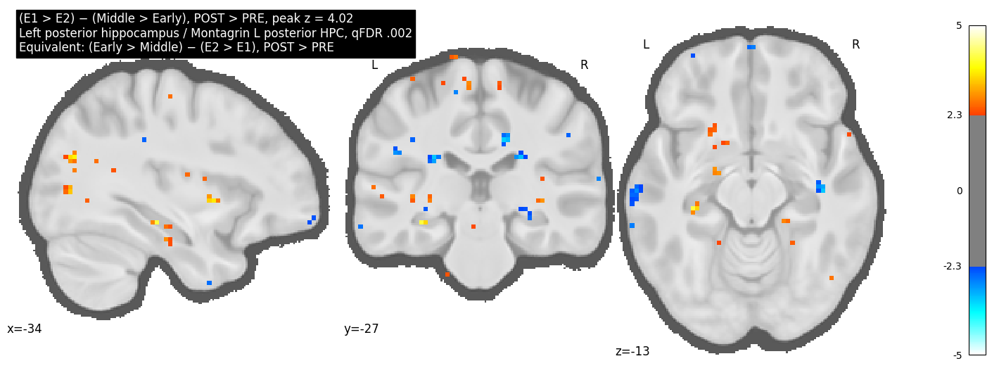


Figure 2/7
Main contrast:
(E1 > E3) − (Late > Early), POST > PRE
Equivalent form:
(Early > Late) − (E3 > E1), POST > PRE
Map:
/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/second_level_from_smoothed5mm/maps/group_temporal_e1_gt_e3_minus_spatial_late_gt_early_post_gt_pre_smoothed5mm_zmap.nii.gz


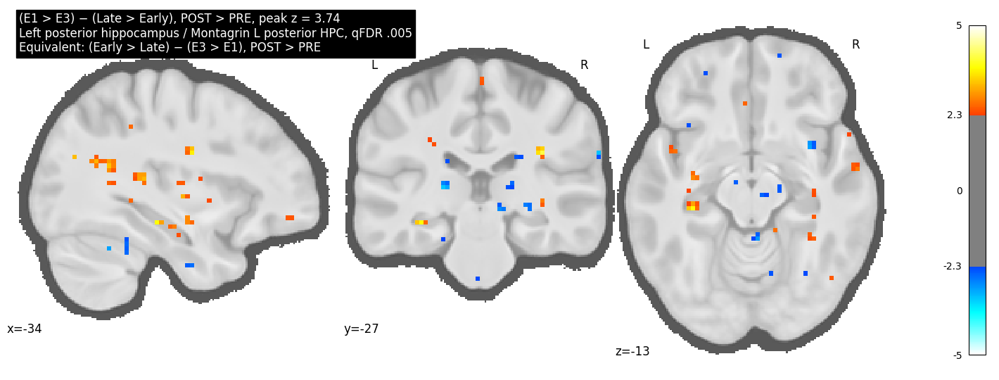


Figure 3/7
Main contrast:
(E1 > E2) − (Early > Middle), POST > PRE
Equivalent form:
(Middle > Early) − (E2 > E1), POST > PRE
Map:
/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/second_level_from_smoothed5mm/maps/group_temporal_e1_gt_e2_minus_spatial_early_gt_middle_post_gt_pre_smoothed5mm_zmap.nii.gz


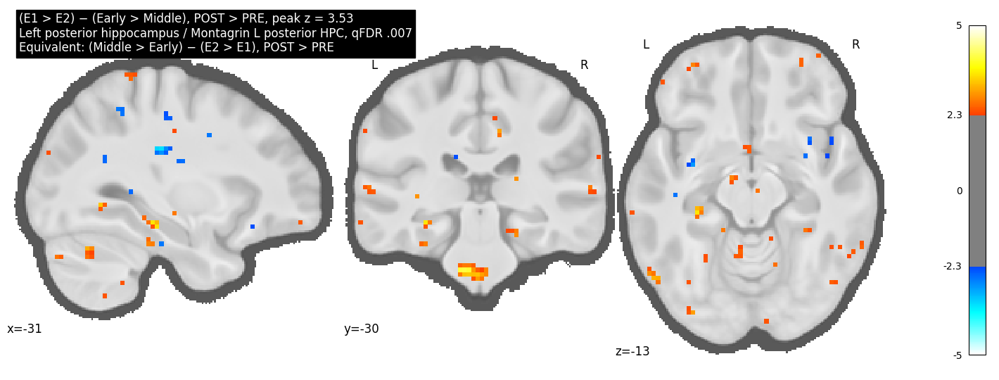


Figure 4/7
Main contrast:
(E2 > E3) − (Late > Middle), POST > PRE
Equivalent form:
(Middle > Late) − (E3 > E2), POST > PRE
Map:
/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/second_level_from_smoothed5mm/maps/group_temporal_e2_gt_e3_minus_spatial_late_gt_middle_post_gt_pre_smoothed5mm_zmap.nii.gz


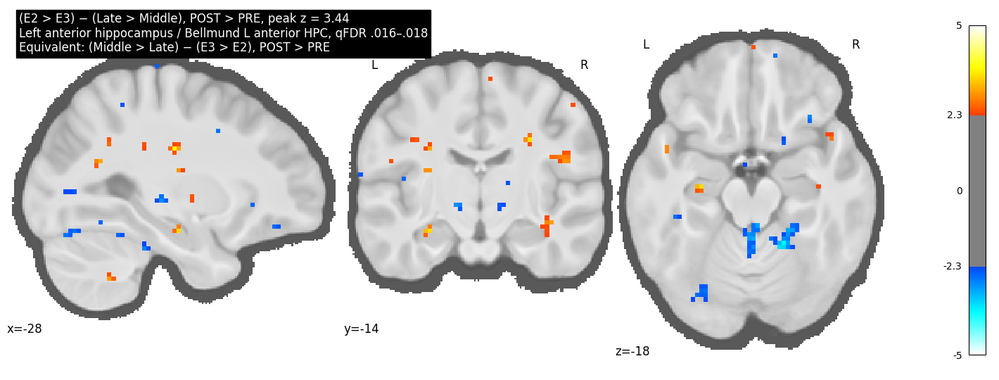


Figure 5/7
Main contrast:
(E1 > E2) − (Late > Middle), POST > PRE
Equivalent form:
(Middle > Late) − (E2 > E1), POST > PRE
Map:
/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/second_level_from_smoothed5mm/maps/group_temporal_e1_gt_e2_minus_spatial_late_gt_middle_post_gt_pre_smoothed5mm_zmap.nii.gz


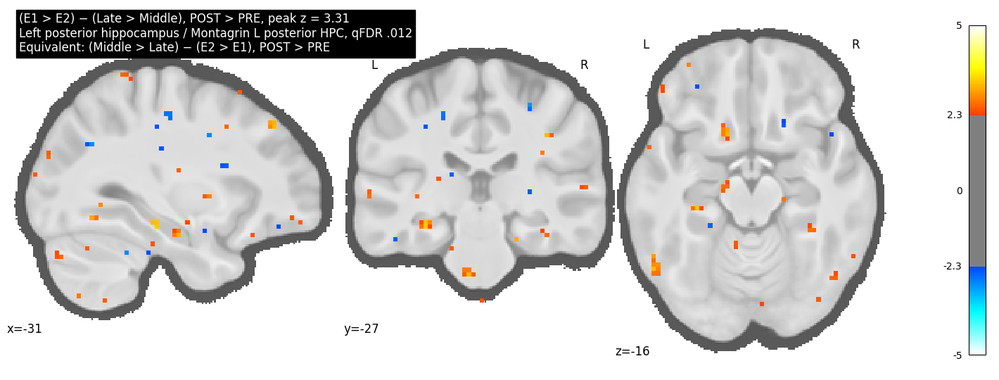


Figure 6/7
Main contrast:
(E1 > E2) − (Middle > Late), POST > PRE
Equivalent form:
(Late > Middle) − (E2 > E1), POST > PRE
Map:
/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/second_level_from_smoothed5mm/maps/group_temporal_e1_gt_e2_minus_spatial_middle_gt_late_post_gt_pre_smoothed5mm_zmap.nii.gz


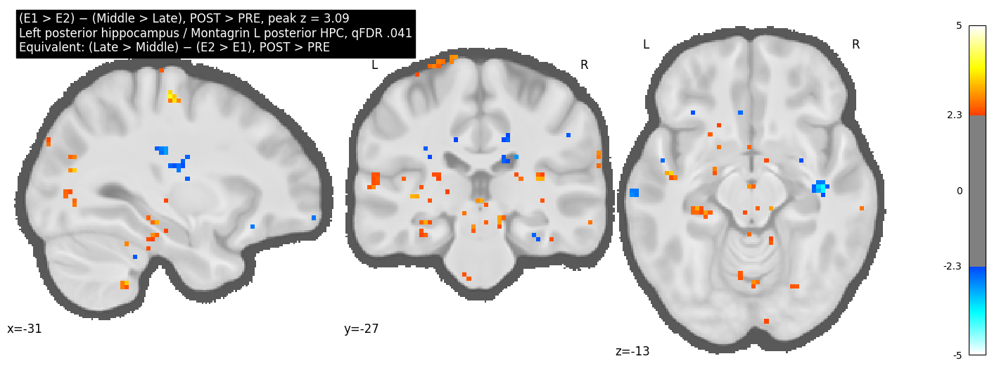


Figure 7/7
Main contrast:
(E1 > E2) − (Late > Middle), POST > PRE
Equivalent form:
(Middle > Late) − (E2 > E1), POST > PRE
Map:
/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/second_level_from_smoothed5mm/maps/group_temporal_e1_gt_e2_minus_spatial_late_gt_middle_post_gt_pre_smoothed5mm_zmap.nii.gz


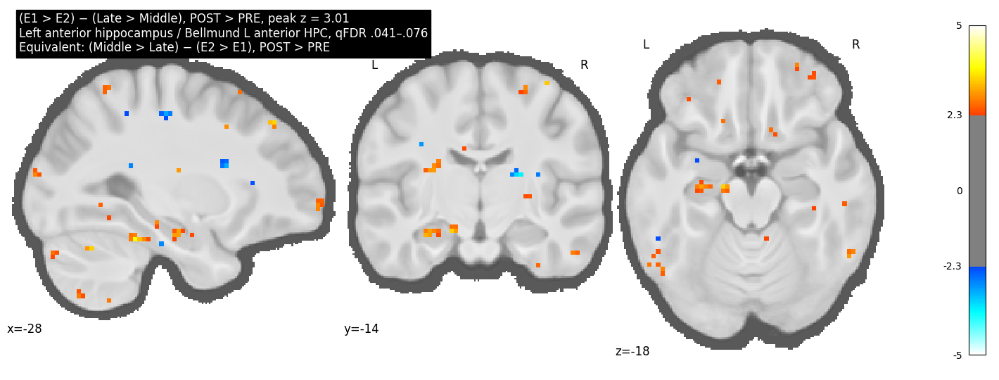


Saved plot index:
/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/tables/selected_temporal_spatial_hippocampus_maps/pre_post_temporal_minus_spatial_glm_selected_temporal_spatial_hippocampus_plot_index.csv


,id,main_label,equivalent_label,region,peak,peak_z,qfdr,note,png_path
0,01_posterior_E1_E2_middle_early,"(E1 > E2) − (Middle > Early), POST > PRE","(Early > Middle) − (E2 > E1), POST > PRE",Left posterior hippocampus,"(-34, -27, -13)",4.02,.002,E1-related posterior effect,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/figures/selected_temporal_spatial_hippocampus_maps/01_01_posterior_E1_E2_middle_early_Left_post...
1,02_posterior_E1_E3_late_early,"(E1 > E3) − (Late > Early), POST > PRE","(Early > Late) − (E3 > E1), POST > PRE",Left posterior hippocampus,"(-34, -27, -13)",3.74,.005,Large-distance E1-related posterior effect,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/figures/selected_temporal_spatial_hippocampus_maps/02_02_posterior_E1_E3_late_early_Left_poster...
2,03_posterior_E1_E2_early_middle,"(E1 > E2) − (Early > Middle), POST > PRE","(Middle > Early) − (E2 > E1), POST > PRE",Left posterior hippocampus,"(-31, -30, -13)",3.53,.007,E1-related posterior effect,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/figures/selected_temporal_spatial_hippocampus_maps/03_03_posterior_E1_E2_early_middle_Left_post...
3,04_anterior_E2_E3_late_middle,"(E2 > E3) − (Late > Middle), POST > PRE","(Middle > Late) − (E3 > E2), POST > PRE",Left anterior hippocampus,"(-28, -14, -18)",3.44,.016–.018,Local E2/E3 anterior effect,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/figures/selected_temporal_spatial_hippocampus_maps/04_04_anterior_E2_E3_late_middle_Left_anteri...
4,05_posterior_E1_E2_late_middle,"(E1 > E2) − (Late > Middle), POST > PRE","(Middle > Late) − (E2 > E1), POST > PRE",Left posterior hippocampus,"(-31, -27, -16)",3.31,.012,E1-related posterior effect,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/figures/selected_temporal_spatial_hippocampus_maps/05_05_posterior_E1_E2_late_middle_Left_poste...
5,06_posterior_E1_E2_middle_late,"(E1 > E2) − (Middle > Late), POST > PRE","(Late > Middle) − (E2 > E1), POST > PRE",Left posterior hippocampus,"(-31, -27, -13)",3.09,.041,Weaker E1-related posterior effect,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/figures/selected_temporal_spatial_hippocampus_maps/06_06_posterior_E1_E2_middle_late_Left_poste...
6,07_anterior_E1_E2_late_middle_secondary,"(E1 > E2) − (Late > Middle), POST > PRE","(Middle > Late) − (E2 > E1), POST > PRE",Left anterior hippocampus,"(-28, -14, -18)",3.01,.041–.076,Secondary anterior recurrence,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/figures/selected_temporal_spatial_hippocampus_maps/07_07_anterior_E1_E2_late_middle_secondary_L...


In [43]:
# ============================================================
# Plot selected hippocampal temporal–spatial marginal contrasts
# Same visual format as previous project figures
# ============================================================

from pathlib import Path
import textwrap
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from nilearn import plotting
from nilearn.image import load_img

# ------------------------------------------------------------
# Output folder
# ------------------------------------------------------------

selected_fig_dir = dirs["figures"] / "selected_temporal_spatial_hippocampus_maps"
selected_fig_dir.mkdir(parents=True, exist_ok=True)

selected_table_dir = dirs["tables"] / "selected_temporal_spatial_hippocampus_maps"
selected_table_dir.mkdir(parents=True, exist_ok=True)

print("Saving selected hippocampus figures to:")
print(selected_fig_dir)


# ------------------------------------------------------------
# Select the table that contains the z-map paths
# ------------------------------------------------------------

if "second_level_table_with_reverse" in globals():
    second_level_table_for_plot = second_level_table_with_reverse.copy()
    print("Using second_level_table_with_reverse.")
else:
    second_level_table_for_plot = second_level_table.copy()
    print("Using original second_level_table.")


def get_z_map_path_for_contrast_plot(contrast_name):
    """Return z-map path for a contrast name."""
    matches = second_level_table_for_plot.loc[
        second_level_table_for_plot["contrast"].astype(str) == str(contrast_name),
        "z_map_path",
    ]

    if len(matches) == 0:
        raise ValueError(
            f"No z_map_path found for contrast:\n{contrast_name}\n\n"
            f"Available contrast examples:\n"
            f"{second_level_table_for_plot['contrast'].head(30).to_string(index=False)}"
        )

    return Path(matches.iloc[0])


# ------------------------------------------------------------
# Background image
# ------------------------------------------------------------
# Uses the same convention as the rest of the project.

if (
    "USE_MEAN_T1W_BACKGROUND" in globals()
    and USE_MEAN_T1W_BACKGROUND
    and "mean_t1w_img" in globals()
    and mean_t1w_img is not None
):
    bg_img_for_plot = mean_t1w_img
    print("Using mean T1w background.")
elif "mean_t1w_img" in globals() and mean_t1w_img is not None:
    bg_img_for_plot = mean_t1w_img
    print("Using mean T1w background.")
else:
    bg_img_for_plot = None
    print("Using nilearn default anatomical background.")


# ------------------------------------------------------------
# Plot specs
# ------------------------------------------------------------
# Important:
# - Each row below is one UNIQUE effect.
# - The equivalent expression is included in the title.
# - We use the Temporal − Spatial map for plotting because it carries
#   the positive peak for the chosen effect.
# - The Spatial − Temporal label is shown only as the equivalent description.

selected_plot_specs = [
    {
        "id": "01_posterior_E1_E2_middle_early",
        "map_contrast": "temporal_e1_gt_e2_minus_spatial_middle_gt_early_post_gt_pre",
        "main_label": "(E1 > E2) − (Middle > Early), POST > PRE",
        "equivalent_label": "(Early > Middle) − (E2 > E1), POST > PRE",
        "peak": (-34, -27, -13),
        "region": "Left posterior hippocampus",
        "literature": "Montagrin L posterior HPC",
        "peak_z": 4.02,
        "qfdr": ".002",
        "note": "E1-related posterior effect",
    },
    {
        "id": "02_posterior_E1_E3_late_early",
        "map_contrast": "temporal_e1_gt_e3_minus_spatial_late_gt_early_post_gt_pre",
        "main_label": "(E1 > E3) − (Late > Early), POST > PRE",
        "equivalent_label": "(Early > Late) − (E3 > E1), POST > PRE",
        "peak": (-34, -27, -13),
        "region": "Left posterior hippocampus",
        "literature": "Montagrin L posterior HPC",
        "peak_z": 3.74,
        "qfdr": ".005",
        "note": "Large-distance E1-related posterior effect",
    },
    {
        "id": "03_posterior_E1_E2_early_middle",
        "map_contrast": "temporal_e1_gt_e2_minus_spatial_early_gt_middle_post_gt_pre",
        "main_label": "(E1 > E2) − (Early > Middle), POST > PRE",
        "equivalent_label": "(Middle > Early) − (E2 > E1), POST > PRE",
        "peak": (-31, -30, -13),
        "region": "Left posterior hippocampus",
        "literature": "Montagrin L posterior HPC",
        "peak_z": 3.53,
        "qfdr": ".007",
        "note": "E1-related posterior effect",
    },
    {
        "id": "04_anterior_E2_E3_late_middle",
        "map_contrast": "temporal_e2_gt_e3_minus_spatial_late_gt_middle_post_gt_pre",
        "main_label": "(E2 > E3) − (Late > Middle), POST > PRE",
        "equivalent_label": "(Middle > Late) − (E3 > E2), POST > PRE",
        "peak": (-28, -14, -18),
        "region": "Left anterior hippocampus",
        "literature": "Bellmund L anterior HPC",
        "peak_z": 3.44,
        "qfdr": ".016–.018",
        "note": "Local E2/E3 anterior effect",
    },
    {
        "id": "05_posterior_E1_E2_late_middle",
        "map_contrast": "temporal_e1_gt_e2_minus_spatial_late_gt_middle_post_gt_pre",
        "main_label": "(E1 > E2) − (Late > Middle), POST > PRE",
        "equivalent_label": "(Middle > Late) − (E2 > E1), POST > PRE",
        "peak": (-31, -27, -16),
        "region": "Left posterior hippocampus",
        "literature": "Montagrin L posterior HPC",
        "peak_z": 3.31,
        "qfdr": ".012",
        "note": "E1-related posterior effect",
    },
    {
        "id": "06_posterior_E1_E2_middle_late",
        "map_contrast": "temporal_e1_gt_e2_minus_spatial_middle_gt_late_post_gt_pre",
        "main_label": "(E1 > E2) − (Middle > Late), POST > PRE",
        "equivalent_label": "(Late > Middle) − (E2 > E1), POST > PRE",
        "peak": (-31, -27, -13),
        "region": "Left posterior hippocampus",
        "literature": "Montagrin L posterior HPC",
        "peak_z": 3.09,
        "qfdr": ".041",
        "note": "Weaker E1-related posterior effect",
    },
    {
        "id": "07_anterior_E1_E2_late_middle_secondary",
        "map_contrast": "temporal_e1_gt_e2_minus_spatial_late_gt_middle_post_gt_pre",
        "main_label": "(E1 > E2) − (Late > Middle), POST > PRE",
        "equivalent_label": "(Middle > Late) − (E2 > E1), POST > PRE",
        "peak": (-28, -14, -18),
        "region": "Left anterior hippocampus",
        "literature": "Bellmund L anterior HPC",
        "peak_z": 3.01,
        "qfdr": ".041–.076",
        "note": "Secondary anterior recurrence",
    },
]


# ============================================================
# Plot helper — save AND show directly inside notebook
# ============================================================

def make_selected_hippocampus_plot(
    z_map_path,
    cut_coords,
    main_label,
    equivalent_label,
    region,
    literature,
    peak_z,
    qfdr,
    output_base,
    threshold=2.33,
    vmax=5.0,
    show_inline=True,
):
    """
    Plot one selected contrast in the same visual style used earlier:
    - ortho view
    - thresholded at z > 2.33
    - cold_hot symmetric colorbar
    - no crosshair
    - black title box with white text
    - saves PNG/PDF
    - optionally displays inline in notebook
    """

    stat_img = load_img(str(z_map_path))

    fig = plt.figure(figsize=(14, 5.2), facecolor="white")

    nilearn_display = plotting.plot_stat_map(
        stat_img,
        bg_img=bg_img_for_plot,
        display_mode="ortho",
        cut_coords=cut_coords,
        threshold=threshold,
        vmax=vmax,
        cmap="cold_hot",
        symmetric_cbar=True,
        black_bg=False,
        draw_cross=False,
        colorbar=True,
        annotate=True,
        figure=fig,
        title=None,
    )

    title_line_1 = f"{main_label}, peak z = {peak_z:.2f}"
    title_line_2 = f"{region} / {literature}, qFDR {qfdr}"
    title_line_3 = f"Equivalent: {equivalent_label}"

    wrapped_equiv = "\n".join(textwrap.wrap(title_line_3, width=82))
    full_title = f"{title_line_1}\n{title_line_2}\n{wrapped_equiv}"

    fig.text(
        0.012,
        0.985,
        full_title,
        ha="left",
        va="top",
        fontsize=12,
        color="white",
        bbox=dict(
            facecolor="black",
            edgecolor="black",
            boxstyle="square,pad=0.25",
        ),
    )

    png_path = selected_fig_dir / f"{output_base}.png"
    pdf_path = selected_fig_dir / f"{output_base}.pdf"

    fig.savefig(png_path, dpi=300, bbox_inches="tight", facecolor="white")
    fig.savefig(pdf_path, bbox_inches="tight", facecolor="white")

    if show_inline:
        plt.show()

    nilearn_display.close()
    plt.close(fig)

    return png_path, pdf_path


# ============================================================
# Generate, save, and display all selected figures inline
# ============================================================

plot_rows = []

for i, spec in enumerate(selected_plot_specs, start=1):
    z_map_path = get_z_map_path_for_contrast_plot(spec["map_contrast"])

    output_base = (
        f"{i:02d}_{spec['id']}_"
        f"{_safe_filename(spec['region'])}_"
        f"x{spec['peak'][0]}_y{spec['peak'][1]}_z{spec['peak'][2]}"
    )

    print("\n" + "=" * 100)
    print(f"Figure {i}/{len(selected_plot_specs)}")
    print("Main contrast:")
    print(spec["main_label"])
    print("Equivalent form:")
    print(spec["equivalent_label"])
    print("Map:")
    print(z_map_path)
    print("=" * 100)

    png_path, pdf_path = make_selected_hippocampus_plot(
        z_map_path=z_map_path,
        cut_coords=spec["peak"],
        main_label=spec["main_label"],
        equivalent_label=spec["equivalent_label"],
        region=spec["region"],
        literature=spec["literature"],
        peak_z=spec["peak_z"],
        qfdr=spec["qfdr"],
        output_base=output_base,
        threshold=2.33,
        vmax=5.0,
        show_inline=True,
    )

    row = spec.copy()
    row["z_map_path"] = str(z_map_path)
    row["png_path"] = str(png_path)
    row["pdf_path"] = str(pdf_path)
    plot_rows.append(row)

selected_plot_table = pd.DataFrame(plot_rows)

selected_plot_table_path = (
    selected_table_dir
    / f"{ANALYSIS_NAME}_selected_temporal_spatial_hippocampus_plot_index.csv"
)

selected_plot_table.to_csv(selected_plot_table_path, index=False)

print("\nSaved plot index:")
print(selected_plot_table_path)

display(
    selected_plot_table[
        [
            "id",
            "main_label",
            "equivalent_label",
            "region",
            "peak",
            "peak_z",
            "qfdr",
            "note",
            "png_path",
        ]
    ]
)



Saving selected hippocampus figures to:
/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/figures/selected_temporal_spatial_hippocampus_maps
Using second_level_table_with_reverse.
Using common mean_t1w_img background from global variable.

Figure 1/7
Main contrast:
(E1 > E2) − (Middle > Early), POST > PRE
Equivalent form:
(Early > Middle) − (E2 > E1), POST > PRE
Map:
/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/second_level_from_smoothed5mm/maps/group_temporal_e1_gt_e2_minus_spatial_middle_gt_early_post_gt_pre_smoothed5mm_zmap.nii.gz


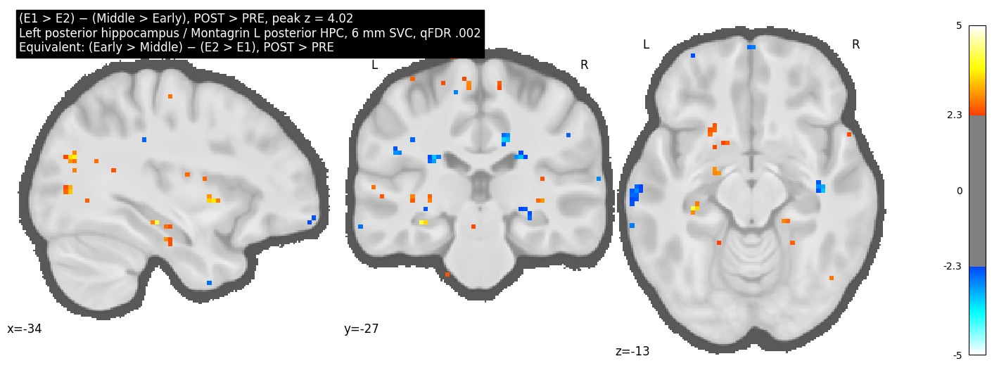


Figure 2/7
Main contrast:
(E1 > E3) − (Late > Early), POST > PRE
Equivalent form:
(Early > Late) − (E3 > E1), POST > PRE
Map:
/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/second_level_from_smoothed5mm/maps/group_temporal_e1_gt_e3_minus_spatial_late_gt_early_post_gt_pre_smoothed5mm_zmap.nii.gz


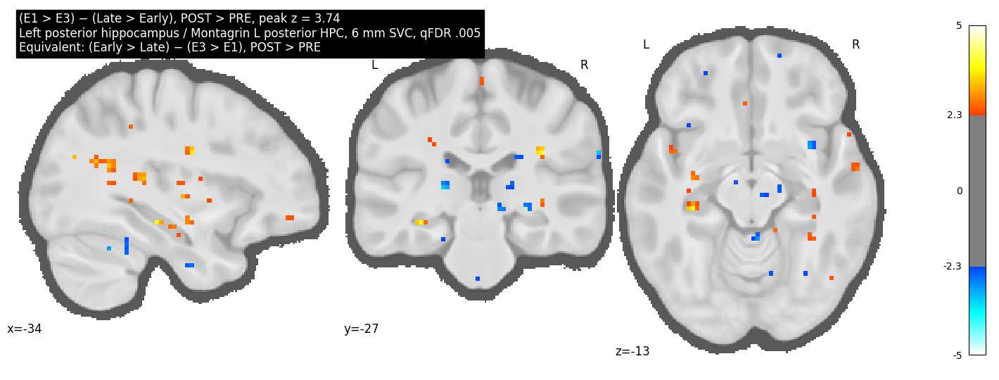


Figure 3/7
Main contrast:
(E1 > E2) − (Early > Middle), POST > PRE
Equivalent form:
(Middle > Early) − (E2 > E1), POST > PRE
Map:
/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/second_level_from_smoothed5mm/maps/group_temporal_e1_gt_e2_minus_spatial_early_gt_middle_post_gt_pre_smoothed5mm_zmap.nii.gz


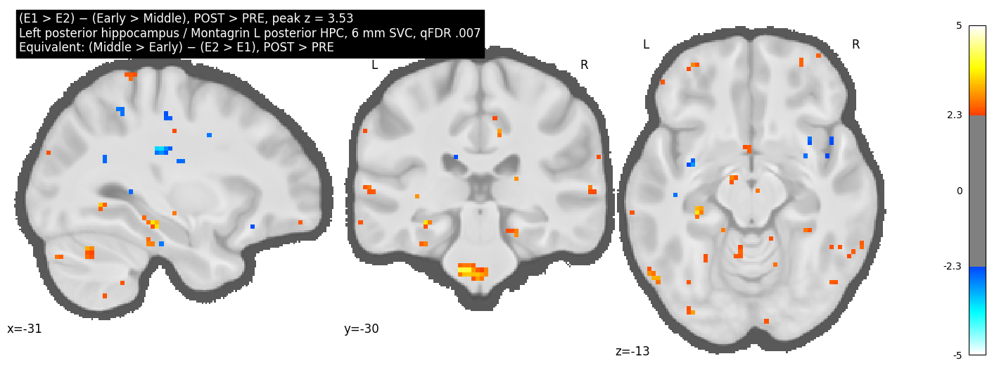


Figure 4/7
Main contrast:
(E2 > E3) − (Late > Middle), POST > PRE
Equivalent form:
(Middle > Late) − (E3 > E2), POST > PRE
Map:
/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/second_level_from_smoothed5mm/maps/group_temporal_e2_gt_e3_minus_spatial_late_gt_middle_post_gt_pre_smoothed5mm_zmap.nii.gz


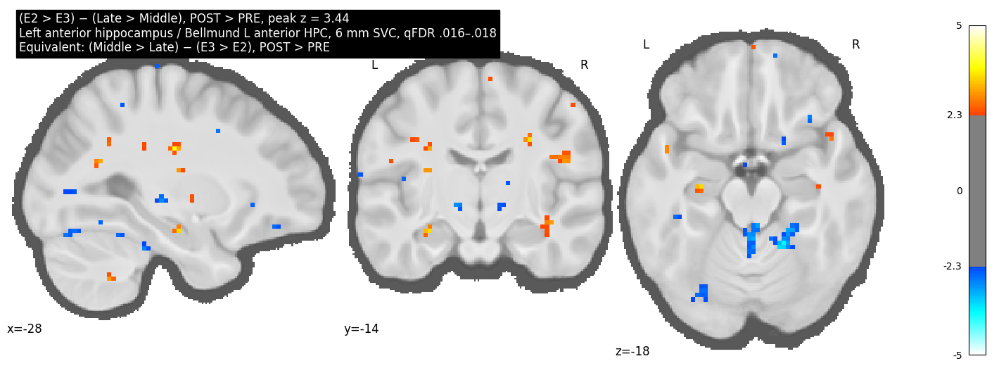


Figure 5/7
Main contrast:
(E1 > E2) − (Late > Middle), POST > PRE
Equivalent form:
(Middle > Late) − (E2 > E1), POST > PRE
Map:
/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/second_level_from_smoothed5mm/maps/group_temporal_e1_gt_e2_minus_spatial_late_gt_middle_post_gt_pre_smoothed5mm_zmap.nii.gz


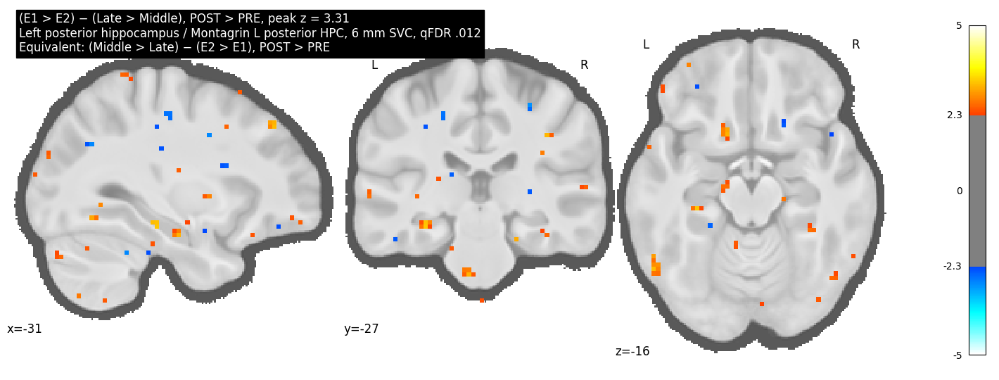


Figure 6/7
Main contrast:
(E1 > E2) − (Middle > Late), POST > PRE
Equivalent form:
(Late > Middle) − (E2 > E1), POST > PRE
Map:
/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/second_level_from_smoothed5mm/maps/group_temporal_e1_gt_e2_minus_spatial_middle_gt_late_post_gt_pre_smoothed5mm_zmap.nii.gz


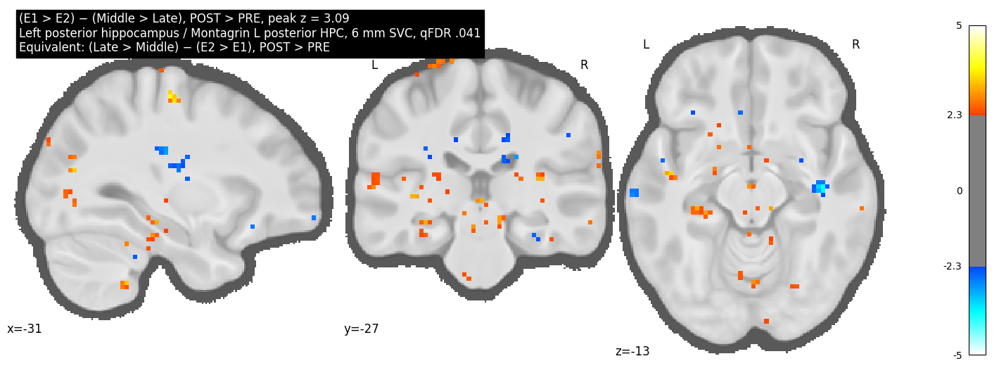


Figure 7/7
Main contrast:
(E1 > E2) − (Late > Middle), POST > PRE
Equivalent form:
(Middle > Late) − (E2 > E1), POST > PRE
Map:
/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/second_level_from_smoothed5mm/maps/group_temporal_e1_gt_e2_minus_spatial_late_gt_middle_post_gt_pre_smoothed5mm_zmap.nii.gz


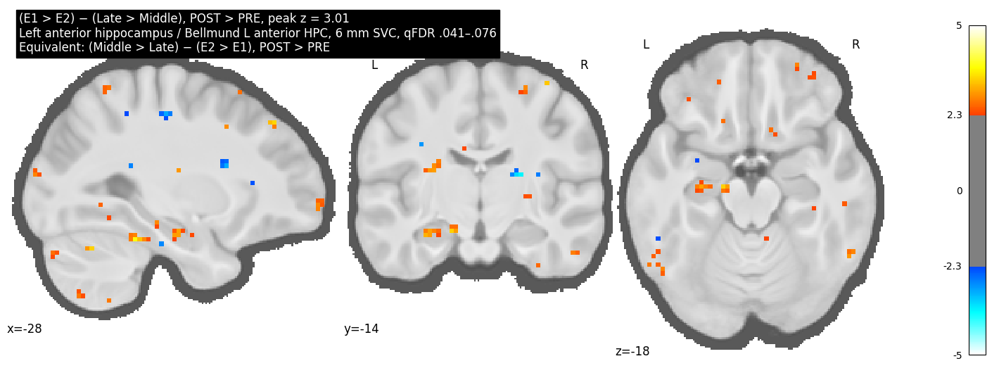


Saved plot index:
/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/tables/selected_temporal_spatial_hippocampus_maps/pre_post_temporal_minus_spatial_glm_selected_temporal_spatial_hippocampus_plot_index.csv


,id,main_label,equivalent_label,region,peak,peak_z,qfdr,note,png_path
0,01_posterior_E1_E2_middle_early,"(E1 > E2) − (Middle > Early), POST > PRE","(Early > Middle) − (E2 > E1), POST > PRE",Left posterior hippocampus,"(-34, -27, -13)",4.02,.002,E1-related posterior effect,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/figures/selected_temporal_spatial_hippocampus_maps/01_01_posterior_E1_E2_middle_early_Left_post...
1,02_posterior_E1_E3_late_early,"(E1 > E3) − (Late > Early), POST > PRE","(Early > Late) − (E3 > E1), POST > PRE",Left posterior hippocampus,"(-34, -27, -13)",3.74,.005,Large-distance E1-related posterior effect,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/figures/selected_temporal_spatial_hippocampus_maps/02_02_posterior_E1_E3_late_early_Left_poster...
2,03_posterior_E1_E2_early_middle,"(E1 > E2) − (Early > Middle), POST > PRE","(Middle > Early) − (E2 > E1), POST > PRE",Left posterior hippocampus,"(-31, -30, -13)",3.53,.007,E1-related posterior effect,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/figures/selected_temporal_spatial_hippocampus_maps/03_03_posterior_E1_E2_early_middle_Left_post...
3,04_anterior_E2_E3_late_middle,"(E2 > E3) − (Late > Middle), POST > PRE","(Middle > Late) − (E3 > E2), POST > PRE",Left anterior hippocampus,"(-28, -14, -18)",3.44,.016–.018,Local E2/E3 anterior effect,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/figures/selected_temporal_spatial_hippocampus_maps/04_04_anterior_E2_E3_late_middle_Left_anteri...
4,05_posterior_E1_E2_late_middle,"(E1 > E2) − (Late > Middle), POST > PRE","(Middle > Late) − (E2 > E1), POST > PRE",Left posterior hippocampus,"(-31, -27, -16)",3.31,.012,E1-related posterior effect,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/figures/selected_temporal_spatial_hippocampus_maps/05_05_posterior_E1_E2_late_middle_Left_poste...
5,06_posterior_E1_E2_middle_late,"(E1 > E2) − (Middle > Late), POST > PRE","(Late > Middle) − (E2 > E1), POST > PRE",Left posterior hippocampus,"(-31, -27, -13)",3.09,.041,Weaker E1-related posterior effect,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/figures/selected_temporal_spatial_hippocampus_maps/06_06_posterior_E1_E2_middle_late_Left_poste...
6,07_anterior_E1_E2_late_middle_secondary,"(E1 > E2) − (Late > Middle), POST > PRE","(Middle > Late) − (E2 > E1), POST > PRE",Left anterior hippocampus,"(-28, -14, -18)",3.01,.041–.076,Secondary anterior recurrence,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/figures/selected_temporal_spatial_hippocampus_maps/07_07_anterior_E1_E2_late_middle_secondary_L...


In [44]:
# ============================================================
# Plot selected hippocampal temporal–spatial marginal contrasts
# Common T1 background + same visual format as previous project figures
# ============================================================

from pathlib import Path
import textwrap
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from nilearn import plotting
from nilearn.image import load_img


# ------------------------------------------------------------
# Output folders
# ------------------------------------------------------------

selected_fig_dir = dirs["figures"] / "selected_temporal_spatial_hippocampus_maps"
selected_fig_dir.mkdir(parents=True, exist_ok=True)

selected_table_dir = dirs["tables"] / "selected_temporal_spatial_hippocampus_maps"
selected_table_dir.mkdir(parents=True, exist_ok=True)

print("Saving selected hippocampus figures to:")
print(selected_fig_dir)


# ------------------------------------------------------------
# Select the table that contains the z-map paths
# ------------------------------------------------------------

if "second_level_table_with_reverse" in globals():
    second_level_table_for_plot = second_level_table_with_reverse.copy()
    print("Using second_level_table_with_reverse.")
elif "second_level_table_for_svc" in globals():
    second_level_table_for_plot = second_level_table_for_svc.copy()
    print("Using second_level_table_for_svc.")
else:
    second_level_table_for_plot = second_level_table.copy()
    print("Using original second_level_table.")


def get_z_map_path_for_contrast_plot(contrast_name):
    """Return z-map path for a contrast name."""
    matches = second_level_table_for_plot.loc[
        second_level_table_for_plot["contrast"].astype(str) == str(contrast_name),
        "z_map_path",
    ]

    if len(matches) == 0:
        raise ValueError(
            f"No z_map_path found for contrast:\n{contrast_name}\n\n"
            f"Available contrast examples:\n"
            f"{second_level_table_for_plot['contrast'].head(40).to_string(index=False)}"
        )

    return Path(matches.iloc[0])


# ------------------------------------------------------------
# Common T1 background
# ------------------------------------------------------------
# This cell intentionally uses the common mean T1w image used previously
# in the project figures. It does NOT silently fall back to nilearn default.

def get_common_t1_background_for_plot():
    """
    Retrieve the common T1 background used throughout the project.

    Priority:
    1. mean_t1w_img global variable
    2. common_inputs["mean_t1w_img"] or similar keys, if present
    3. common_inputs object attributes, if present

    Raises an error if no common T1 image is found.
    """

    if "mean_t1w_img" in globals() and mean_t1w_img is not None:
        print("Using common mean_t1w_img background from global variable.")
        return mean_t1w_img

    if "common_inputs" in globals():
        if isinstance(common_inputs, dict):
            for key in [
                "mean_t1w_img",
                "mean_t1w",
                "group_t1w_img",
                "background_img",
                "bg_img",
            ]:
                if key in common_inputs and common_inputs[key] is not None:
                    print(f"Using common T1 background from common_inputs['{key}'].")
                    return common_inputs[key]

        for attr in [
            "mean_t1w_img",
            "mean_t1w",
            "group_t1w_img",
            "background_img",
            "bg_img",
        ]:
            if hasattr(common_inputs, attr):
                img = getattr(common_inputs, attr)
                if img is not None:
                    print(f"Using common T1 background from common_inputs.{attr}.")
                    return img

    raise RuntimeError(
        "Could not find the common T1 background image.\n\n"
        "Expected a variable named mean_t1w_img, or a common_inputs object/dict "
        "containing mean_t1w_img.\n\n"
        "Please rerun the notebook cell that loads common project inputs, usually something like:\n"
        "    common_inputs = load_common_inputs(paths)\n"
        "    mean_t1w_img = common_inputs['mean_t1w_img']\n"
        "or check how mean_t1w_img was defined in the previous plotting cells."
    )


bg_img_for_plot = get_common_t1_background_for_plot()


# ------------------------------------------------------------
# Utility
# ------------------------------------------------------------

def _safe_filename(text):
    return (
        str(text)
        .replace(" ", "_")
        .replace("/", "-")
        .replace(">", "gt")
        .replace("<", "lt")
        .replace("−", "minus")
        .replace("–", "-")
        .replace("(", "")
        .replace(")", "")
        .replace(",", "")
        .replace(".", "p")
        .replace(":", "")
        .replace(";", "")
    )


# ------------------------------------------------------------
# Plot specs
# ------------------------------------------------------------
# Important:
# - Each row below is one UNIQUE effect.
# - The equivalent expression is included in the title.
# - We use the Temporal − Spatial map for plotting because it carries
#   the positive peak for the chosen effect.
# - The Spatial − Temporal label is shown only as the equivalent description.

selected_plot_specs = [
    {
        "id": "01_posterior_E1_E2_middle_early",
        "map_contrast": "temporal_e1_gt_e2_minus_spatial_middle_gt_early_post_gt_pre",
        "main_label": "(E1 > E2) − (Middle > Early), POST > PRE",
        "equivalent_label": "(Early > Middle) − (E2 > E1), POST > PRE",
        "peak": (-34, -27, -13),
        "region": "Left posterior hippocampus",
        "literature": "Montagrin L posterior HPC",
        "peak_z": 4.02,
        "qfdr": ".002",
        "note": "E1-related posterior effect",
    },
    {
        "id": "02_posterior_E1_E3_late_early",
        "map_contrast": "temporal_e1_gt_e3_minus_spatial_late_gt_early_post_gt_pre",
        "main_label": "(E1 > E3) − (Late > Early), POST > PRE",
        "equivalent_label": "(Early > Late) − (E3 > E1), POST > PRE",
        "peak": (-34, -27, -13),
        "region": "Left posterior hippocampus",
        "literature": "Montagrin L posterior HPC",
        "peak_z": 3.74,
        "qfdr": ".005",
        "note": "Large-distance E1-related posterior effect",
    },
    {
        "id": "03_posterior_E1_E2_early_middle",
        "map_contrast": "temporal_e1_gt_e2_minus_spatial_early_gt_middle_post_gt_pre",
        "main_label": "(E1 > E2) − (Early > Middle), POST > PRE",
        "equivalent_label": "(Middle > Early) − (E2 > E1), POST > PRE",
        "peak": (-31, -30, -13),
        "region": "Left posterior hippocampus",
        "literature": "Montagrin L posterior HPC",
        "peak_z": 3.53,
        "qfdr": ".007",
        "note": "E1-related posterior effect",
    },
    {
        "id": "04_anterior_E2_E3_late_middle",
        "map_contrast": "temporal_e2_gt_e3_minus_spatial_late_gt_middle_post_gt_pre",
        "main_label": "(E2 > E3) − (Late > Middle), POST > PRE",
        "equivalent_label": "(Middle > Late) − (E3 > E2), POST > PRE",
        "peak": (-28, -14, -18),
        "region": "Left anterior hippocampus",
        "literature": "Bellmund L anterior HPC",
        "peak_z": 3.44,
        "qfdr": ".016–.018",
        "note": "Local E2/E3 anterior effect",
    },
    {
        "id": "05_posterior_E1_E2_late_middle",
        "map_contrast": "temporal_e1_gt_e2_minus_spatial_late_gt_middle_post_gt_pre",
        "main_label": "(E1 > E2) − (Late > Middle), POST > PRE",
        "equivalent_label": "(Middle > Late) − (E2 > E1), POST > PRE",
        "peak": (-31, -27, -16),
        "region": "Left posterior hippocampus",
        "literature": "Montagrin L posterior HPC",
        "peak_z": 3.31,
        "qfdr": ".012",
        "note": "E1-related posterior effect",
    },
    {
        "id": "06_posterior_E1_E2_middle_late",
        "map_contrast": "temporal_e1_gt_e2_minus_spatial_middle_gt_late_post_gt_pre",
        "main_label": "(E1 > E2) − (Middle > Late), POST > PRE",
        "equivalent_label": "(Late > Middle) − (E2 > E1), POST > PRE",
        "peak": (-31, -27, -13),
        "region": "Left posterior hippocampus",
        "literature": "Montagrin L posterior HPC",
        "peak_z": 3.09,
        "qfdr": ".041",
        "note": "Weaker E1-related posterior effect",
    },
    {
        "id": "07_anterior_E1_E2_late_middle_secondary",
        "map_contrast": "temporal_e1_gt_e2_minus_spatial_late_gt_middle_post_gt_pre",
        "main_label": "(E1 > E2) − (Late > Middle), POST > PRE",
        "equivalent_label": "(Middle > Late) − (E2 > E1), POST > PRE",
        "peak": (-28, -14, -18),
        "region": "Left anterior hippocampus",
        "literature": "Bellmund L anterior HPC",
        "peak_z": 3.01,
        "qfdr": ".041–.076",
        "note": "Secondary anterior recurrence",
    },
]


# ============================================================
# Plot helper — save AND show directly inside notebook
# ============================================================

def make_selected_hippocampus_plot(
    z_map_path,
    cut_coords,
    main_label,
    equivalent_label,
    region,
    literature,
    peak_z,
    qfdr,
    output_base,
    threshold=2.33,
    vmax=5.0,
    show_inline=True,
):
    """
    Plot one selected contrast in the same visual style used earlier:
    - common T1 background
    - ortho view
    - thresholded at z > 2.33
    - cold_hot symmetric colorbar
    - no crosshair
    - black title box with white text
    - saves PNG/PDF
    - optionally displays inline in notebook
    """

    stat_img = load_img(str(z_map_path))

    fig = plt.figure(figsize=(14, 5.2), facecolor="white")

    nilearn_display = plotting.plot_stat_map(
        stat_img,
        bg_img=bg_img_for_plot,
        display_mode="ortho",
        cut_coords=cut_coords,
        threshold=threshold,
        vmax=vmax,
        cmap="cold_hot",
        symmetric_cbar=True,
        black_bg=False,
        draw_cross=False,
        colorbar=True,
        annotate=True,
        figure=fig,
        title=None,
    )

    title_line_1 = f"{main_label}, peak z = {peak_z:.2f}"
    title_line_2 = f"{region} / {literature}, 6 mm SVC, qFDR {qfdr}"
    title_line_3 = f"Equivalent: {equivalent_label}"

    wrapped_equiv = "\n".join(textwrap.wrap(title_line_3, width=86))
    full_title = f"{title_line_1}\n{title_line_2}\n{wrapped_equiv}"

    fig.text(
        0.012,
        0.985,
        full_title,
        ha="left",
        va="top",
        fontsize=12,
        color="white",
        bbox=dict(
            facecolor="black",
            edgecolor="black",
            boxstyle="square,pad=0.25",
        ),
    )

    png_path = selected_fig_dir / f"{output_base}.png"
    pdf_path = selected_fig_dir / f"{output_base}.pdf"

    fig.savefig(png_path, dpi=300, bbox_inches="tight", facecolor="white")
    fig.savefig(pdf_path, bbox_inches="tight", facecolor="white")

    if show_inline:
        plt.show()

    nilearn_display.close()
    plt.close(fig)

    return png_path, pdf_path


# ============================================================
# Generate, save, and display all selected figures inline
# ============================================================

plot_rows = []

for i, spec in enumerate(selected_plot_specs, start=1):
    z_map_path = get_z_map_path_for_contrast_plot(spec["map_contrast"])

    output_base = (
        f"{i:02d}_{spec['id']}_"
        f"{_safe_filename(spec['region'])}_"
        f"x{spec['peak'][0]}_y{spec['peak'][1]}_z{spec['peak'][2]}"
    )

    print("\n" + "=" * 100)
    print(f"Figure {i}/{len(selected_plot_specs)}")
    print("Main contrast:")
    print(spec["main_label"])
    print("Equivalent form:")
    print(spec["equivalent_label"])
    print("Map:")
    print(z_map_path)
    print("=" * 100)

    png_path, pdf_path = make_selected_hippocampus_plot(
        z_map_path=z_map_path,
        cut_coords=spec["peak"],
        main_label=spec["main_label"],
        equivalent_label=spec["equivalent_label"],
        region=spec["region"],
        literature=spec["literature"],
        peak_z=spec["peak_z"],
        qfdr=spec["qfdr"],
        output_base=output_base,
        threshold=2.33,
        vmax=5.0,
        show_inline=True,
    )

    row = spec.copy()
    row["z_map_path"] = str(z_map_path)
    row["png_path"] = str(png_path)
    row["pdf_path"] = str(pdf_path)
    plot_rows.append(row)

selected_plot_table = pd.DataFrame(plot_rows)

selected_plot_table_path = (
    selected_table_dir
    / f"{ANALYSIS_NAME}_selected_temporal_spatial_hippocampus_plot_index.csv"
)

selected_plot_table.to_csv(selected_plot_table_path, index=False)

print("\nSaved plot index:")
print(selected_plot_table_path)

display(
    selected_plot_table[
        [
            "id",
            "main_label",
            "equivalent_label",
            "region",
            "peak",
            "peak_z",
            "qfdr",
            "note",
            "png_path",
        ]
    ]
)

Saving final temporal − spatial marginal figures to: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/figures/final_temporal_minus_spatial_marginal_svc_figures
Saving final temporal − spatial marginal tables to: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/tables/final_temporal_minus_spatial_marginal_svc_figures
Using common mean_t1w_img background.

Selected row candidates:


,contrast,paper,literature_roi,peak_x,peak_y,peak_z_coord,peak_z_stat,peak_p_bonferroni_within_sphere,peak_q_fdr_within_sphere,peak_distance_from_literature_center_mm,z_map_path
0,temporal_e1_gt_e2_minus_spatial_middle_gt_early_post_gt_pre,Montagrin et al.,Montagrin_current_gt_remote_left_posterior_HPC,-33.5,-27.0,-13.0,4.024313,0.0016,0.0016,5.522681,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/second_level_from_smoothed5mm/maps/group_temporal_e1_gt_e2_minus_spatial_middle_gt_early_post_g...



Selected row candidates:


,contrast,paper,literature_roi,peak_x,peak_y,peak_z_coord,peak_z_stat,peak_p_bonferroni_within_sphere,peak_q_fdr_within_sphere,peak_distance_from_literature_center_mm,z_map_path
0,temporal_e1_gt_e3_minus_spatial_late_gt_early_post_gt_pre,Montagrin et al.,Montagrin_current_gt_remote_left_posterior_HPC,-33.5,-27.0,-13.0,3.735385,0.005248,0.005248,5.522681,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/second_level_from_smoothed5mm/maps/group_temporal_e1_gt_e3_minus_spatial_late_gt_early_post_gt_...



Selected row candidates:


,contrast,paper,literature_roi,peak_x,peak_y,peak_z_coord,peak_z_stat,peak_p_bonferroni_within_sphere,peak_q_fdr_within_sphere,peak_distance_from_literature_center_mm,z_map_path
0,temporal_e1_gt_e2_minus_spatial_early_gt_middle_post_gt_pre,Montagrin et al.,Montagrin_current_gt_remote_left_posterior_HPC,-31.0,-29.5,-13.0,3.534391,0.011444,0.006541,2.345208,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/second_level_from_smoothed5mm/maps/group_temporal_e1_gt_e2_minus_spatial_early_gt_middle_post_g...



Selected row candidates:


,contrast,paper,literature_roi,peak_x,peak_y,peak_z_coord,peak_z_stat,peak_p_bonferroni_within_sphere,peak_q_fdr_within_sphere,peak_distance_from_literature_center_mm,z_map_path
0,temporal_e2_gt_e3_minus_spatial_late_gt_middle_post_gt_pre,Bellmund et al. 2022,Bellmund_same_sequence_left_anterior_HPC,-28.5,-14.5,-18.0,3.43905,0.016345,0.016345,5.147815,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/second_level_from_smoothed5mm/maps/group_temporal_e2_gt_e3_minus_spatial_late_gt_middle_post_gt...
1,temporal_e2_gt_e3_minus_spatial_late_gt_middle_post_gt_pre,Bellmund et al. 2022,Bellmund_across_sequence_left_anterior_HPC_exploratory,-28.5,-14.5,-18.0,3.43905,0.017805,0.017805,5.958188,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/second_level_from_smoothed5mm/maps/group_temporal_e2_gt_e3_minus_spatial_late_gt_middle_post_gt...



Selected row candidates:


,contrast,paper,literature_roi,peak_x,peak_y,peak_z_coord,peak_z_stat,peak_p_bonferroni_within_sphere,peak_q_fdr_within_sphere,peak_distance_from_literature_center_mm,z_map_path
0,temporal_e1_gt_e2_minus_spatial_late_gt_middle_post_gt_pre,Montagrin et al.,Montagrin_current_gt_remote_left_posterior_HPC,-31.0,-27.0,-15.5,3.314037,0.025749,0.01199,4.242641,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/second_level_from_smoothed5mm/maps/group_temporal_e1_gt_e2_minus_spatial_late_gt_middle_post_gt...



Selected row candidates:


,contrast,paper,literature_roi,peak_x,peak_y,peak_z_coord,peak_z_stat,peak_p_bonferroni_within_sphere,peak_q_fdr_within_sphere,peak_distance_from_literature_center_mm,z_map_path
0,temporal_e1_gt_e2_minus_spatial_middle_gt_late_post_gt_pre,Montagrin et al.,Montagrin_current_gt_remote_left_posterior_HPC,-31.0,-27.0,-13.0,3.089733,0.056094,0.041076,4.387482,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/second_level_from_smoothed5mm/maps/group_temporal_e1_gt_e2_minus_spatial_middle_gt_late_post_gt...



Selected row candidates:


,contrast,paper,literature_roi,peak_x,peak_y,peak_z_coord,peak_z_stat,peak_p_bonferroni_within_sphere,peak_q_fdr_within_sphere,peak_distance_from_literature_center_mm,z_map_path
0,temporal_e1_gt_e2_minus_spatial_late_gt_middle_post_gt_pre,Bellmund et al. 2022,Bellmund_same_sequence_left_anterior_HPC,-28.5,-14.5,-18.0,3.008832,0.073431,0.041104,5.147815,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/second_level_from_smoothed5mm/maps/group_temporal_e1_gt_e2_minus_spatial_late_gt_middle_post_gt...
1,temporal_e1_gt_e2_minus_spatial_late_gt_middle_post_gt_pre,Bellmund et al. 2022,Bellmund_across_sequence_left_anterior_HPC_exploratory,-28.5,-14.5,-18.0,3.008832,0.079987,0.076209,5.958188,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/second_level_from_smoothed5mm/maps/group_temporal_e1_gt_e2_minus_spatial_late_gt_middle_post_gt...



Processing: (E1 > E2) − (Middle > Early), POST > PRE
Equivalent: (Early > Middle) − (E2 > E1), POST > PRE
Actual contrast name: temporal_e1_gt_e2_minus_spatial_middle_gt_early_post_gt_pre
z-map: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/second_level_from_smoothed5mm/maps/group_temporal_e1_gt_e2_minus_spatial_middle_gt_early_post_gt_pre_smoothed5mm_zmap.nii.gz
Sphere: Montagrin_current_gt_remote_left_posterior_HPC (-30.0, -31.0, -14.5)
Plot figure: True
Peak in sphere: (-33.5, -27.0, -13.0)
z: 4.024313449859619
p unc: < .001
pBonf sphere: .002
qFDR sphere: .002


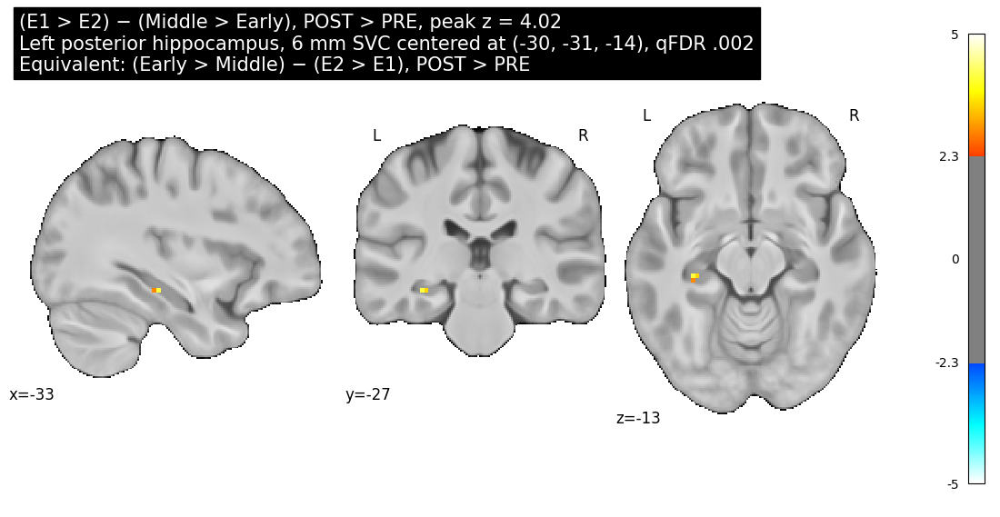


Processing: (E1 > E3) − (Late > Early), POST > PRE
Equivalent: (Early > Late) − (E3 > E1), POST > PRE
Actual contrast name: temporal_e1_gt_e3_minus_spatial_late_gt_early_post_gt_pre
z-map: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/second_level_from_smoothed5mm/maps/group_temporal_e1_gt_e3_minus_spatial_late_gt_early_post_gt_pre_smoothed5mm_zmap.nii.gz
Sphere: Montagrin_current_gt_remote_left_posterior_HPC (-30.0, -31.0, -14.5)
Plot figure: True
Peak in sphere: (-33.5, -27.0, -13.0)
z: 3.735384702682495
p unc: < .001
pBonf sphere: .005
qFDR sphere: .005


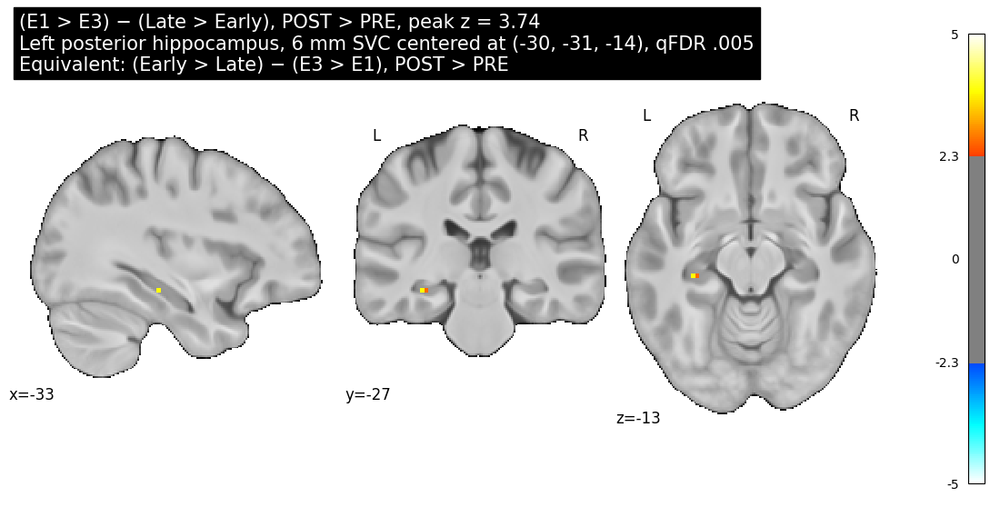


Processing: (E1 > E2) − (Early > Middle), POST > PRE
Equivalent: (Middle > Early) − (E2 > E1), POST > PRE
Actual contrast name: temporal_e1_gt_e2_minus_spatial_early_gt_middle_post_gt_pre
z-map: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/second_level_from_smoothed5mm/maps/group_temporal_e1_gt_e2_minus_spatial_early_gt_middle_post_gt_pre_smoothed5mm_zmap.nii.gz
Sphere: Montagrin_current_gt_remote_left_posterior_HPC (-30.0, -31.0, -14.5)
Plot figure: True
Peak in sphere: (-31.0, -29.5, -13.0)
z: 3.534390926361084
p unc: < .001
pBonf sphere: .011
qFDR sphere: .007


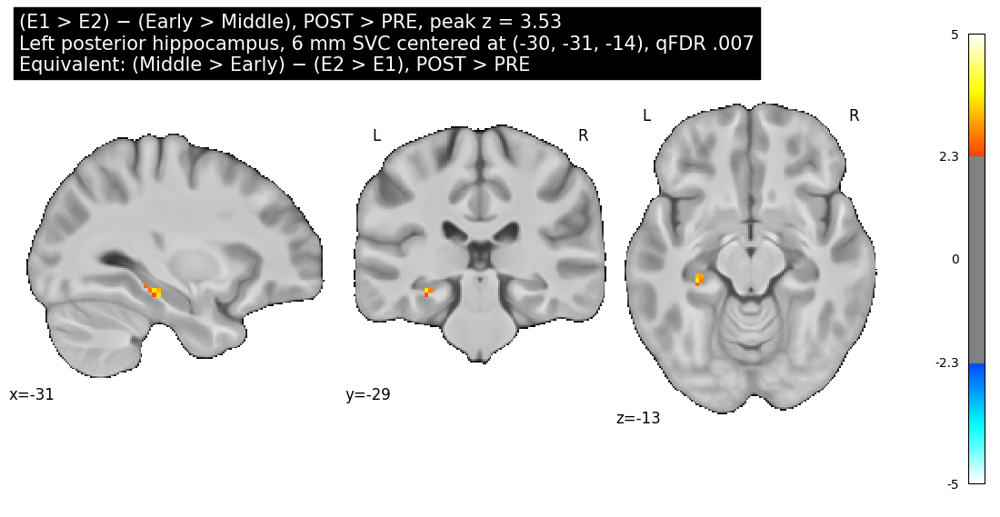


Processing: (E2 > E3) − (Late > Middle), POST > PRE
Equivalent: (Middle > Late) − (E3 > E2), POST > PRE
Actual contrast name: temporal_e2_gt_e3_minus_spatial_late_gt_middle_post_gt_pre
z-map: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/second_level_from_smoothed5mm/maps/group_temporal_e2_gt_e3_minus_spatial_late_gt_middle_post_gt_pre_smoothed5mm_zmap.nii.gz
Sphere: Bellmund_same_sequence_left_anterior_HPC (-24.0, -13.0, -20.0)
Plot figure: True
Peak in sphere: (-28.5, -14.5, -18.0)
z: 3.4390501976013184
p unc: < .001
pBonf sphere: .016
qFDR sphere: .016


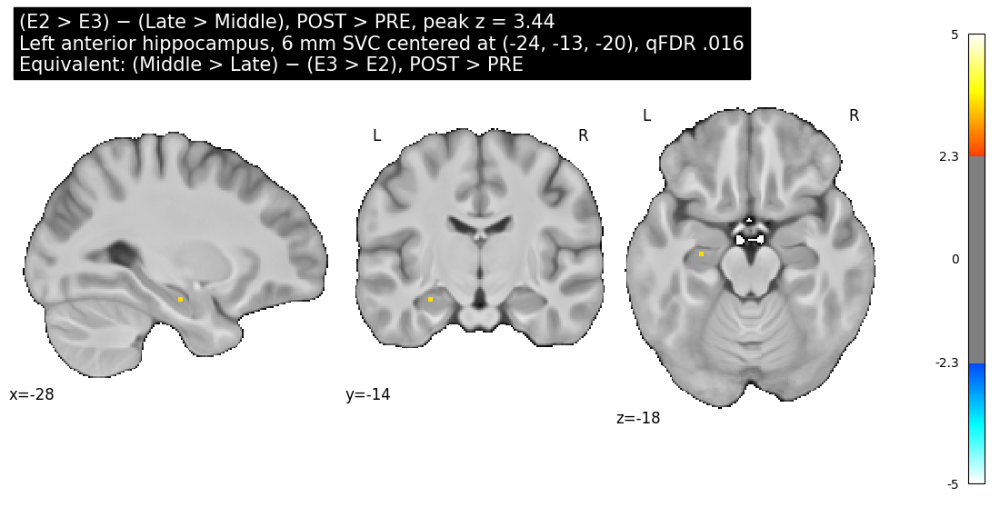


Processing: (E1 > E2) − (Late > Middle), POST > PRE
Equivalent: (Middle > Late) − (E2 > E1), POST > PRE
Actual contrast name: temporal_e1_gt_e2_minus_spatial_late_gt_middle_post_gt_pre
z-map: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/second_level_from_smoothed5mm/maps/group_temporal_e1_gt_e2_minus_spatial_late_gt_middle_post_gt_pre_smoothed5mm_zmap.nii.gz
Sphere: Montagrin_current_gt_remote_left_posterior_HPC (-30.0, -31.0, -14.5)
Plot figure: True
Peak in sphere: (-31.0, -27.0, -15.5)
z: 3.314037322998047
p unc: < .001
pBonf sphere: .026
qFDR sphere: .012


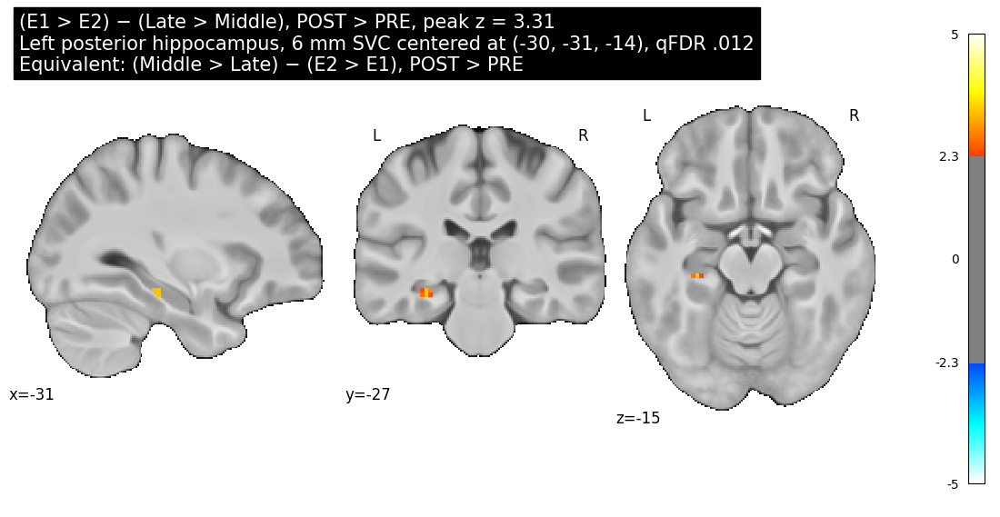


Processing: (E1 > E2) − (Middle > Late), POST > PRE
Equivalent: (Late > Middle) − (E2 > E1), POST > PRE
Actual contrast name: temporal_e1_gt_e2_minus_spatial_middle_gt_late_post_gt_pre
z-map: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/second_level_from_smoothed5mm/maps/group_temporal_e1_gt_e2_minus_spatial_middle_gt_late_post_gt_pre_smoothed5mm_zmap.nii.gz
Sphere: Montagrin_current_gt_remote_left_posterior_HPC (-30.0, -31.0, -14.5)
Plot figure: True
Peak in sphere: (-31.0, -27.0, -13.0)
z: 3.089733362197876
p unc: .001
pBonf sphere: .056
qFDR sphere: .041


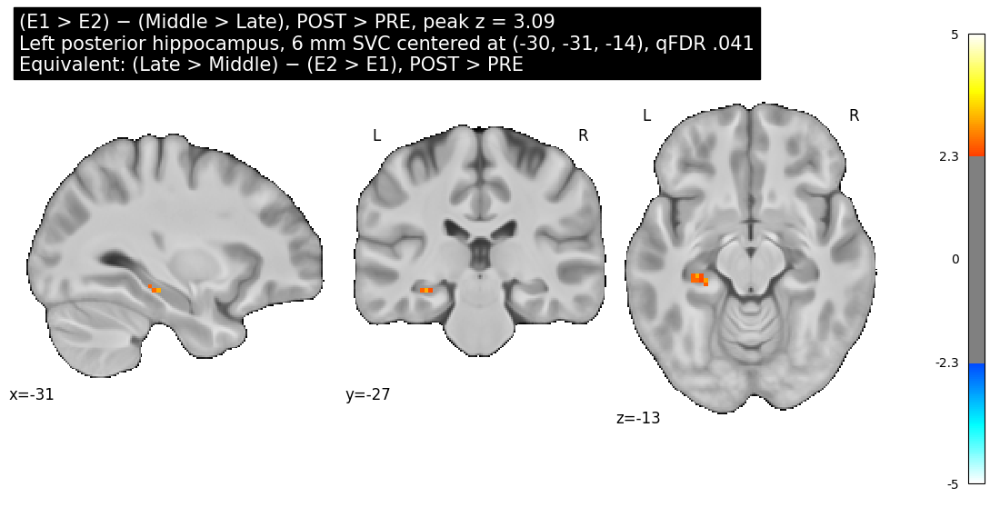


Processing: (E1 > E2) − (Late > Middle), POST > PRE
Equivalent: (Middle > Late) − (E2 > E1), POST > PRE
Actual contrast name: temporal_e1_gt_e2_minus_spatial_late_gt_middle_post_gt_pre
z-map: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/second_level_from_smoothed5mm/maps/group_temporal_e1_gt_e2_minus_spatial_late_gt_middle_post_gt_pre_smoothed5mm_zmap.nii.gz
Sphere: Bellmund_same_sequence_left_anterior_HPC (-24.0, -13.0, -20.0)
Plot figure: True
Peak in sphere: (-28.5, -14.5, -18.0)
z: 3.0088324546813965
p unc: .001
pBonf sphere: .073
qFDR sphere: .041


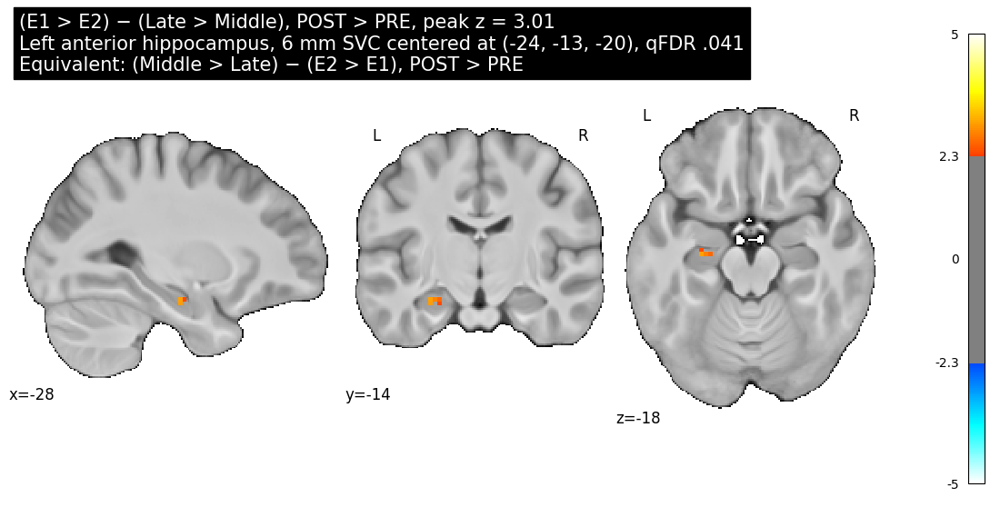


Final temporal − spatial marginal SVC results:


,Role,Contrast,Equivalent form,Region,Literature sphere,Paper,Sphere center,Peak,z,p unc.,pBonf sphere,qFDR,n voxels,Concept,Interpretation,Actual contrast name,z_map_path,sphere_mask_path,masked_z_path
0,Main E1-related posterior effect,"(E1 > E2) − (Middle > Early), POST > PRE","(Early > Middle) − (E2 > E1), POST > PRE",Left posterior hippocampus,Montagrin_current_gt_remote_left_posterior_HPC,Montagrin et al.,"(-30, -31, -14)","(-34, -27, -13)",4.02,< .001,.002,.002,56,Current > remote goals,E1-related temporal structure paired with Early/Middle route-position structure.,temporal_e1_gt_e2_minus_spatial_middle_gt_early_post_gt_pre,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/second_level_from_smoothed5mm/maps/group_temporal_e1_gt_e2_minus_spatial_middle_gt_early_post_g...,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/tables/final_temporal_minus_spatial_marginal_svc_figures/pre_post_temporal_minus_spatial_glm_po...,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/tables/final_temporal_minus_spatial_marginal_svc_figures/pre_post_temporal_minus_spatial_glm_po...
1,Large-distance E1-related posterior effect,"(E1 > E3) − (Late > Early), POST > PRE","(Early > Late) − (E3 > E1), POST > PRE",Left posterior hippocampus,Montagrin_current_gt_remote_left_posterior_HPC,Montagrin et al.,"(-30, -31, -14)","(-34, -27, -13)",3.74,< .001,.005,.005,56,Current > remote goals,Large E1/E3 episode separation paired with large Early/Late route-position separation.,temporal_e1_gt_e3_minus_spatial_late_gt_early_post_gt_pre,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/second_level_from_smoothed5mm/maps/group_temporal_e1_gt_e3_minus_spatial_late_gt_early_post_gt_...,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/tables/final_temporal_minus_spatial_marginal_svc_figures/pre_post_temporal_minus_spatial_glm_po...,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/tables/final_temporal_minus_spatial_marginal_svc_figures/pre_post_temporal_minus_spatial_glm_po...
2,E1-related posterior effect,"(E1 > E2) − (Early > Middle), POST > PRE","(Middle > Early) − (E2 > E1), POST > PRE",Left posterior hippocampus,Montagrin_current_gt_remote_left_posterior_HPC,Montagrin et al.,"(-30, -31, -14)","(-31, -30, -13)",3.53,< .001,.011,.007,56,Current > remote goals,E1/E2 episode contrast paired with the Early/Middle route-position contrast.,temporal_e1_gt_e2_minus_spatial_early_gt_middle_post_gt_pre,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/second_level_from_smoothed5mm/maps/group_temporal_e1_gt_e2_minus_spatial_early_gt_middle_post_g...,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/tables/final_temporal_minus_spatial_marginal_svc_figures/pre_post_temporal_minus_spatial_glm_po...,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/tables/final_temporal_minus_spatial_marginal_svc_figures/pre_post_temporal_minus_spatial_glm_po...
3,Main local E2/E3 anterior effect,"(E2 > E3) − (Late > Middle), POST > PRE","(Middle > Late) − (E3 > E2), POST > PRE",Left anterior hippocampus,Bellmund_same_sequence_left_anterior_HPC,Bellmund et al. 2022,"(-24, -13, -20)","(-28, -14, -18)",3.44,< .001,.016,.016,56,"Constructed event-time relations, same sequence",Local episode contrast paired with local Middle/Late route-position structure.,temporal_e2_gt_e3_minus_spatial_late_gt_middle_post_gt_pre,/media/RCPNAS/Data3/Alison_island/kroczak/island_

Saved final SVC table CSV:
/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/tables/final_temporal_minus_spatial_marginal_svc_figures/pre_post_temporal_minus_spatial_glm_FINAL_temporal_minus_spatial_marginal_SVC_results.csv

Compact slide table:


,Contrast,Equivalent form,Region,Peak,z,qFDR,Role
0,"(E1 > E2) − (Middle > Early), POST > PRE","(Early > Middle) − (E2 > E1), POST > PRE",Left posterior hippocampus,"(-34, -27, -13)",4.02,.002,Main E1-related posterior effect
1,"(E1 > E3) − (Late > Early), POST > PRE","(Early > Late) − (E3 > E1), POST > PRE",Left posterior hippocampus,"(-34, -27, -13)",3.74,.005,Large-distance E1-related posterior effect
2,"(E1 > E2) − (Early > Middle), POST > PRE","(Middle > Early) − (E2 > E1), POST > PRE",Left posterior hippocampus,"(-31, -30, -13)",3.53,.007,E1-related posterior effect
3,"(E2 > E3) − (Late > Middle), POST > PRE","(Middle > Late) − (E3 > E2), POST > PRE",Left anterior hippocampus,"(-28, -14, -18)",3.44,.016,Main local E2/E3 anterior effect
4,"(E1 > E2) − (Late > Middle), POST > PRE","(Middle > Late) − (E2 > E1), POST > PRE",Left posterior hippocampus,"(-31, -27, -16)",3.31,.012,E1-related posterior effect
5,"(E1 > E2) − (Middle > Late), POST > PRE","(Late > Middle) − (E2 > E1), POST > PRE",Left posterior hippocampus,"(-31, -27, -13)",3.09,.041,Weaker E1-related posterior effect
6,"(E1 > E2) − (Late > Middle), POST > PRE","(Middle > Late) − (E2 > E1), POST > PRE",Left anterior hippocampus,"(-28, -14, -18)",3.01,.041,Secondary anterior recurrence



Figure paths:


,result,contrast,equivalent,figure,figure_pdf
0,posterior_E1_E2_middle_early,"(E1 > E2) − (Middle > Early), POST > PRE","(Early > Middle) − (E2 > E1), POST > PRE",/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/figures/final_temporal_minus_spatial_marginal_svc_figures/pre_post_temporal_minus_spatial_glm_p...,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/figures/final_temporal_minus_spatial_marginal_svc_figures/pre_post_temporal_minus_spatial_glm_p...
1,posterior_E1_E3_late_early,"(E1 > E3) − (Late > Early), POST > PRE","(Early > Late) − (E3 > E1), POST > PRE",/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/figures/final_temporal_minus_spatial_marginal_svc_figures/pre_post_temporal_minus_spatial_glm_p...,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/figures/final_temporal_minus_spatial_marginal_svc_figures/pre_post_temporal_minus_spatial_glm_p...
2,posterior_E1_E2_early_middle,"(E1 > E2) − (Early > Middle), POST > PRE","(Middle > Early) − (E2 > E1), POST > PRE",/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/figures/final_temporal_minus_spatial_marginal_svc_figures/pre_post_temporal_minus_spatial_glm_p...,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/figures/final_temporal_minus_spatial_marginal_svc_figures/pre_post_temporal_minus_spatial_glm_p...
3,anterior_E2_E3_late_middle,"(E2 > E3) − (Late > Middle), POST > PRE","(Middle > Late) − (E3 > E2), POST > PRE",/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/figures/final_temporal_minus_spatial_marginal_svc_figures/pre_post_temporal_minus_spatial_glm_a...,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/figures/final_temporal_minus_spatial_marginal_svc_figures/pre_post_temporal_minus_spatial_glm_a...
4,posterior_E1_E2_late_middle,"(E1 > E2) − (Late > Middle), POST > PRE","(Middle > Late) − (E2 > E1), POST > PRE",/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/figures/final_temporal_minus_spatial_marginal_svc_figures/pre_post_temporal_minus_spatial_glm_p...,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/figures/final_temporal_minus_spatial_marginal_svc_figures/pre_post_temporal_minus_spatial_glm_p...
5,posterior_E1_E2_middle_late,"(E1 > E2) − (Middle > Late), POST > PRE","(Late > Middle) − (E2 > E1), POST > PRE",/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/figures/final_temporal_minus_spatial_marginal_svc_figures/pre_post_temporal_minus_spatial_glm_p...,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/figures/final_temporal_minus_spatial_marginal_svc_figures/pre_post_temporal_minus_spatial_glm_p...
6,anterior_E1_E2_late_middle_secondary,"(E1 > E2) − (Late > Middle), POST > PRE","(Middle > Late) − (E2 > E1), POST > PRE",/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/figures/final_temporal_minus_spatial_marginal_svc_figures/pre_post_temporal_minus_spatial_glm_a...,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/figures/final_temporal_minus_spatial_marginal_svc_figures/pre_post_temporal_minus_spatial_glm_a...



Recommended outputs:
Compact slide table: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/tables/final_temporal_minus_spatial_marginal_svc_figures/pre_post_temporal_minus_spatial_glm_FINAL_temporal_minus_spatial_marginal_compact_slide_table.csv
Final SVC table: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/tables/final_temporal_minus_spatial_marginal_svc_figures/pre_post_temporal_minus_spatial_glm_FINAL_temporal_minus_spatial_marginal_SVC_results.csv
Figure paths: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_temporal_minus_spatial_glm/tables/final_temporal_minus_spatial_marginal_svc_figures/pre_post_temporal_minus_spatial_glm_FINAL_temporal_minus_spatial_marginal_figure_paths.csv


In [45]:
# ============================================================
# FINAL temporal − spatial marginal SVC figures
#
# Uses exact rows from temporal_minus_spatial_literature_svc_table.
# This avoids accidentally selecting the wrong contrast file.
#
# Plot:
# 1) E1 > E2 − Middle > Early / equivalent spatial form
#    left posterior hippocampus
#
# 2) E1 > E3 − Late > Early / equivalent spatial form
#    left posterior hippocampus
#
# 3) E1 > E2 − Early > Middle / equivalent spatial form
#    left posterior hippocampus
#
# 4) E2 > E3 − Late > Middle / equivalent spatial form
#    left anterior hippocampus
#
# 5) E1 > E2 − Late > Middle / equivalent spatial form
#    left posterior hippocampus
#
# 6) E1 > E2 − Middle > Late / equivalent spatial form
#    left posterior hippocampus
#
# 7) E1 > E2 − Late > Middle / equivalent spatial form
#    left anterior hippocampus, secondary recurrence
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path

import nibabel as nib
from nilearn import plotting
from nilearn.image import load_img, new_img_like, resample_to_img, math_img
from scipy.stats import norm
from statsmodels.stats.multitest import multipletests
from IPython.display import display

# ------------------------------------------------------------
# Output folders
# ------------------------------------------------------------

final_tmsp_fig_dir = (
    dirs["figures"]
    / "final_temporal_minus_spatial_marginal_svc_figures"
)

final_tmsp_table_dir = (
    dirs["tables"]
    / "final_temporal_minus_spatial_marginal_svc_figures"
)

final_tmsp_fig_dir.mkdir(parents=True, exist_ok=True)
final_tmsp_table_dir.mkdir(parents=True, exist_ok=True)

print("Saving final temporal − spatial marginal figures to:", final_tmsp_fig_dir)
print("Saving final temporal − spatial marginal tables to:", final_tmsp_table_dir)

# ------------------------------------------------------------
# Settings
# ------------------------------------------------------------

SVC_RADIUS_MM = 6.0
DISPLAY_THRESHOLD_Z = 2.33
VMAX = 5.0

assert "temporal_minus_spatial_literature_svc_table" in globals(), (
    "Run the temporal − spatial literature SVC exploration cell first."
)

assert "mean_t1w_img" in globals() and mean_t1w_img is not None, (
    "mean_t1w_img is missing. Rerun the common input loading cell before plotting."
)

# Use common T1 background, same convention as previous project figures.
BG_IMG = mean_t1w_img if globals().get("USE_MEAN_T1W_BACKGROUND", True) else None

if BG_IMG is mean_t1w_img:
    print("Using common mean_t1w_img background.")
else:
    print("USE_MEAN_T1W_BACKGROUND is False, so bg_img=None.")


# ------------------------------------------------------------
# Helper functions
# ------------------------------------------------------------

def fmt_p(x):
    if pd.isna(x):
        return "—"
    x = float(x)
    if x < 0.001:
        return "< .001"
    return f"{x:.3f}".replace("0.", ".")


def fmt_coord(x, y, z):
    return f"({x:.0f}, {y:.0f}, {z:.0f})"


def safe_filename(text):
    return (
        str(text)
        .replace(" ", "_")
        .replace("/", "-")
        .replace(">", "gt")
        .replace("<", "lt")
        .replace("−", "minus")
        .replace("–", "-")
        .replace("×", "x")
        .replace("(", "")
        .replace(")", "")
        .replace(",", "")
        .replace(".", "p")
        .replace(":", "")
        .replace(";", "")
    )


def make_sphere_mask_img(reference_img, center_mni, radius_mm):
    ref_img = load_img(reference_img) if isinstance(reference_img, (str, Path)) else reference_img

    shape = ref_img.shape[:3]
    affine = ref_img.affine

    ijk = np.array(
        np.meshgrid(
            np.arange(shape[0]),
            np.arange(shape[1]),
            np.arange(shape[2]),
            indexing="ij",
        )
    ).reshape(3, -1).T

    xyz = nib.affines.apply_affine(affine, ijk)
    center = np.array(center_mni, dtype=float)

    distances = np.linalg.norm(xyz - center, axis=1)
    sphere_data = (distances <= radius_mm).reshape(shape).astype(np.uint8)

    return new_img_like(ref_img, sphere_data)


def run_sphere_svc(z_img, sphere_img, direction="positive"):
    sphere_resampled = resample_to_img(
        sphere_img,
        z_img,
        interpolation="nearest",
        force_resample=True,
        copy_header=True,
    )

    z_data = z_img.get_fdata()
    sphere_data = sphere_resampled.get_fdata() > 0

    n_voxels = int(sphere_data.sum())
    assert n_voxels > 0, "Sphere mask has zero voxels."

    z_inside = z_data[sphere_data]

    if direction == "positive":
        peak_index = int(np.nanargmax(z_inside))
        peak_z = float(z_inside[peak_index])
        p_values = norm.sf(z_inside)
        peak_p_unc = float(norm.sf(peak_z))
    else:
        peak_index = int(np.nanargmin(z_inside))
        peak_z = float(z_inside[peak_index])
        p_values = norm.sf(-z_inside)
        peak_p_unc = float(norm.sf(-peak_z))

    _, q_values, _, _ = multipletests(
        p_values,
        alpha=0.05,
        method="fdr_bh",
    )

    sphere_indices = np.array(np.where(sphere_data)).T
    peak_ijk = sphere_indices[peak_index]
    peak_mni = nib.affines.apply_affine(z_img.affine, peak_ijk)

    peak_q_fdr = float(q_values[peak_index])
    peak_p_bonf = float(min(peak_p_unc * n_voxels, 1.0))

    return {
        "n_voxels_in_sphere": n_voxels,
        "peak_x": float(peak_mni[0]),
        "peak_y": float(peak_mni[1]),
        "peak_z_coord": float(peak_mni[2]),
        "peak_z_stat": peak_z,
        "peak_p_uncorrected": peak_p_unc,
        "peak_p_bonferroni_within_sphere": peak_p_bonf,
        "peak_q_fdr_within_sphere": peak_q_fdr,
        "n_voxels_p_unc_lt_0_001": int(np.sum(p_values < 0.001)),
        "n_voxels_fdr_q_lt_0_05": int(np.sum(q_values < 0.05)),
    }


def select_best_tmsp_svc_row(
    contrast_exact,
    roi_contains,
    expected_peak=None,
    max_peak_distance_mm=8.0,
):
    """
    Select exact row from the previously computed temporal − spatial SVC table.
    This uses the already correct table rather than token-searching second_level_table.
    """
    df = temporal_minus_spatial_literature_svc_table.copy()

    mask = df["contrast"].astype(str).eq(str(contrast_exact))

    for token in roi_contains:
        token = str(token)
        mask &= df["literature_roi"].astype(str).str.contains(token, case=False, regex=False)

    candidate = df[mask].copy()

    if expected_peak is not None and len(candidate) > 0:
        expected_peak = np.array(expected_peak, dtype=float)

        candidate["distance_to_expected_peak"] = np.sqrt(
            (candidate["peak_x"] - expected_peak[0]) ** 2
            + (candidate["peak_y"] - expected_peak[1]) ** 2
            + (candidate["peak_z_coord"] - expected_peak[2]) ** 2
        )

        candidate = candidate[
            candidate["distance_to_expected_peak"] <= max_peak_distance_mm
        ].copy()

    if len(candidate) == 0:
        print("\nNo candidate rows found.")
        print("contrast_exact:", contrast_exact)
        print("roi_contains:", roi_contains)
        print("expected_peak:", expected_peak)

        available_cols = [
            c for c in [
                "contrast",
                "paper",
                "literature_roi",
                "peak_x",
                "peak_y",
                "peak_z_coord",
                "peak_z_stat",
                "peak_q_fdr_within_sphere",
            ]
            if c in df.columns
        ]

        print("\nAvailable rows with similar contrast prefix:")
        display(
            df[
                df["contrast"].astype(str).str.contains(
                    contrast_exact.split("_post_gt_pre")[0][:35],
                    case=False,
                    regex=False,
                )
            ][available_cols].head(20)
        )

        raise ValueError("Could not select temporal − spatial SVC row.")

    candidate = candidate.sort_values(
        ["peak_q_fdr_within_sphere", "peak_z_stat"],
        ascending=[True, False],
    ).reset_index(drop=True)

    print("\nSelected row candidates:")
    display(
        candidate[
            [
                "contrast",
                "paper",
                "literature_roi",
                "peak_x",
                "peak_y",
                "peak_z_coord",
                "peak_z_stat",
                "peak_p_bonferroni_within_sphere",
                "peak_q_fdr_within_sphere",
                "peak_distance_from_literature_center_mm",
                "z_map_path",
            ]
        ].head(10)
    )

    return candidate.iloc[0].to_dict()


# ------------------------------------------------------------
# Select exact previously-correct SVC rows
# ------------------------------------------------------------

# 1. Strong posterior E1 > E2 / Middle > Early
row_posterior_e1e2_middle_early = select_best_tmsp_svc_row(
    contrast_exact="temporal_e1_gt_e2_minus_spatial_middle_gt_early_post_gt_pre",
    roi_contains=["Montagrin_current_gt_remote_left_posterior_HPC"],
    expected_peak=(-34, -27, -13),
    max_peak_distance_mm=8.0,
)

# 2. Large-distance posterior E1 > E3 / Late > Early
row_posterior_e1e3_late_early = select_best_tmsp_svc_row(
    contrast_exact="temporal_e1_gt_e3_minus_spatial_late_gt_early_post_gt_pre",
    roi_contains=["Montagrin_current_gt_remote_left_posterior_HPC"],
    expected_peak=(-34, -27, -13),
    max_peak_distance_mm=8.0,
)

# 3. Posterior E1 > E2 / Early > Middle
row_posterior_e1e2_early_middle = select_best_tmsp_svc_row(
    contrast_exact="temporal_e1_gt_e2_minus_spatial_early_gt_middle_post_gt_pre",
    roi_contains=["Montagrin_current_gt_remote_left_posterior_HPC"],
    expected_peak=(-31, -30, -13),
    max_peak_distance_mm=8.0,
)

# 4. Main anterior E2 > E3 / Late > Middle
row_anterior_e2e3_late_middle = select_best_tmsp_svc_row(
    contrast_exact="temporal_e2_gt_e3_minus_spatial_late_gt_middle_post_gt_pre",
    roi_contains=["Bellmund"],
    expected_peak=(-28, -14, -18),
    max_peak_distance_mm=8.0,
)

# 5. Posterior E1 > E2 / Late > Middle
row_posterior_e1e2_late_middle = select_best_tmsp_svc_row(
    contrast_exact="temporal_e1_gt_e2_minus_spatial_late_gt_middle_post_gt_pre",
    roi_contains=["Montagrin_current_gt_remote_left_posterior_HPC"],
    expected_peak=(-31, -27, -16),
    max_peak_distance_mm=8.0,
)

# 6. Posterior E1 > E2 / Middle > Late
row_posterior_e1e2_middle_late = select_best_tmsp_svc_row(
    contrast_exact="temporal_e1_gt_e2_minus_spatial_middle_gt_late_post_gt_pre",
    roi_contains=["Montagrin_current_gt_remote_left_posterior_HPC"],
    expected_peak=(-31, -27, -13),
    max_peak_distance_mm=8.0,
)

# 7. Secondary anterior recurrence for E1 > E2 / Late > Middle
row_anterior_e1e2_late_middle_secondary = select_best_tmsp_svc_row(
    contrast_exact="temporal_e1_gt_e2_minus_spatial_late_gt_middle_post_gt_pre",
    roi_contains=["Bellmund"],
    expected_peak=(-28, -14, -18),
    max_peak_distance_mm=8.0,
)


FINAL_TMSP_EFFECTS = [
    {
        "row": row_posterior_e1e2_middle_early,
        "result_name": "posterior_E1_E2_middle_early",
        "plot_figure": True,
        "contrast_label_final": "(E1 > E2) − (Middle > Early), POST > PRE",
        "equivalent_label": "(Early > Middle) − (E2 > E1), POST > PRE",
        "region_label": "Left posterior hippocampus",
        "role": "Main E1-related posterior effect",
        "interpretation": "E1-related temporal structure paired with Early/Middle route-position structure.",
    },
    {
        "row": row_posterior_e1e3_late_early,
        "result_name": "posterior_E1_E3_late_early",
        "plot_figure": True,
        "contrast_label_final": "(E1 > E3) − (Late > Early), POST > PRE",
        "equivalent_label": "(Early > Late) − (E3 > E1), POST > PRE",
        "region_label": "Left posterior hippocampus",
        "role": "Large-distance E1-related posterior effect",
        "interpretation": "Large E1/E3 episode separation paired with large Early/Late route-position separation.",
    },
    {
        "row": row_posterior_e1e2_early_middle,
        "result_name": "posterior_E1_E2_early_middle",
        "plot_figure": True,
        "contrast_label_final": "(E1 > E2) − (Early > Middle), POST > PRE",
        "equivalent_label": "(Middle > Early) − (E2 > E1), POST > PRE",
        "region_label": "Left posterior hippocampus",
        "role": "E1-related posterior effect",
        "interpretation": "E1/E2 episode contrast paired with the Early/Middle route-position contrast.",
    },
    {
        "row": row_anterior_e2e3_late_middle,
        "result_name": "anterior_E2_E3_late_middle",
        "plot_figure": True,
        "contrast_label_final": "(E2 > E3) − (Late > Middle), POST > PRE",
        "equivalent_label": "(Middle > Late) − (E3 > E2), POST > PRE",
        "region_label": "Left anterior hippocampus",
        "role": "Main local E2/E3 anterior effect",
        "interpretation": "Local episode contrast paired with local Middle/Late route-position structure.",
    },
    {
        "row": row_posterior_e1e2_late_middle,
        "result_name": "posterior_E1_E2_late_middle",
        "plot_figure": True,
        "contrast_label_final": "(E1 > E2) − (Late > Middle), POST > PRE",
        "equivalent_label": "(Middle > Late) − (E2 > E1), POST > PRE",
        "region_label": "Left posterior hippocampus",
        "role": "E1-related posterior effect",
        "interpretation": "E1/E2 episode contrast paired with the Late/Middle route-position contrast.",
    },
    {
        "row": row_posterior_e1e2_middle_late,
        "result_name": "posterior_E1_E2_middle_late",
        "plot_figure": True,
        "contrast_label_final": "(E1 > E2) − (Middle > Late), POST > PRE",
        "equivalent_label": "(Late > Middle) − (E2 > E1), POST > PRE",
        "region_label": "Left posterior hippocampus",
        "role": "Weaker E1-related posterior effect",
        "interpretation": "Weaker recurrence of the E1-related posterior hippocampal pattern.",
    },
    {
        "row": row_anterior_e1e2_late_middle_secondary,
        "result_name": "anterior_E1_E2_late_middle_secondary",
        "plot_figure": True,
        "contrast_label_final": "(E1 > E2) − (Late > Middle), POST > PRE",
        "equivalent_label": "(Middle > Late) − (E2 > E1), POST > PRE",
        "region_label": "Left anterior hippocampus",
        "role": "Secondary anterior recurrence",
        "interpretation": "Weaker recurrence of the anterior hippocampal local relational pattern.",
    },
]


# ------------------------------------------------------------
# Main loop: recompute SVC and plot selected figures
# ------------------------------------------------------------

final_tmsp_svc_rows = []
figure_paths = []

for effect in FINAL_TMSP_EFFECTS:

    row = effect["row"]

    contrast_name = row["contrast"]
    z_map_path = Path(row["z_map_path"])

    sphere_center = (
        float(row["sphere_center_x"]),
        float(row["sphere_center_y"]),
        float(row["sphere_center_z"]),
    )

    print("\n" + "=" * 90)
    print("Processing:", effect["contrast_label_final"])
    print("Equivalent:", effect["equivalent_label"])
    print("Actual contrast name:", contrast_name)
    print("z-map:", z_map_path)
    print("Sphere:", row["literature_roi"], sphere_center)
    print("Plot figure:", effect["plot_figure"])

    z_img = load_img(str(z_map_path))

    svc_sphere_img = make_sphere_mask_img(
        reference_img=z_img,
        center_mni=sphere_center,
        radius_mm=SVC_RADIUS_MM,
    )

    svc_sphere_resampled = resample_to_img(
        svc_sphere_img,
        z_img,
        interpolation="nearest",
        force_resample=True,
        copy_header=True,
    )

    svc_sphere_path = (
        final_tmsp_table_dir
        / f"{ANALYSIS_NAME}_{effect['result_name']}_6mm_SVC_sphere_mask.nii.gz"
    )
    svc_sphere_resampled.to_filename(str(svc_sphere_path))

    svc_result = run_sphere_svc(
        z_img=z_img,
        sphere_img=svc_sphere_resampled,
        direction="positive",
    )

    peak = (
        svc_result["peak_x"],
        svc_result["peak_y"],
        svc_result["peak_z_coord"],
    )

    q_svc_label = fmt_p(svc_result["peak_q_fdr_within_sphere"])
    p_unc_label = fmt_p(svc_result["peak_p_uncorrected"])
    p_bonf_label = fmt_p(svc_result["peak_p_bonferroni_within_sphere"])

    print("Peak in sphere:", peak)
    print("z:", svc_result["peak_z_stat"])
    print("p unc:", p_unc_label)
    print("pBonf sphere:", p_bonf_label)
    print("qFDR sphere:", q_svc_label)

    masked_z_img = math_img(
        "zmap * (sphere > 0)",
        zmap=z_img,
        sphere=svc_sphere_resampled,
    )

    masked_z_path = (
        final_tmsp_table_dir
        / f"{ANALYSIS_NAME}_{effect['result_name']}_zmap_masked_to_6mm_SVC_sphere.nii.gz"
    )
    masked_z_img.to_filename(str(masked_z_path))

    final_tmsp_svc_rows.append({
        "Role": effect["role"],
        "Contrast": effect["contrast_label_final"],
        "Equivalent form": effect["equivalent_label"],
        "Region": effect["region_label"],
        "Literature sphere": row["literature_roi"],
        "Paper": row["paper"],
        "Sphere center": fmt_coord(*sphere_center),
        "Peak": fmt_coord(*peak),
        "z": f"{svc_result['peak_z_stat']:.2f}",
        "p unc.": p_unc_label,
        "pBonf sphere": p_bonf_label,
        "qFDR": q_svc_label,
        "n voxels": svc_result["n_voxels_in_sphere"],
        "Concept": row["concept"],
        "Interpretation": effect["interpretation"],
        "Actual contrast name": contrast_name,
        "z_map_path": str(z_map_path),
        "sphere_mask_path": str(svc_sphere_path),
        "masked_z_path": str(masked_z_path),
    })

    if not effect["plot_figure"]:
        continue

    title_text = (
        f"{effect['contrast_label_final']}, peak z = {svc_result['peak_z_stat']:.2f}\n"
        f"{effect['region_label']}, 6 mm SVC centered at "
        f"{fmt_coord(*sphere_center)}, qFDR {q_svc_label}\n"
        f"Equivalent: {effect['equivalent_label']}"
    )

    fig_png = (
        final_tmsp_fig_dir
        / f"{ANALYSIS_NAME}_{effect['result_name']}_SVC_masked.png"
    )

    fig_pdf = (
        final_tmsp_fig_dir
        / f"{ANALYSIS_NAME}_{effect['result_name']}_SVC_masked.pdf"
    )

    fig = plt.figure(figsize=(10.8, 5.5), facecolor="white")

    stat_display = plotting.plot_stat_map(
        masked_z_img,
        bg_img=BG_IMG,
        threshold=DISPLAY_THRESHOLD_Z,
        vmax=VMAX,
        cmap="cold_hot",
        symmetric_cbar=True,
        display_mode="ortho",
        cut_coords=peak,
        black_bg=False,
        colorbar=True,
        annotate=True,
        draw_cross=False,
        dim=-0.2,
        figure=fig,
        title=title_text,
    )

    fig.savefig(fig_png, dpi=300, bbox_inches="tight", facecolor="white")
    fig.savefig(fig_pdf, bbox_inches="tight", facecolor="white")
    plt.show()

    stat_display.close()
    plt.close(fig)

    figure_paths.append({
        "result": effect["result_name"],
        "contrast": effect["contrast_label_final"],
        "equivalent": effect["equivalent_label"],
        "figure": str(fig_png),
        "figure_pdf": str(fig_pdf),
    })


# ------------------------------------------------------------
# Save final tables
# ------------------------------------------------------------

final_tmsp_svc_table = pd.DataFrame(final_tmsp_svc_rows)

final_tmsp_svc_csv = (
    final_tmsp_table_dir
    / f"{ANALYSIS_NAME}_FINAL_temporal_minus_spatial_marginal_SVC_results.csv"
)

final_tmsp_svc_table.to_csv(final_tmsp_svc_csv, index=False)

print("\nFinal temporal − spatial marginal SVC results:")
display(final_tmsp_svc_table)

print("Saved final SVC table CSV:")
print(final_tmsp_svc_csv)

# Compact table
compact_tmsp_table = final_tmsp_svc_table[
    [
        "Contrast",
        "Equivalent form",
        "Region",
        "Peak",
        "z",
        "qFDR",
        "Role",
    ]
].copy()

compact_tmsp_csv = (
    final_tmsp_table_dir
    / f"{ANALYSIS_NAME}_FINAL_temporal_minus_spatial_marginal_compact_slide_table.csv"
)

compact_tmsp_table.to_csv(compact_tmsp_csv, index=False)

print("\nCompact slide table:")
display(compact_tmsp_table)

figure_paths_df = pd.DataFrame(figure_paths)

figure_paths_csv = (
    final_tmsp_table_dir
    / f"{ANALYSIS_NAME}_FINAL_temporal_minus_spatial_marginal_figure_paths.csv"
)

figure_paths_df.to_csv(figure_paths_csv, index=False)

print("\nFigure paths:")
display(figure_paths_df)

print("\nRecommended outputs:")
print("Compact slide table:", compact_tmsp_csv)
print("Final SVC table:", final_tmsp_svc_csv)
print("Figure paths:", figure_paths_csv)